# Project Python Foundations: FoodHub Data Analysis

### Context

The number of restaurants in New York is increasing day by day. Lots of students and busy professionals rely on those restaurants due to their hectic lifestyles. Online food delivery service is a great option for them. It provides them with good food from their favorite restaurants. A food aggregator company FoodHub offers access to multiple restaurants through a single smartphone app.

The app allows the restaurants to receive a direct online order from a customer. The app assigns a delivery person from the company to pick up the order after it is confirmed by the restaurant. The delivery person then uses the map to reach the restaurant and waits for the food package. Once the food package is handed over to the delivery person, he/she confirms the pick-up in the app and travels to the customer's location to deliver the food. The delivery person confirms the drop-off in the app after delivering the food package to the customer. The customer can rate the order in the app. The food aggregator earns money by collecting a fixed margin of the delivery order from the restaurants.

### Objective

The food aggregator company has stored the data of the different orders made by the registered customers in their online portal. They want to analyze the data to get a fair idea about the demand of different restaurants which will help them in enhancing their customer experience. Suppose you are hired as a Data Scientist in this company and the Data Science team has shared some of the key questions that need to be answered. Perform the data analysis to find answers to these questions that will help the company to improve the business.

### Data Description

The data contains the different data related to a food order. The detailed data dictionary is given below.

### Data Dictionary

* order_id: Unique ID of the order
* customer_id: ID of the customer who ordered the food
* restaurant_name: Name of the restaurant
* cuisine_type: Cuisine ordered by the customer
* cost_of_the_order: Cost of the order
* day_of_the_week: Indicates whether the order is placed on a weekday or weekend (The weekday is from Monday to Friday and the weekend is Saturday and Sunday)
* rating: Rating given by the customer out of 5
* food_preparation_time: Time (in minutes) taken by the restaurant to prepare the food. This is calculated by taking the difference between the timestamps of the restaurant's order confirmation and the delivery person's pick-up confirmation.
* delivery_time: Time (in minutes) taken by the delivery person to deliver the food package. This is calculated by taking the difference between the timestamps of the delivery person's pick-up confirmation and drop-off information

### Let us start by importing the required libraries

In [155]:
# Installing the libraries with the specified version.
#!export PATH="/Users/kamalakanakasundaram/.local/bin:$PATH"
!export PATH="/root/.local/bin:$PATH"
#!pip install numpy==1.25.2 pandas==1.5.3 matplotlib==3.7.1 seaborn==0.13.1 -q --user
!pip install numpy==1.25.2 pandas==2.2.2 matplotlib==3.8.0 seaborn==0.13.1 -q --user
#installed the below package to try and solve Glyph 140 and Glyph 142 issue with chinese restaurant_names. Didnt work
# !apt-get install -y fonts-noto-cjk  # For Google Colab

**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again.*

In [156]:
# import libraries for data manipulation
import numpy as np
import pandas as pd

# import libraries for data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# plt.rcParams.update(plt.rcParamsDefault) - reset to undo the changes that was done to font family while trying to fix the chinese restaurant name problem


In [157]:
# import matplotlib.pyplot as plt - run this after reseting the font params before

### Understanding the structure of the data

In [158]:
# uncomment and run the following lines for Google Colab
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [159]:
# Write your code here to read the data
#the food hub order csv file is in the same directory as the Learner Notebook.So dont have to specify the path of csv for Jupiter
# mentioned utf-8 encoding to read chinese names and non-ASCII characters
foodhub_df = pd.read_csv("/content/drive/MyDrive/Python Foundations/Project - Food Hub/foodhub_order.csv", encoding='utf-8')
#foodhub_df = pd.read_csv("foodhub_order.csv")

In [160]:
# Write your code here to view the first 5 rows
foodhub_df.head()

,order_id,customer_id,restaurant_name,cuisine_type,cost_of_the_order,day_of_the_week,rating,food_preparation_time,delivery_time
0,1477147,337525,Hangawi,Korean,30.75,Weekend,Not given,25,20
1,1477685,358141,Blue Ribbon Sushi Izakaya,Japanese,12.08,Weekend,Not given,25,23
2,1477070,66393,Cafe Habana,Mexican,12.23,Weekday,5,23,28
3,1477334,106968,Blue Ribbon Fried Chicken,American,29.20,Weekend,3,25,15
4,1478249,76942,Dirty Bird to Go,American,11.59,Weekday,4,25,24


### **Question 1:** How many rows and columns are present in the data? [0.5 mark]

In [161]:
# Write your code here
#shape attribute provide the number of rows and columns in the data set
print("There are",foodhub_df.shape[0], "rows and", foodhub_df.shape[1], "columns in the data")

There are 1898 rows and 9 columns in the data


#### Observations:


### **Question 2:** What are the datatypes of the different columns in the dataset? (The info() function can be used) [0.5 mark]

In [162]:
# Write your code here
#info funcation provides info on the datatyeps of different columns in the dataset
foodhub_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1898 entries, 0 to 1897
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   order_id               1898 non-null   int64  
 1   customer_id            1898 non-null   int64  
 2   restaurant_name        1898 non-null   object 
 3   cuisine_type           1898 non-null   object 
 4   cost_of_the_order      1898 non-null   float64
 5   day_of_the_week        1898 non-null   object 
 6   rating                 1898 non-null   object 
 7   food_preparation_time  1898 non-null   int64  
 8   delivery_time          1898 non-null   int64  
dtypes: float64(1), int64(4), object(4)
memory usage: 133.6+ KB


#### Observations:
- There are 5 numerical columns and 4 object type columns.
- rating column is read as object column,but it should be a numerical column.We need to investigate more on the rating column.
- There are no null values in any of the columns in the data set.

### **Question 3:** Are there any missing values in the data? If yes, treat them using an appropriate method. [1 mark]

In [163]:
#check for missing values in the data set
print(foodhub_df.isnull().sum())

# From the head() function, we see that the rating column has values "Not given" and the rating column is read as object type.Lets check the unique values of rating column
foodhub_df["rating"].unique()

order_id                 0
customer_id              0
restaurant_name          0
cuisine_type             0
cost_of_the_order        0
day_of_the_week          0
rating                   0
food_preparation_time    0
delivery_time            0
dtype: int64


array(['Not given', '5', '3', '4'], dtype=object)

In [164]:
# rating has values -'Not given',3,4,5 .
# replacing 'Not given' values with nan
foodhub_df['rating'] = foodhub_df['rating'].replace(['Not given'],np.nan)

# When we replace 'Not given' value with Nan, we cannot convert the rating column to int data type because Nan is a floating point data type.Hence we need to convert rating column to float data type.
foodhub_df['rating'] = foodhub_df['rating'].astype(float)

#check the rating data type using info function again
foodhub_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1898 entries, 0 to 1897
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   order_id               1898 non-null   int64  
 1   customer_id            1898 non-null   int64  
 2   restaurant_name        1898 non-null   object 
 3   cuisine_type           1898 non-null   object 
 4   cost_of_the_order      1898 non-null   float64
 5   day_of_the_week        1898 non-null   object 
 6   rating                 1162 non-null   float64
 7   food_preparation_time  1898 non-null   int64  
 8   delivery_time          1898 non-null   int64  
dtypes: float64(2), int64(4), object(3)
memory usage: 133.6+ KB


#### Observations:
- rating column data type is now fixed.
- There are 6 numerical values columns and 3 object type columns in the dataset.

### **Question 4:** Check the statistical summary of the data. What is the minimum, average, and maximum time it takes for food to be prepared once an order is placed? [2 marks]

In [165]:
foodhub_df.describe().T

,count,mean,std,min,25%,50%,75%,max
order_id,1898.0,1.477496e+06,548.049724,1476547.00,1477021.25,1477495.50,1.477970e+06,1478444.00
customer_id,1898.0,1.711685e+05,113698.139743,1311.00,77787.75,128600.00,2.705250e+05,405334.00
cost_of_the_order,1898.0,1.649885e+01,7.483812,4.47,12.08,14.14,2.229750e+01,35.41
rating,1162.0,4.344234e+00,0.741478,3.00,4.00,5.00,5.000000e+00,5.00
food_preparation_time,1898.0,2.737197e+01,4.632481,20.00,23.00,27.00,3.100000e+01,35.00
delivery_time,1898.0,2.416175e+01,4.972637,15.00,20.00,25.00,2.800000e+01,33.00


#### Observations:
- we can ignore order id and customer id data since they are unique identifiers.
- Food Preparation time: The minimum, average and maximum time it takes for food to be prepared once an order is placed is 20 minutes, 27.37 minutes and 35 minutes respectively.
- cost of the order: Average cost of the order is 16.49885 dollars .Minimum cost is 4.47 dollars and maximum cost is 35.41 dollars.75% of cost of the order is less than or equal to 22.29 dollars.
- rating: Average customer rating is 4.34. Minimum rating is 3 and the maximum rating is 5.Median rating is 5.0
- Delivery time: On an average, it takes 24.16 minutes to deliver the food to customer once its picked. The minimum delivery time is 15 minutes and the maximum delivery time is 33 minutes
- There is not much difference between 75% and max value in each of the columns which indicates that there may not be any outliers in any of the columns.

### **Question 5:** How many orders are not rated? [1 mark]

In [166]:
foodhub_df['rating'].isnull().sum()


736

#### Observations:
- There are 736 orders that are not rated by customer. 38.78% of the orders are not rated. We can explore more about these orders and see if we want to treat the missing values.We will need to understand the distributions of features in the data and the relationships that exist in the data to treat the missing values.

**Lets debug the errors we are seeing while ploting various plots**

In [167]:
# Warning while creating plots - /usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 140 (\x8c) missing from current font.
# fig.canvas.draw()
for index, row in foodhub_df.iterrows():
    if '\x8c' in row['restaurant_name'] or '\x8c' in row['cuisine_type']:
        print(f"Found Glyph 140 in row {index}:")
        print(row)

Found Glyph 140 in row 10:
order_id                                    1477895
customer_id                                  143926
restaurant_name          Big Wong Restaurant _¤¾Ñ¼
cuisine_type                                Chinese
cost_of_the_order                              5.92
day_of_the_week                             Weekday
rating                                          NaN
food_preparation_time                            34
delivery_time                                    28
Name: 10, dtype: object


In [168]:
# /usr/local/lib/python3.10/dist-packages/seaborn/utils.py:61: UserWarning: Glyph 142 (\x8e) missing from current font.
# fig.canvas.draw()
for index, row in foodhub_df.iterrows():
    if '\x8e' in row['restaurant_name'] or '\x8e' in row['cuisine_type']:
        print(f"Found Glyph 142 in row {index}:")
        print(row)

Found Glyph 142 in row 107:
order_id                                  1477978
customer_id                                259341
restaurant_name          Joe's Shanghai _Àü£¾÷´
cuisine_type                              Chinese
cost_of_the_order                           15.81
day_of_the_week                           Weekend
rating                                        5.0
food_preparation_time                          20
delivery_time                                  26
Name: 107, dtype: object
Found Glyph 142 in row 810:
order_id                                  1477202
customer_id                                259341
restaurant_name          Joe's Shanghai _Àü£¾÷´
cuisine_type                              Chinese
cost_of_the_order                            16.1
day_of_the_week                           Weekend
rating                                        5.0
food_preparation_time                          31
delivery_time                                  22
Name: 810, dtype: o

In [169]:
#lets check if Joe's Shangai name is the same across all rows
#check if foodhub_df contains Joe's Shangai
#foodhub_df[foodhub_df['restaurant_name']=="Joe's Shanghai _Àü£¾÷´"]
foodhub_df[foodhub_df['restaurant_name'].str.contains("Joe's Shanghai")]

,order_id,customer_id,restaurant_name,cuisine_type,cost_of_the_order,day_of_the_week,rating,food_preparation_time,delivery_time
107,1477978,259341,Joe's Shanghai _Àü£¾÷´,Chinese,15.81,Weekend,5.0,20,26
810,1477202,259341,Joe's Shanghai _Àü£¾÷´,Chinese,16.10,Weekend,5.0,31,22
1377,1477940,42274,Joe's Shanghai _Àü£¾÷´,Chinese,16.15,Weekend,3.0,33,20
1600,1477379,145962,Joe's Shanghai _Àü£¾÷´,Chinese,22.31,Weekday,3.0,27,31


In [170]:
# replace the control character with blank space
# Tried couple of options like installing different fonts,but it didnt work
for index, row in foodhub_df.iterrows():
    if '\x8c' in row['restaurant_name']:
        foodhub_df.loc[index, 'restaurant_name'] = row['restaurant_name'].replace('\x8c', ' ')
    if '\x8e' in row['restaurant_name']:
        foodhub_df.loc[index, 'restaurant_name'] = row['restaurant_name'].replace('\x8e', ' ')

### Exploratory Data Analysis (EDA)

### Univariate Analysis

### **Question 6:** Explore all the variables and provide observations on their distributions. (Generally, histograms, boxplots, countplots, etc. are used for univariate exploration.) [9 marks]

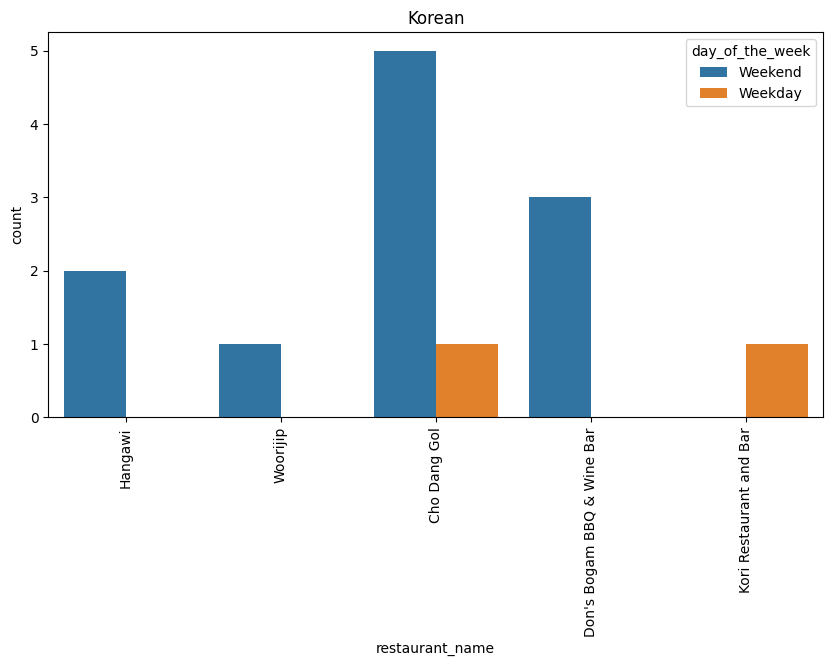

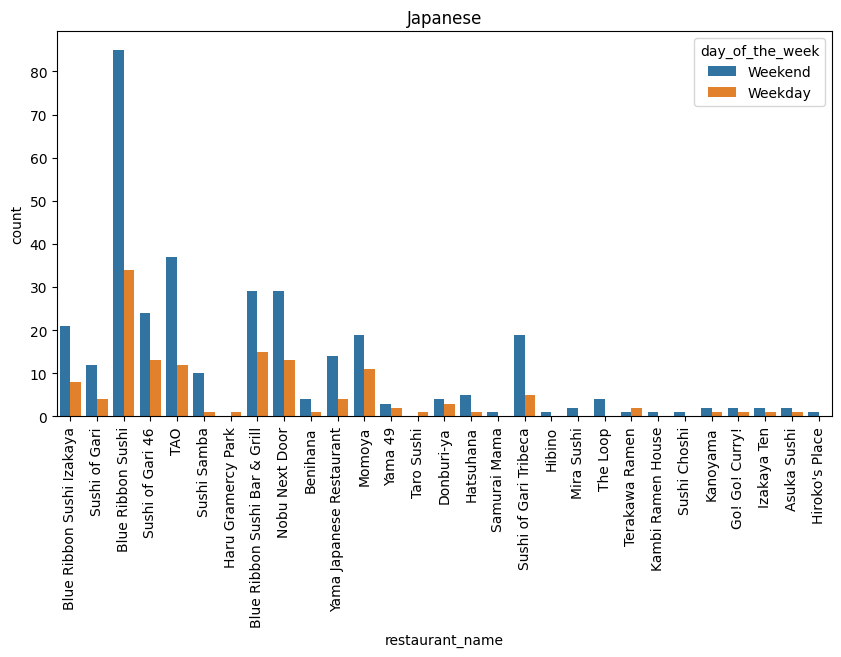

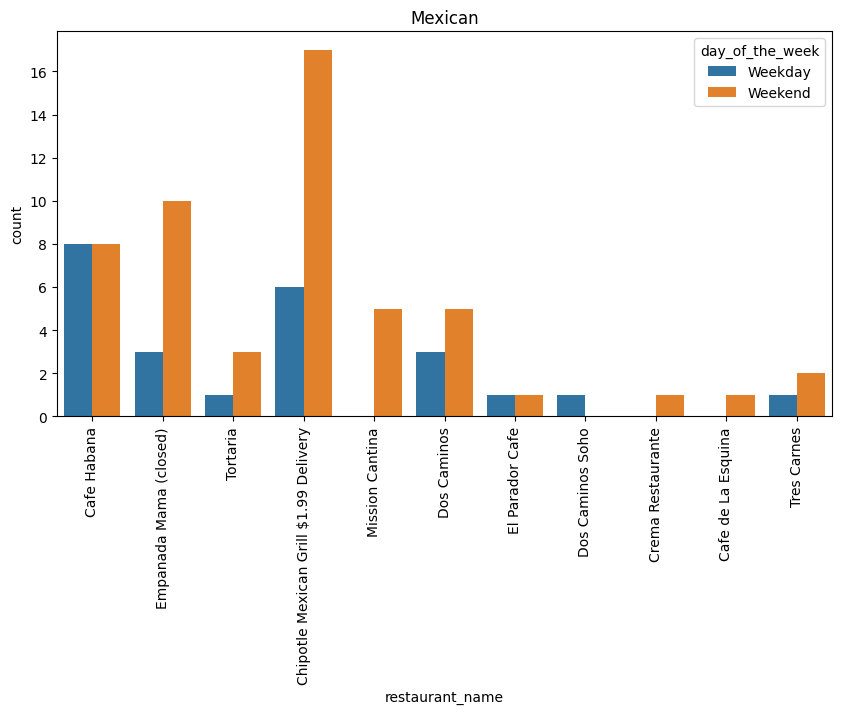

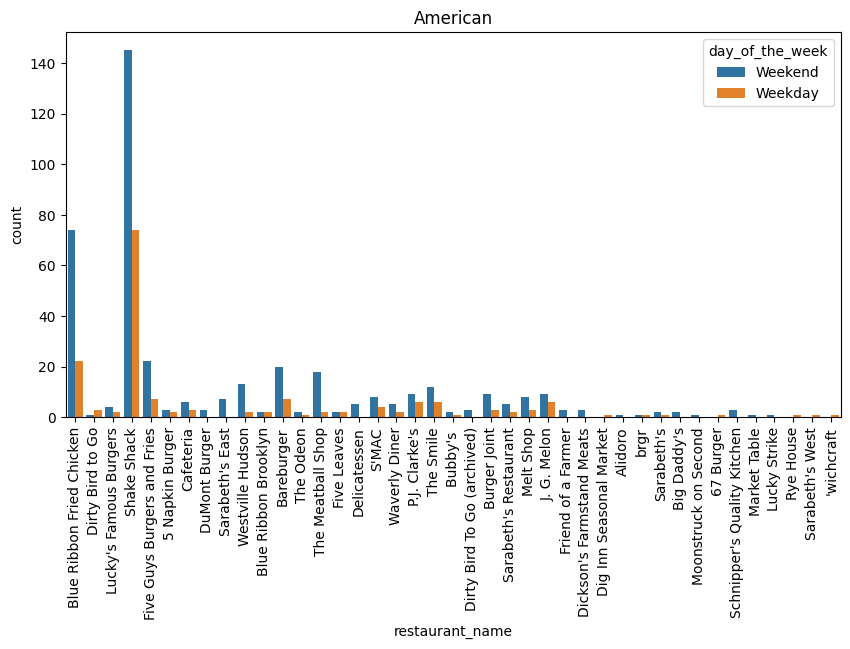

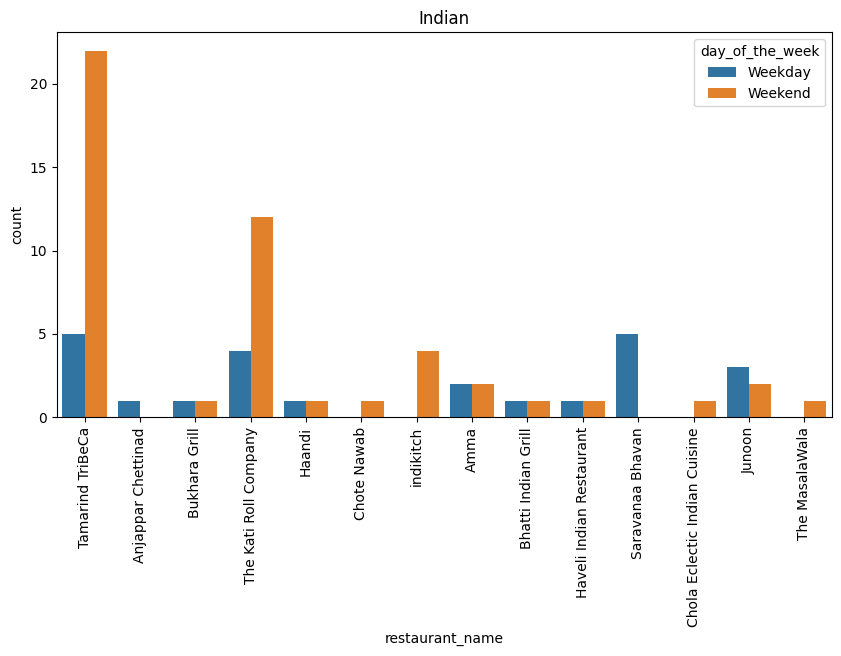

...

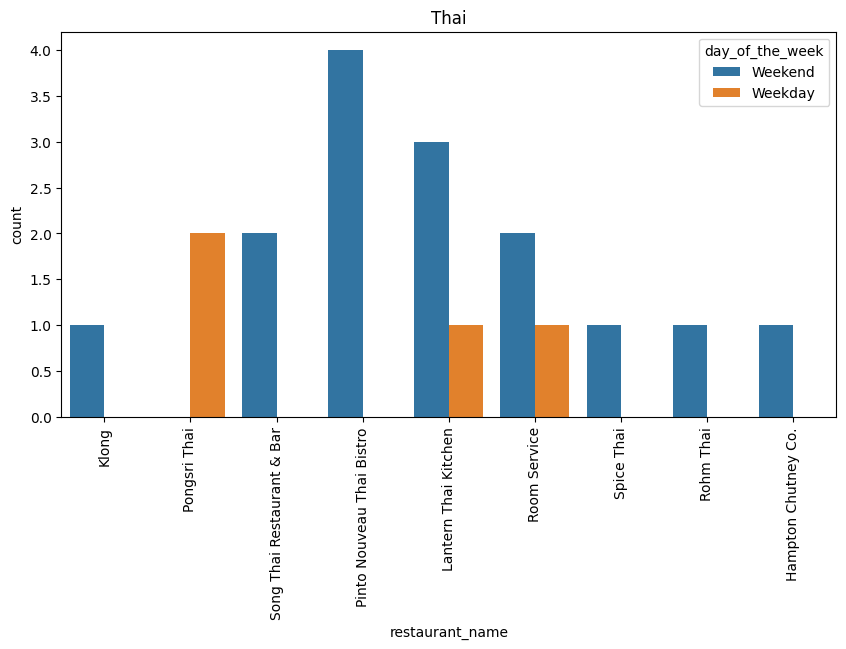

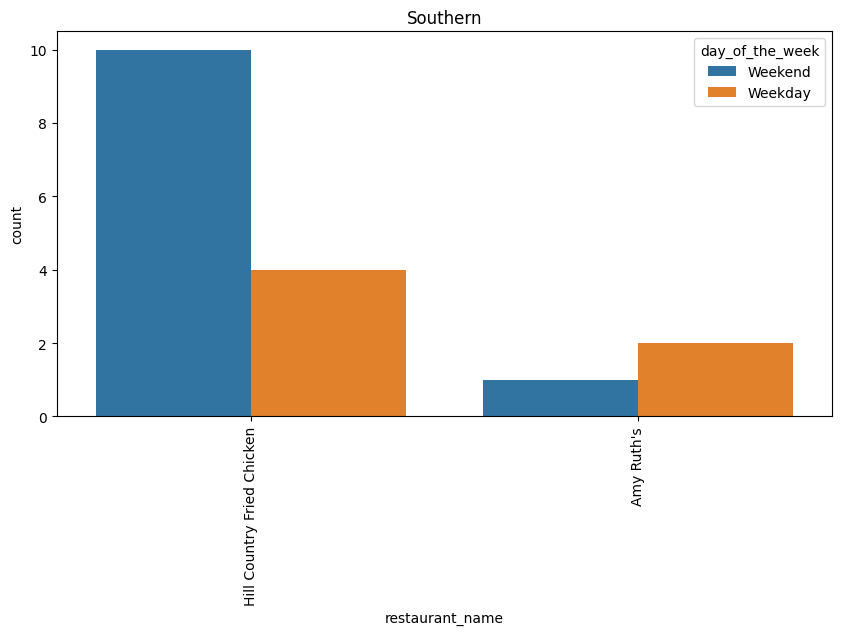

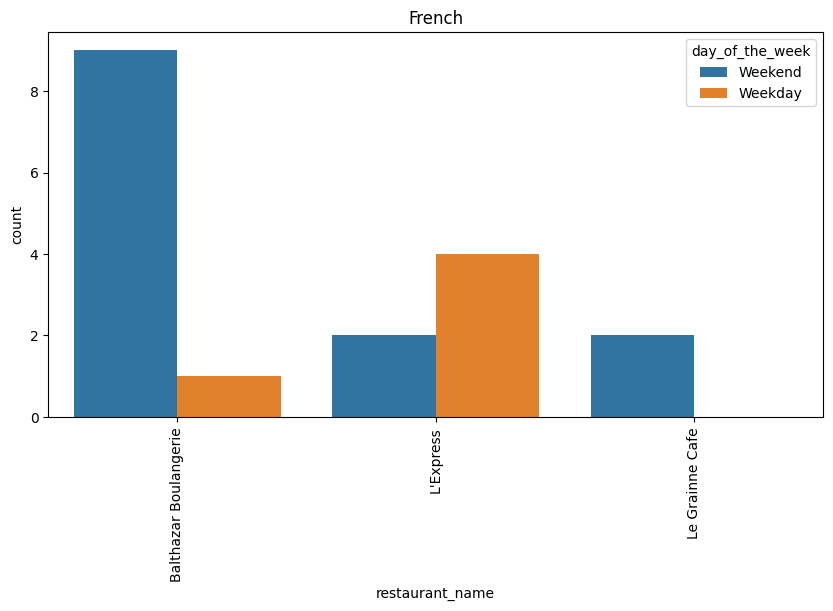

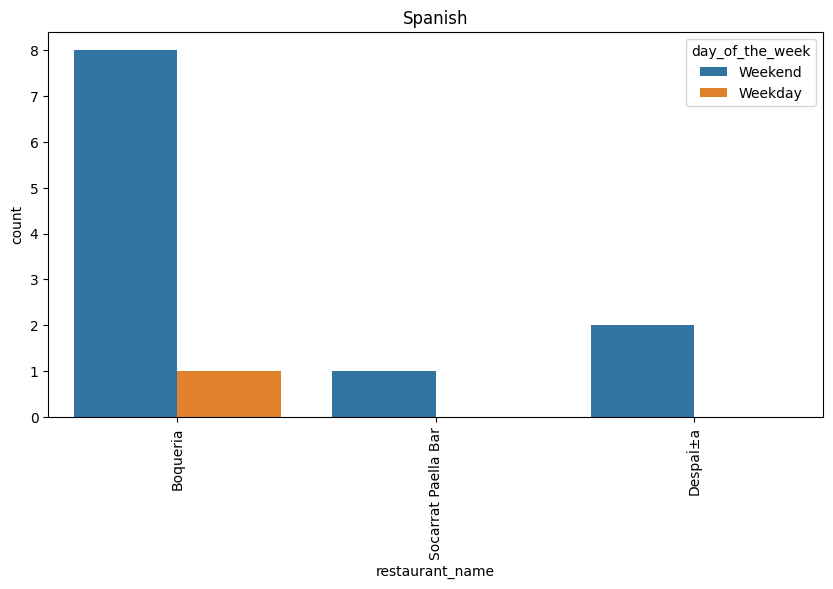

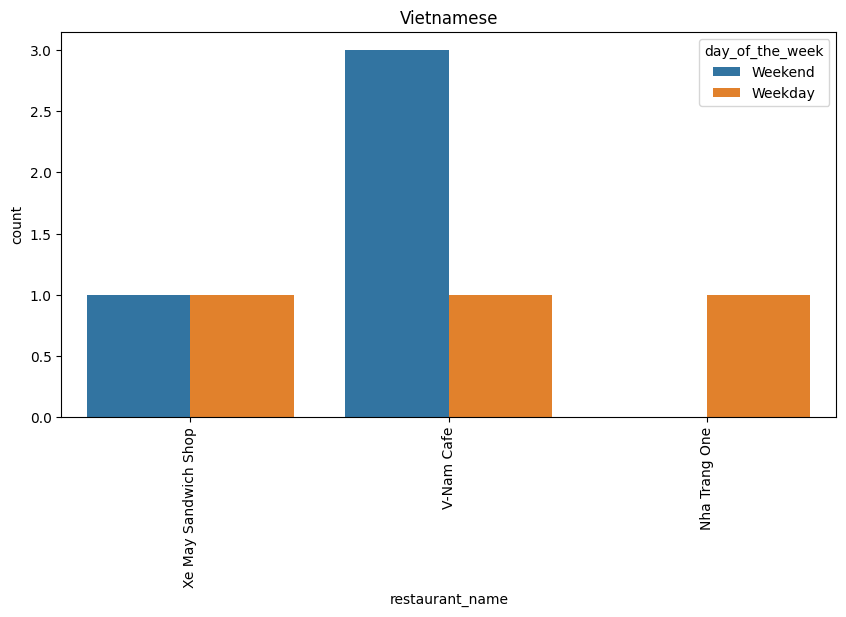

In [171]:
for cuisine in foodhub_df['cuisine_type'].unique():
    plt.figure(figsize=(10,5))
    sns.countplot(data=foodhub_df[foodhub_df['cuisine_type']==cuisine],x='restaurant_name',hue='day_of_the_week')
    plt.title(cuisine)
    plt.xticks(rotation=90)
    plt.show()

#### Observations on Restaurant name

- Shake Shack is the most popular restaurant and has the most orders followed by The Meatball Shop, Blue Ribbon Sushi and Blue Ribbon Fried Chicken.
- Some of the least popular restaurants are Sushi Choshi, Dos Caminos Soho, La Follia, Phillippe Chow and 'wichcraft.
- American cuisine type has the most number of restaurants followed by Italian and Japanese cuisine.
- Southern cuisine type has the least number of restaurants followed by French, Spanish and Vietnamese.
- The orders on weekends are more when compared to weekdays across most of restaurants and all cuisine types.

**Lets get exact stats**

In [172]:
# Get the restaurants with number of orders. Get the top 5 and the bottom 5 view
foodhub_df['restaurant_name'].value_counts()


,count
restaurant_name,
Shake Shack,219
The Meatball Shop,132
Blue Ribbon Sushi,119
Blue Ribbon Fried Chicken,96
Parm,68
...,...
Sushi Choshi,1
Dos Caminos Soho,1
La Follia,1


#### Observations :
- Shake Shack got 219 orders followed The Meatball Shop - 132 orders and Blue Ribbon Sushi - 119 orders

In [173]:
#Get the count of restaurant name by cuisine type
#nunique counts the number of unique restaurants in each cuisine type
restaurant_counts_by_cuisine = foodhub_df.groupby('cuisine_type')['restaurant_name'].nunique()
print(restaurant_counts_by_cuisine)

cuisine_type
American          41
Chinese           16
French             3
Indian            14
Italian           31
Japanese          29
Korean             5
Mediterranean      5
Mexican           11
Middle Eastern     7
Southern           2
Spanish            3
Thai               9
Vietnamese         3
Name: restaurant_name, dtype: int64


#### Observations:
- Highest restaurant counts in Cuisine type - American cuisine type has 41 restaurants, followed by Italian - 31 restaurants and Japanese - 29 restaurants
- Least restaurant counts in Cuisine type - Southern cuisine type has 2 restaurants followed by French, Spanish and Vietnamese which have 3 restaurants

#### Observation on cuisine type

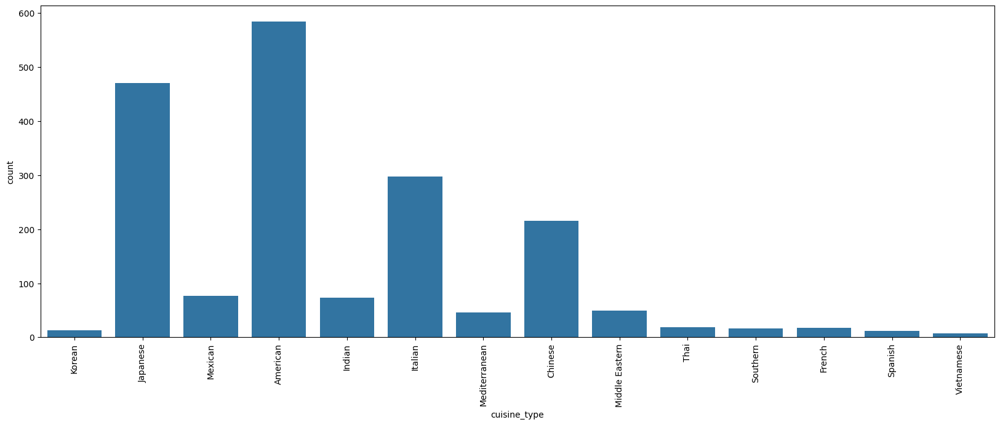

In [174]:
plt.figure(figsize=(20,7))
sns.countplot(data=foodhub_df, x='cuisine_type')
plt.xticks(rotation=90)
plt.show()

- American cuisine has the highest number of orders followed by Japanese,Italian and Chinese.
- Thai, southern, French,Spanish and Vietnamese cuisine has less number of orders when compared to other cuisines


#### Observations on cost of the order

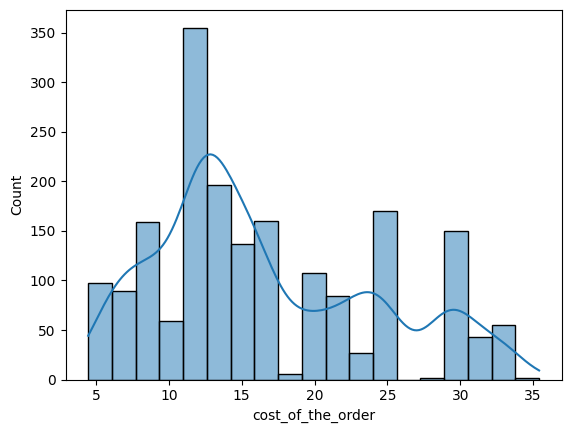

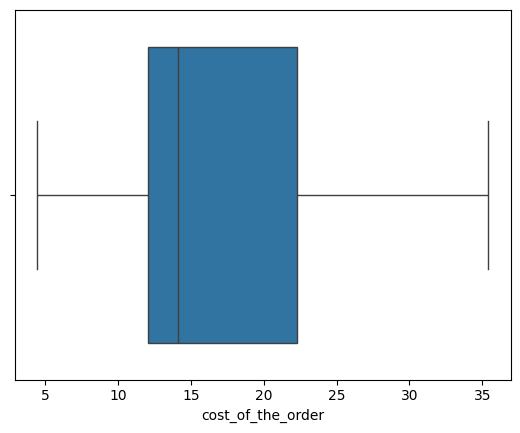

In [175]:
sns.histplot(data=foodhub_df, x='cost_of_the_order',kde=True)
plt.show()

sns.boxplot(data=foodhub_df,x='cost_of_the_order')
plt.show()

- Cost of the order is positively skewed(right skewed)
- If we observe that there are no outliers

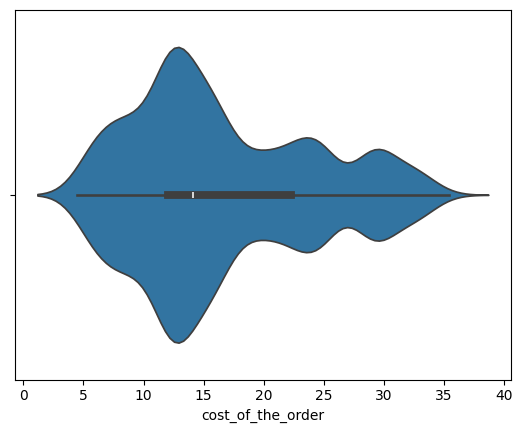

In [176]:
#get the distribution of cost of the order
sns.violinplot(data=foodhub_df,x='cost_of_the_order')
plt.show()

- The white spot represents the Median cost and is around 14 dollars.
- The wider area of the violin plot represents the higher probability of the cost and the thinner area represents the lower probability of the cost.

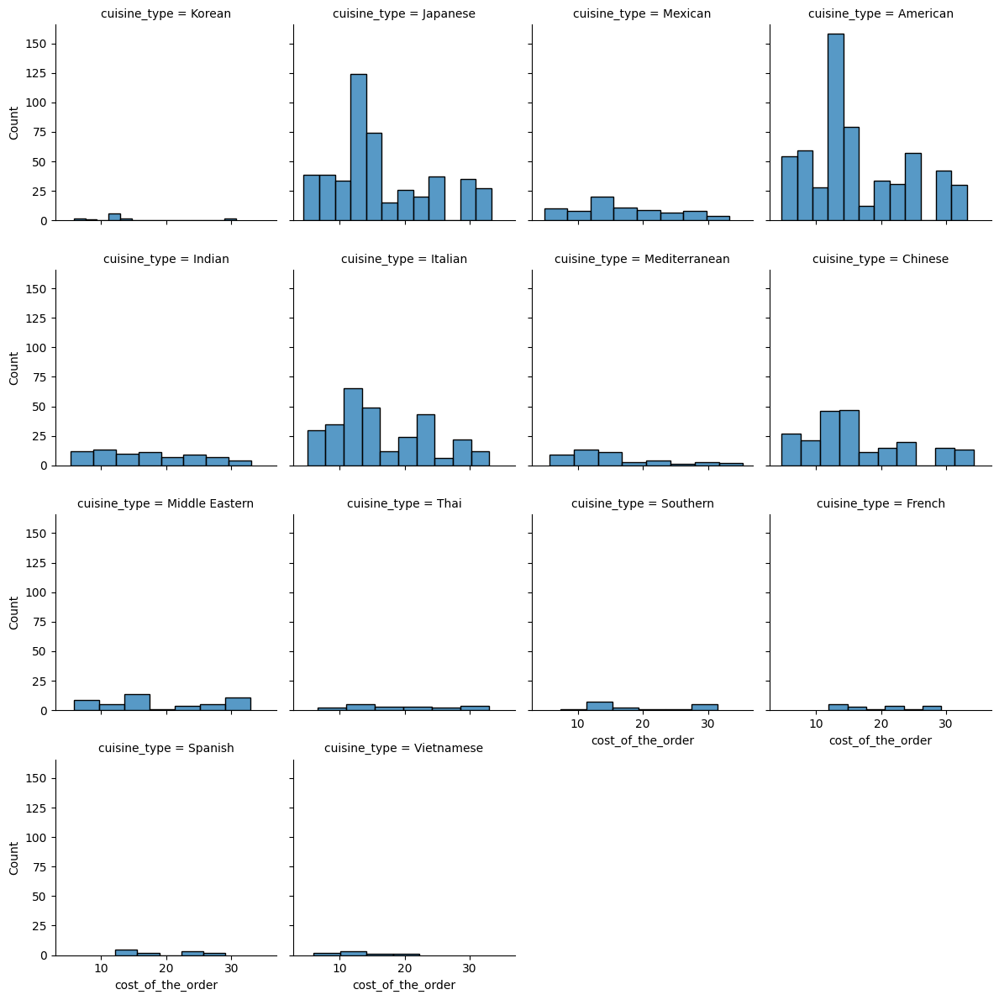

In [177]:
#distribution of order costs across cuisine types
g = sns.FacetGrid(foodhub_df, col="cuisine_type",col_wrap=4)
g.map(sns.histplot, "cost_of_the_order")
plt.show()

- American cuisine type has the highest distribution of costs followed by Japanese cuisine.
- The least distribution of cost is for Korean followed by vietnamese and spanish cuisine.

#### Observation on day of the week

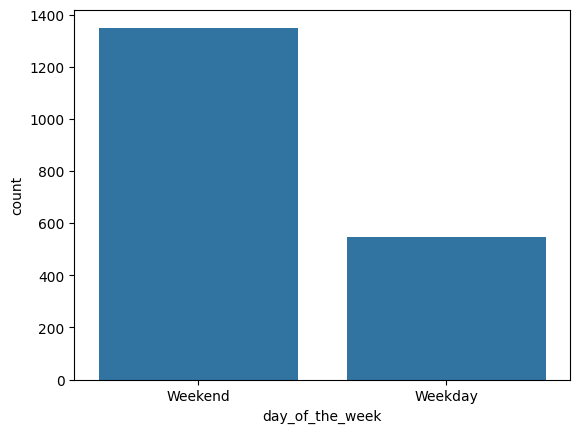

In [178]:
sns.countplot(data=foodhub_df, x='day_of_the_week')
plt.show()

- Most of the orders are placed on the weekends.Around 70% of the orders are placed on weekends and 30% of the orders are placed in the weekdays

**Lets get the exact stats**

In [179]:
#get the percentage of orders on weekdays and weekends
#normalize=True will give the percentage value
foodhub_df['day_of_the_week'].value_counts(normalize=True)*100

,proportion
day_of_the_week,
Weekend,71.18019
Weekday,28.81981


#### Observations on rating

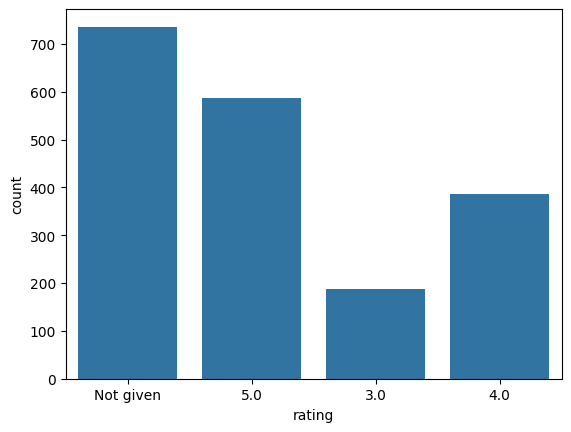

In [180]:
# create a temporary dataset to show Missing category as well.
# Seaborn countplot doesnt include NaN category. So convert NaN to 'Not given' to include the Not given category
temp_df = foodhub_df.copy()
temp_df['rating'] = temp_df['rating'].fillna('Not given')
sns.countplot(data=temp_df, x='rating')
plt.show()

- Around 39% of the orders dont have customer ratings.
- Around 31% of the orders have rating of 5

**Lets get the exact stats**

In [181]:
#get the exact stats of customer ratings
temp_df['rating'].value_counts(normalize=True)*100

,proportion
rating,
Not given,38.777661
5.0,30.979979
4.0,20.337197
3.0,9.905163


#### Observation on food preparation time

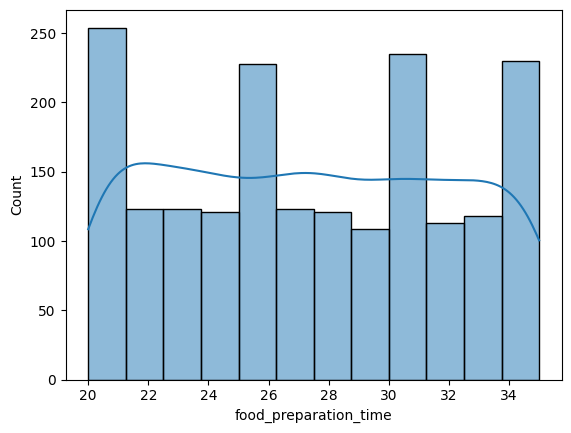

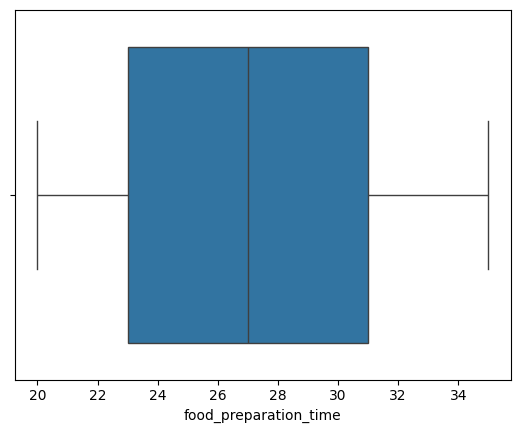

In [182]:
sns.histplot(data=foodhub_df, x='food_preparation_time',kde=True)
plt.show()

sns.boxplot(data=foodhub_df,x='food_preparation_time')
plt.show()

- We observe that its a symmetrical distribution.
- Food preparation time is neither positively or negatively skewed.
- We observe that there are multiple modes from the histogram.
- There are no outliers in food preparation time.
- Median food preparation time is around 27 minutes

**Lets get the stats**

In [183]:
foodhub_df['food_preparation_time'].mode()

,food_preparation_time
0,21


In [184]:
foodhub_df['food_preparation_time'].median()

27.0

In [185]:
foodhub_df['food_preparation_time'].mean()

27.371970495258168

In [186]:
foodhub_df['food_preparation_time'].skew()

0.03646881825816354

#### Observations:
- Mean, Median, Mode are close to each other
- Skewness value close to 0 which indicates a symmetrical distribution

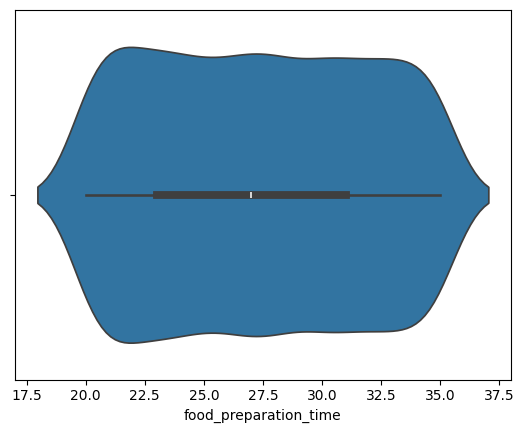

In [187]:
sns.violinplot(data=foodhub_df,x='food_preparation_time')
plt.show()

#### Observation on delivery time

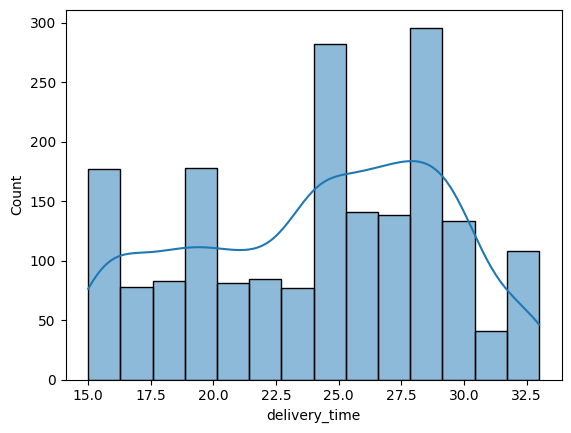

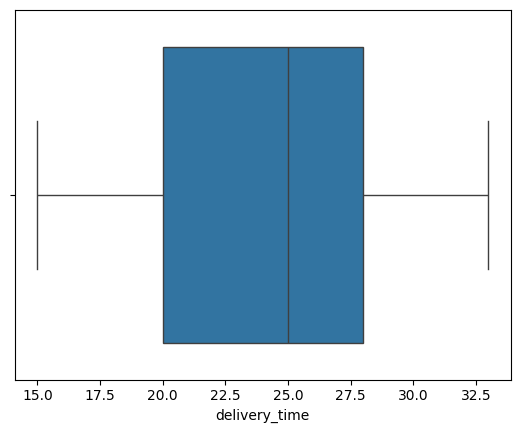

In [188]:
sns.histplot(data=foodhub_df, x='delivery_time',kde=True)
plt.show()

sns.boxplot(data=foodhub_df,x='delivery_time')
plt.show()

- There are multiple modes in delivery time.
- Delivery time is left skewed or negatively skewed.
- There are no outliers in delivery time.

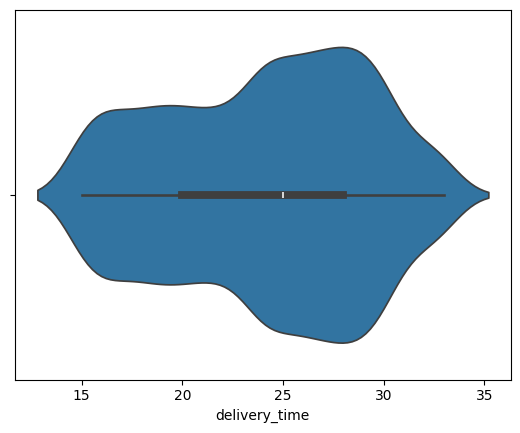

In [189]:
sns.violinplot(data=foodhub_df,x='delivery_time')
plt.show()

### **Question 7**: Which are the top 5 restaurants in terms of the number of orders received? [1 mark]

In [190]:
#value_counts provides the count and sorts it by descending order
foodhub_df['restaurant_name'].value_counts()

,count
restaurant_name,
Shake Shack,219
The Meatball Shop,132
Blue Ribbon Sushi,119
Blue Ribbon Fried Chicken,96
Parm,68
...,...
Sushi Choshi,1
Dos Caminos Soho,1
La Follia,1


#### Observations:
- Top 5 restaurants in terms of orders received are Shake Shack, The Meatball Shop, Blue Ribbon Sushi, Blue Ribbon Fried Chicken and Parm.

### **Question 8**: Which is the most popular cuisine on weekends? [1 mark]

In [191]:
# categorize by day of the week. Value counts provides the count and descending order by default.
foodhub_df.groupby(['day_of_the_week'])['cuisine_type'].value_counts()

day_of_the_week  cuisine_type  
Weekday          American          169
                 Japanese          135
                 Italian            91
                 Chinese            52
                 Indian             24
                 Mexican            24
                 Middle Eastern     17
                 Mediterranean      14
                 Southern            6
                 French              5
                 Thai                4
                 Vietnamese          3
                 Korean              2
                 Spanish             1
Weekend          American          415
                 Japanese          335
                 Italian           207
                 Chinese           163
                 Mexican            53
                 Indian             49
                 Mediterranean      32
                 Middle Eastern     32
                 Thai               15
                 French             13
                 Korean             11
                 Southern           11
                 Spanish            11
                 Vietnamese          4
Name: count, dtype: int64

#### Observations:


- American Cuisine is the most popular cuisine in the Weekend.

### **Question 9**: What percentage of the orders cost more than 20 dollars? [2 marks]

In [192]:
#get the count of the orders whose cost is greater than 20 and divide by the total number of orders and multiply by 100 to get the percentage.
(foodhub_df['cost_of_the_order'] > 20).sum()/foodhub_df.shape[0]*100

29.24130663856691

#### Observations:


- About 29% of the orders are greater than 20 dollars.

### **Question 10**: What is the mean order delivery time? [1 mark]

In [193]:
#use mean function to find the mean of delivery time
foodhub_df['delivery_time'].mean()

24.161749209694417

#### Observations:


- Mean order delivery time is 24.16 minutes.

### **Question 11:** The company has decided to give 20% discount vouchers to the top 3 most frequent customers. Find the IDs of these customers and the number of orders they placed. [1 mark]

In [194]:
#customer_id is the unique id for the customer and value counts returns the number of times the customer has ordered
# Head(3) provides the top 3 ids.
foodhub_df['customer_id'].value_counts().head(3)

,count
customer_id,
52832,13
47440,10
83287,9


#### Observations:


- The top customer with customer id - 52832 placed 13 orders followed by  customer with id 47440 placed 10 orders and customer with id 83287 who placed 9 orders respectively. These 3 customers will be given 20% discount vouchers

### Multivariate Analysis


### **Question 12**: Perform a multivariate analysis to explore relationships between the important variables in the dataset. (It is a good idea to explore relations between numerical variables as well as relations between numerical and categorical variables) [10 marks]


**Notes**

Numerical and Categorial variables

 2   restaurant_name        
 3   cuisine_type           
 4   cost_of_the_order      
 5   day_of_the_week        
 6   rating                 
 7   food_preparation_time  
 8   delivery_time  
 9   total_time        

Relationship to be analyzed :

 - calculate total_time and see if there is correlation between total_time and rating
 - total_time and day of the week
 - total_time and cost of the order
 - total_time and cuisine type (hue day of the week)
        
 - cuisine type and cost of the order
 - cuisine type and preparation time
 - cuisine type and rating
 - cusine type and day of the week
 - dispersion of cost of the order in every cuisine type - violin plot

 - cost of the order and rating
 - cost of the order and food preparation time
 - cost of the order and delivery time - not relevant
 - create bins for the cost of the order


 - day of the week and food preparation time
 - day of the week and delivery time


 - rating and food preparation time
 - rating and delivery time


Check on below ones as well
 - restaurant name and cuisine
 - cost of the order and restaurant name -> check how to get which restaurant is expensive and how many orders are placed - i think its already done in univariate analysis
 - restaurant name and rating - is there an association ?
 - restaurant name and food preparation time
 - restaurant name and delivery time
 - restaurant name and total time

**Correlation by Heatmap**

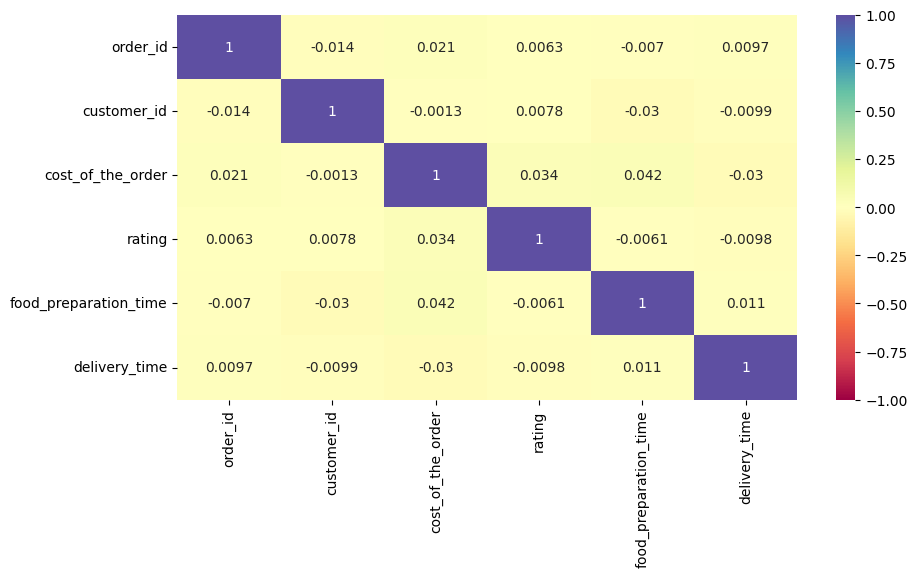

In [195]:
plt.figure(figsize=(10,5))
numerical_df = foodhub_df.select_dtypes(include=np.number)  # Select only numerical columns
sns.heatmap(numerical_df.corr(),annot=True, cmap='Spectral',vmin=-1, vmax=1)
plt.show()

#### Observations:
- Most of the values are very close to 0(very weak positive and very weak negative values) and  indicates there is no correlation between the variables.

**Lets check the correlation between the numeric variables**

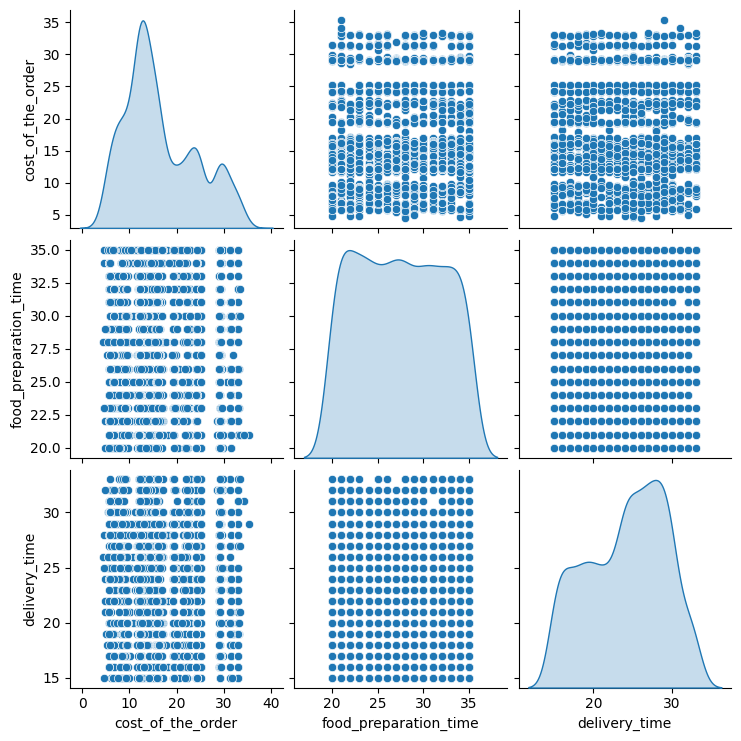

In [196]:
# The subplots are scatterplots that helps explore the relationship between the listed numverical variables.
num_var = ['cost_of_the_order','food_preparation_time','delivery_time']
sns.pairplot(foodhub_df[num_var],diag_kind ='kde')
plt.show()

#### Observations:
- We see the same results as we see in heatmap.
- There is no correlation between cost_of_the_order, food_preparation_time and delivery_time
- We see the food preparation time doesnt influence the cost of the order. We see that there are orders which are in the range of 5 to 10 dollars and have high preparation time (around 35 minutes)
- We see that there are orders which are in the range of 5 to 10 dollars and have a high delivery time(>30 minutes)


**Lets calculate the total time it takes which includes food preparation time and delivery time.Lets check the relationship between total time and cost of the order text**

In [197]:
foodhub_df['total_time'] = foodhub_df['food_preparation_time'] + foodhub_df['delivery_time']
foodhub_df.head()

,order_id,customer_id,restaurant_name,cuisine_type,cost_of_the_order,day_of_the_week,rating,food_preparation_time,delivery_time,total_time
0,1477147,337525,Hangawi,Korean,30.75,Weekend,NaN,25,20,45
1,1477685,358141,Blue Ribbon Sushi Izakaya,Japanese,12.08,Weekend,NaN,25,23,48
2,1477070,66393,Cafe Habana,Mexican,12.23,Weekday,5.0,23,28,51
3,1477334,106968,Blue Ribbon Fried Chicken,American,29.20,Weekend,3.0,25,15,40
4,1478249,76942,Dirty Bird to Go,American,11.59,Weekday,4.0,25,24,49


#### Observations:
- total_time column is successfully added to foodhub_df dataframe.

In [198]:
foodhub_df['total_time'].describe()

,total_time
count,1898.000000
mean,51.533720
std,6.833603
min,35.000000
25%,47.000000
50%,52.000000
75%,56.000000
max,68.000000


In [199]:
#check total_time data type
foodhub_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1898 entries, 0 to 1897
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   order_id               1898 non-null   int64  
 1   customer_id            1898 non-null   int64  
 2   restaurant_name        1898 non-null   object 
 3   cuisine_type           1898 non-null   object 
 4   cost_of_the_order      1898 non-null   float64
 5   day_of_the_week        1898 non-null   object 
 6   rating                 1162 non-null   float64
 7   food_preparation_time  1898 non-null   int64  
 8   delivery_time          1898 non-null   int64  
 9   total_time             1898 non-null   int64  
dtypes: float64(2), int64(5), object(3)
memory usage: 148.4+ KB


#### Observations:
- Average total time is 51.53 minutes.
- Median total time is 52 minutes.
- Minimum total time is 35 minutes.
- Maximum total time is 68 minutes.

In [200]:
foodhub_df[['total_time','cost_of_the_order']].corr()


,total_time,cost_of_the_order
total_time,1.000000,0.006358
cost_of_the_order,0.006358,1.000000


#### Observations:
- There is no correlation between total time and cost of the order.

**Check if there is any significant effect of the categorical variables on the numeric variables**

#### Cost of the order across cuisine type

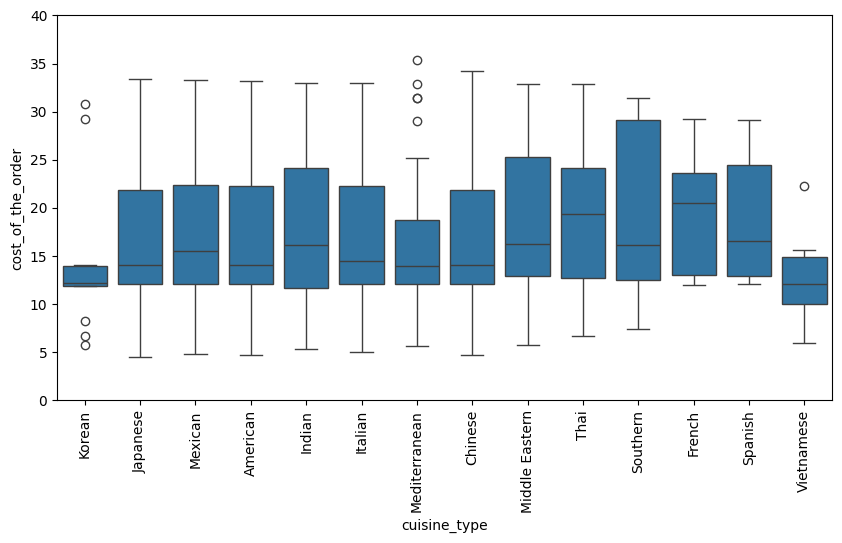

In [201]:
    plt.figure(figsize=(10,5))
    plt.ylim(0,40)
    sns.boxplot(data=foodhub_df,x='cuisine_type',y='cost_of_the_order')
    plt.xticks(rotation=90)
    plt.show()


#### Observations:
- There are some outliers in Korean, Mediterranean and Vietnamese cost of the order.
- Mediterranean cuisine type has the most expensive cost of the order which is around 35 dollars followed by Chinese.
- Japanese cuisine has the least cost of the order which is around 5 dollars(less than 5 dollars).
- French has the highest median order cost(around 20 dollars)  followed by Thai.
- Korean and Vietnamese has the least median order cost.
- Median cost of the order varies across different cuisine types.



#### Cost of the order across restaurants by cuisine type

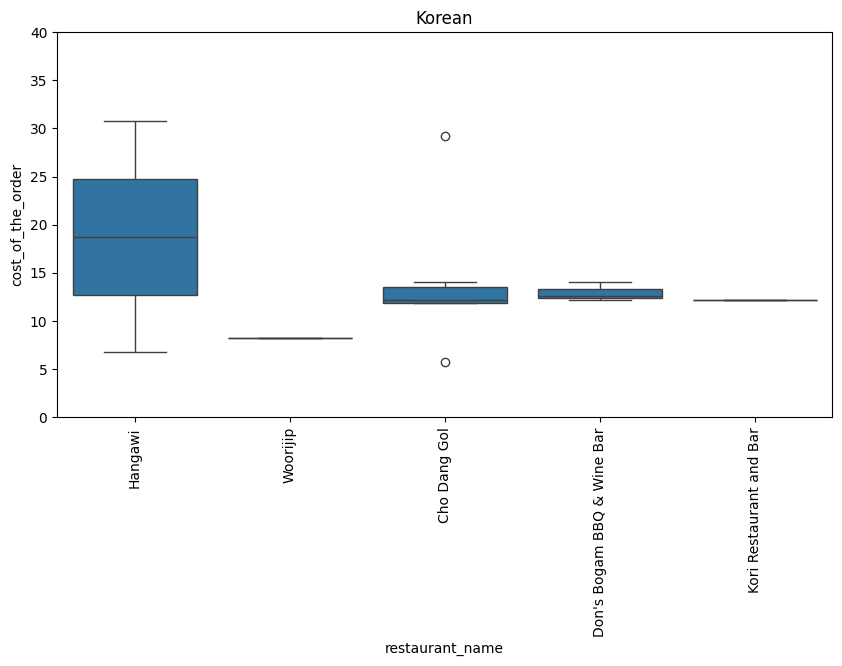

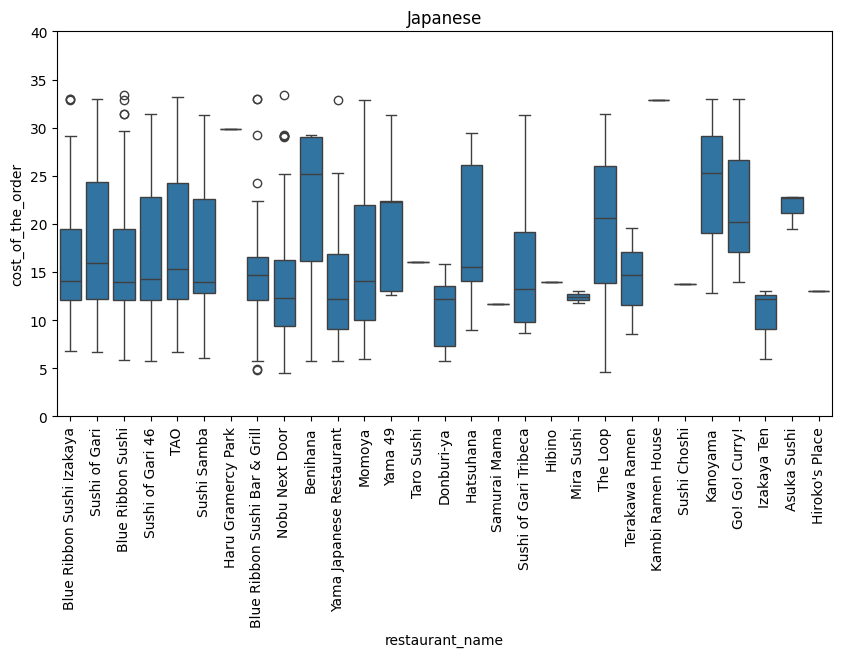

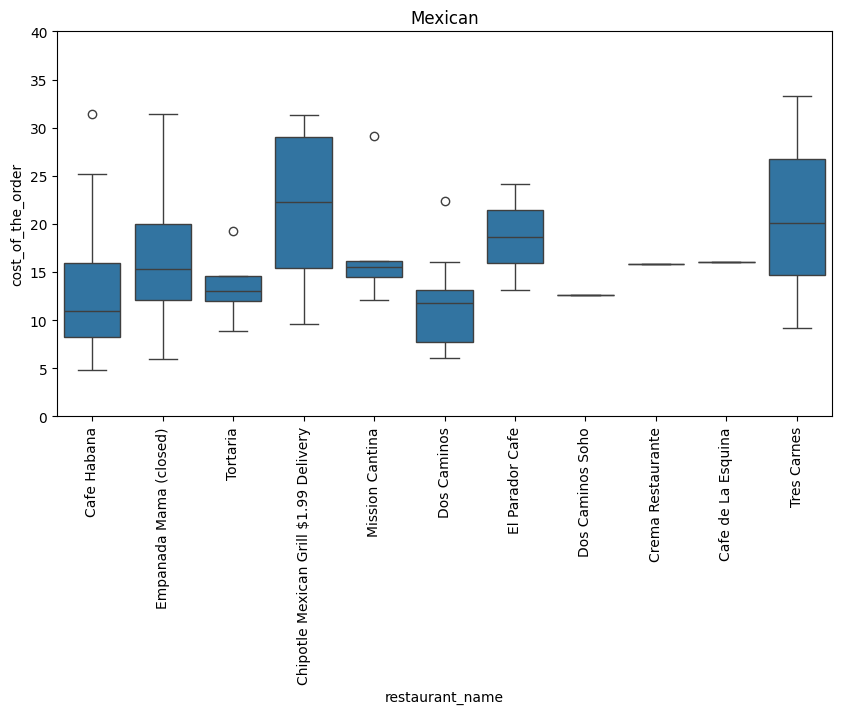

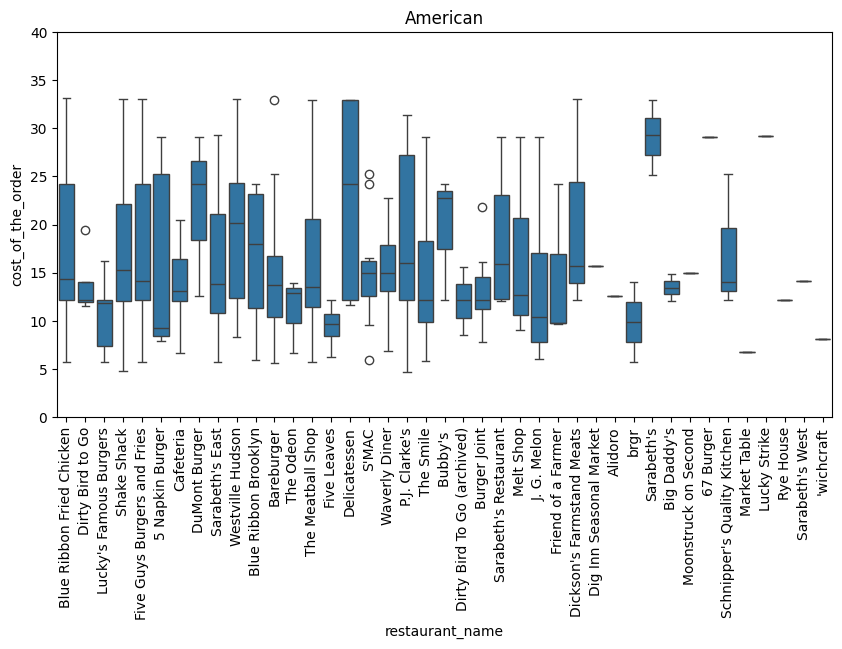

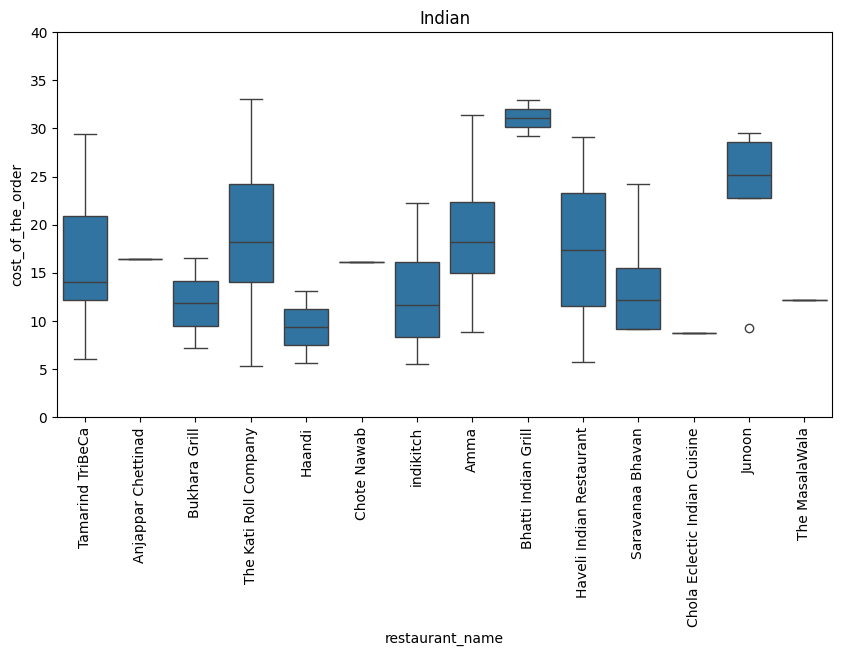

...

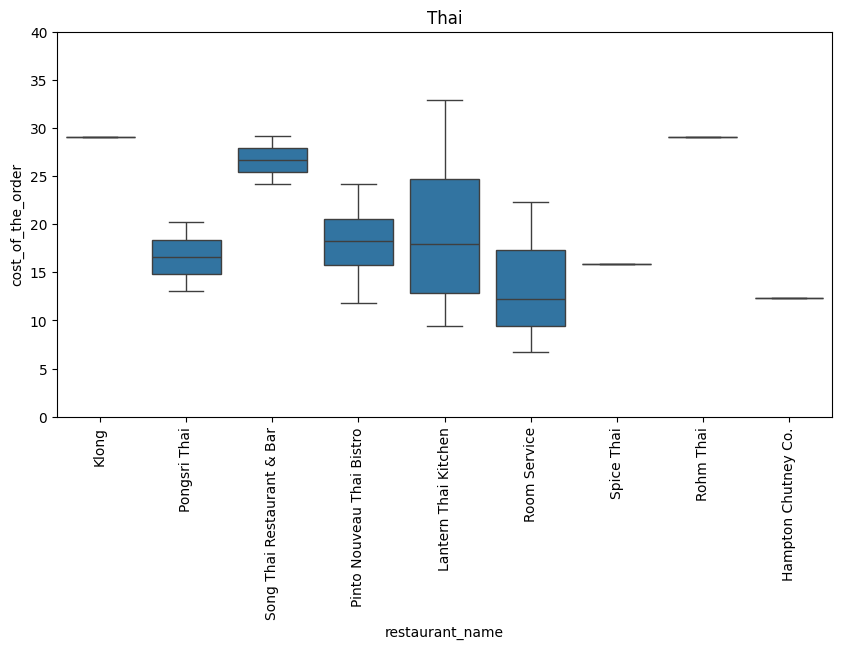

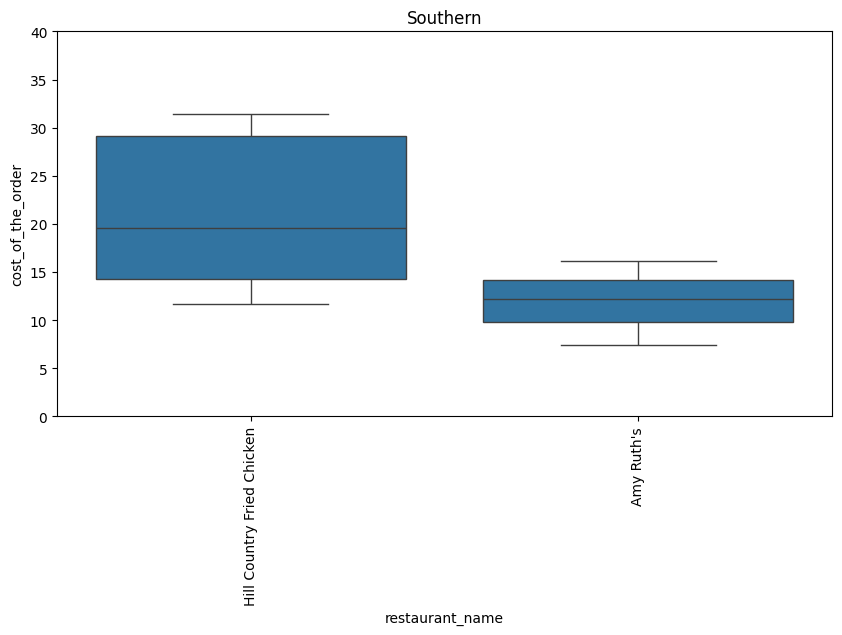

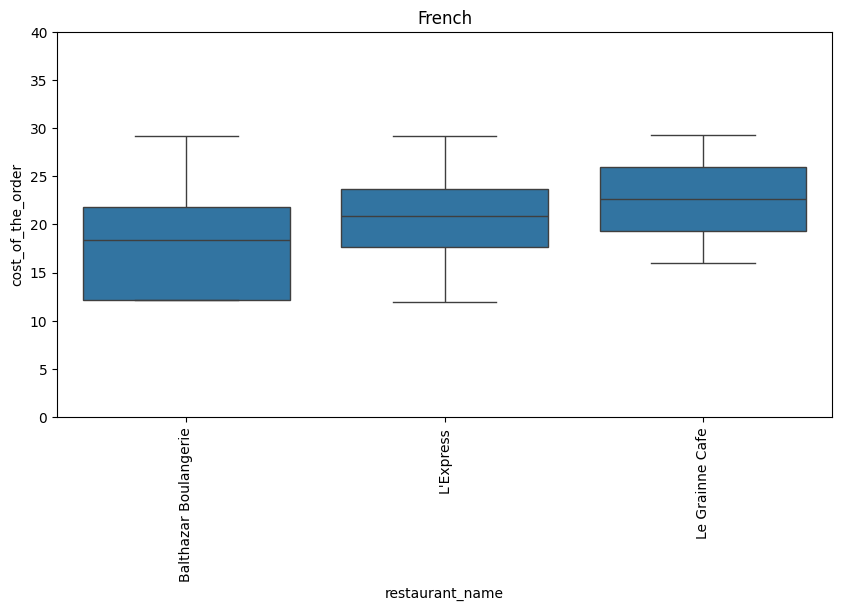

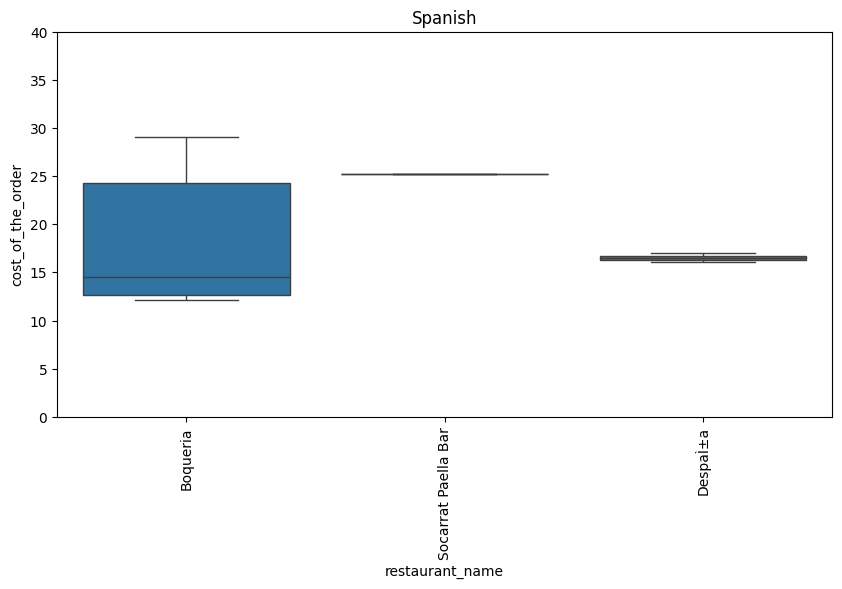

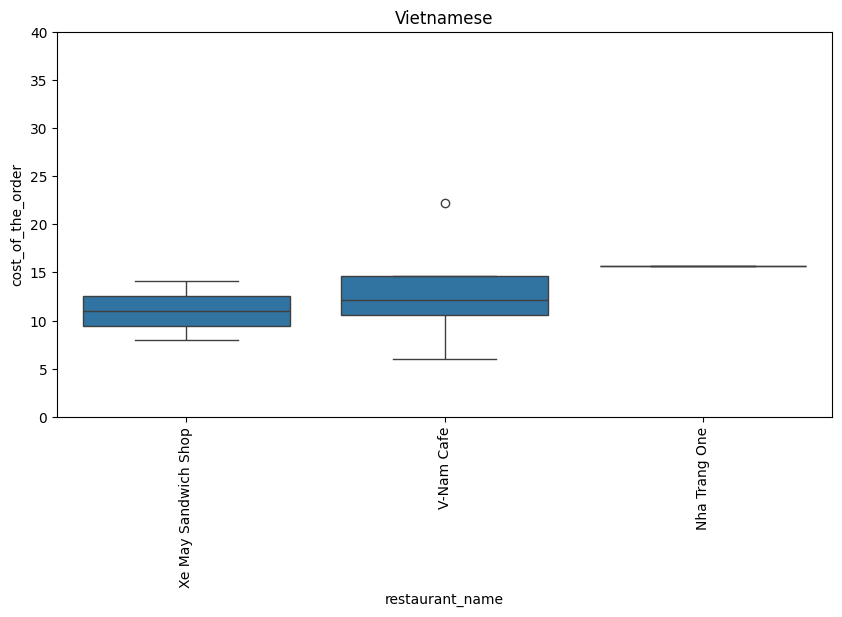

In [202]:
for cuisine in foodhub_df['cuisine_type'].unique():
    plt.figure(figsize=(10,5))
    plt.title(cuisine)
    plt.ylim(0,40)
    sns.boxplot(data=foodhub_df[foodhub_df['cuisine_type']==cuisine],x='restaurant_name',y='cost_of_the_order')
    plt.xticks(rotation=90)
    plt.show()

#### Observations:
Korean :
- Hangawi restaurant boxplot suggest greater variability in the order cost when compared to other restaurants in Korean cuisine
- Hangawi has the max order cost of around 31 dollars.
- Cho Dang Gol restaurant has a outlier order cost which is around 6 dollars which is the least order cost
- For restaurants Woorijip and Kori Restaurant and Bar , there is a line which indicates that the cost of the orders fall within a very narrow range or around a single value

Japanese :
- Nobu Next Door , The loop and Blue Ribbon Sushi Bar & Grill have the least order cost which is around 5 dollars
- Highest order cost is around 34 dollars offered by multiple restaurants
- There are outlier costs in some of the restaurants like Blue Ribbon Sushi ,izakaya, Blue Ribbon Sushi, Blue Ribbon Sushi Bar and Grill, Nobu Next door and Yama Japanese Restaurant
- Nobu Next Door has the widest range of order cost.

Mexican :
- Chipotle has greater variability in the order cost when compared to other restaurants  in Mexican cuisine type
- There are some outlier order cost in restaurants like Cafe Habana, Tortaria, Mission Cantina and Dos Caminos
- Cafe Habana has the least order cost of around 5 dollars
- Tres Carnes has the max order cost of around 34 dollars
- For restaurants like Dos Caminos Soho, Cream Restaurant, Cafe d La Esquina, there is a line which indicates he cost of the orders fall within a very narrow range or around a single value
    
American :
  -  The max order cost is around 34 dollars in restaurants like Blue Ribbon Fried Chicken, Shake Shack,Five Guys Burgers and Fries, Westville Hudson, The Meatball Shop,Delicatessen, Dickson’s Farmstead Meats and Sarabeth’s
- The min order cost is around 5 dollars in restaurants  like P.J. Clarke’s and Shake Shack
- Shake Shack provides the widest range of order cost
- There are outlier costs in restaurants like Dirty Bird to Go, Bareburger,S’MAC and Burger Joint
- For restaurants like Dig Inn Seasonal Market,Alidoro,Moonstruck on Second, 67 Burger, Market Table, Lucky Strike, Rye House, Sarabeth;s West and ‘witchcraft  there is a line which indicates he cost of the orders fall within a very narrow range or around a single value

Indian:
- Outlier order cost in Junoon
- Min order cost is around 5 dollars in couple of restaurants like The Kati Roll company, indikitch, Haveli Indian restaurants
- Max order cost is around 34 dollars in restaurants like The Kati Roll company and Bhati Indian Grill
- The Kati Roll company has widest range of order cost
- For restaurants like The Masalawala, there is a line which indicates he cost of the orders fall within a very narrow range or around a single value

Italian:
- Outliers in restaurants like Vezzo Thin Crust Pizza,Osteria Moroni, Tony’s Di Napoli
- Min order cost is around 5 dollars in restaurants like The Meatball Shop, Tony’s Di Napoli, Cipriani Le Speciality and Zero Otto Love
- Max order cost is around 34 dollars in restaurants like the Meatball Shop, Rubirosa, da Umberto
- The Meatball Shop has widest range of order cost
- For restaurants like Pepe Giallo, Porto, Gaia Italian Cafe and more, there is a line which indicates he cost of the orders fall within a very narrow range or around a single value

Mediterranean:
- There is outlier order cost in Pylos
- Min order cost is around 6 dollars in restaurants like Barbounia, Jack’s Wife Freda, Mamoun’s Falafel and Flea
- Max order cost is around 34 dollars in Jack’s Wife Freda
- Jack’s Wife Freda restaurant offers the widest range of order cost.

Chinese:
- Outlier order cost in Joe’s Shangai and Vanessa’s Dumplings
- Min order cost is around 5 dollars in RedFarm Broadway
- Max order cost is around 34 dollars in Han Dynasty

Middle Eastern:
- No outliers
- Min order cost around 5 dollars in Cafe Maogador and ilili Restaurant
- Max order cost around 34 dollars in ilili Restaurant
- ilili Restaurant offers the widest range of order cost.

Thai:
- No outliers
- Min order cost around 6 dollars in Room Service
- Max order cost around 34 dollars in Lantern Thai Kitchen

Southern:
- No outliers
- Min order cost is around 7 dollars in Amy Ruth’s
- Max order cost is around 31 dollars in Hill Country Fried Chicken

French:
- No outliers
- Min order cost is around 12 dollars in Balthazar Boulangerie and L’Express
- Max order cost is around 30 dollars offered by all 3 restaurants in French cuisine

Spanish:
-  No Outliers
- Boqueria offers the widest range of order cost between 12 dollars and 29 dollars.

Vietnamese:
- Outlier in V-Nam Cafe
- Min order cost is around 5 dollars in V-Name Cafe
- Max order cost is around 14 dollars in V-Nam Cafe and Xe May Sandwich Shop
- V-Name Cafe offers the widest range of order cost.


#### Food preparation time by cuisine type

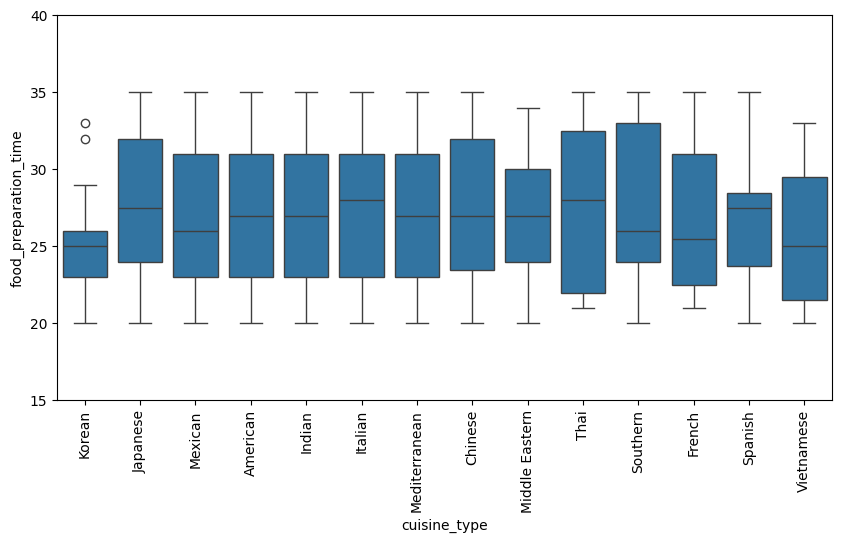

In [203]:
    plt.figure(figsize=(10,5))
    plt.ylim(15,40)
    sns.boxplot(data=foodhub_df,x='cuisine_type',y='food_preparation_time')
    plt.xticks(rotation=90)
    plt.show()


#### Observations:
- There are outliers in Korean cuisine type food preparation time
- Food preparation time is similar across multiple cuisine types if we compare the min(around 20 minutes) and max values(around 35 minutes)

#### Food preparation time across restaurants by cuisine type

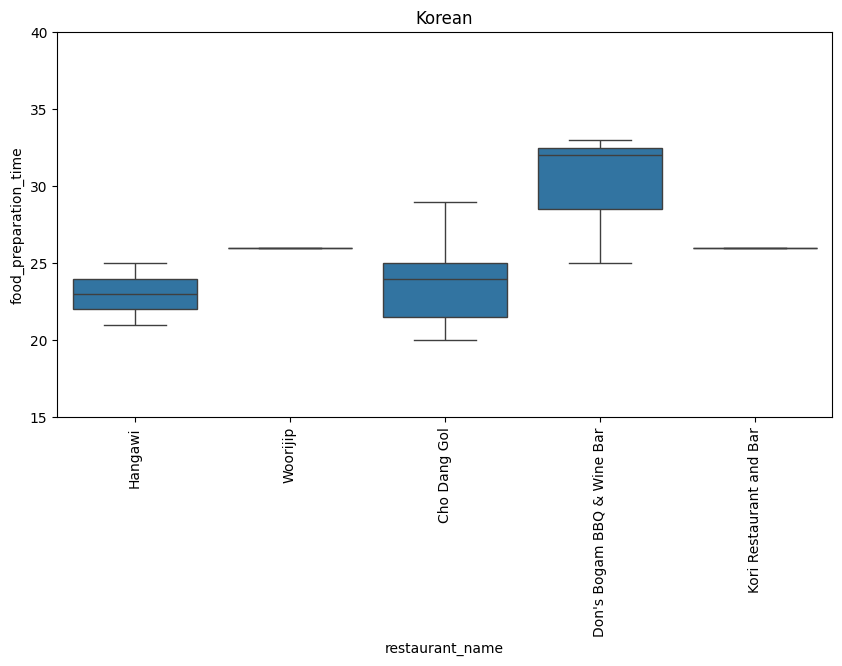

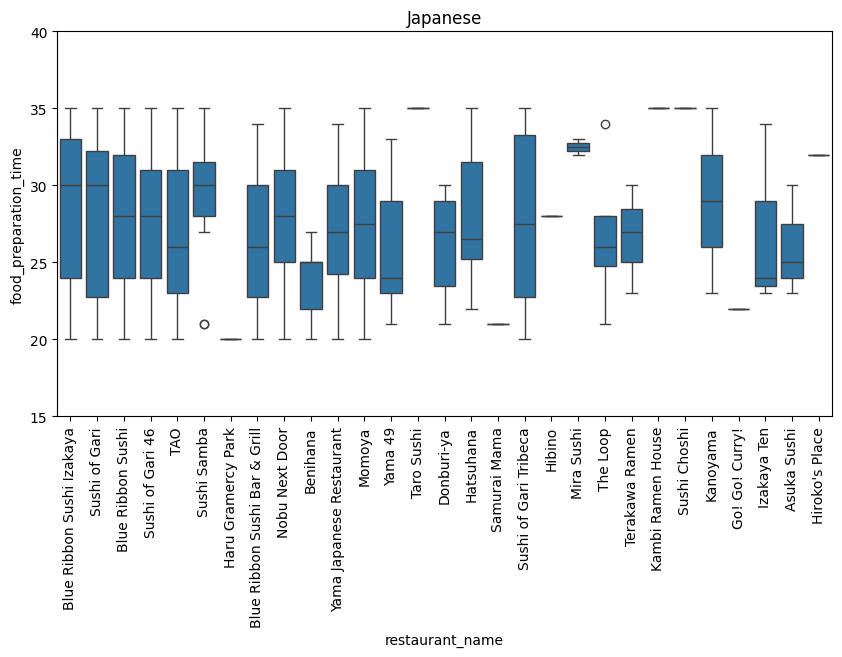

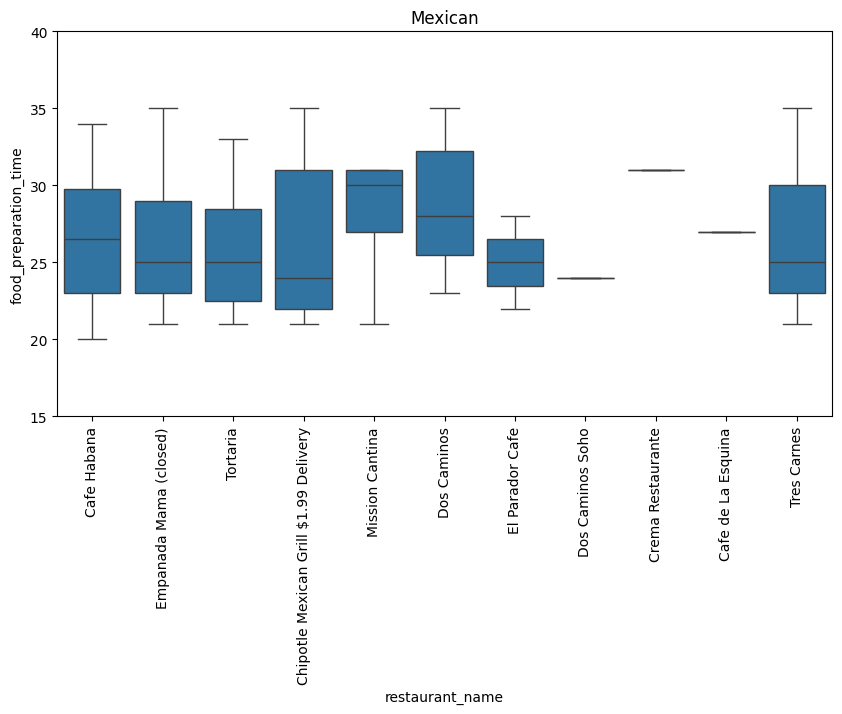

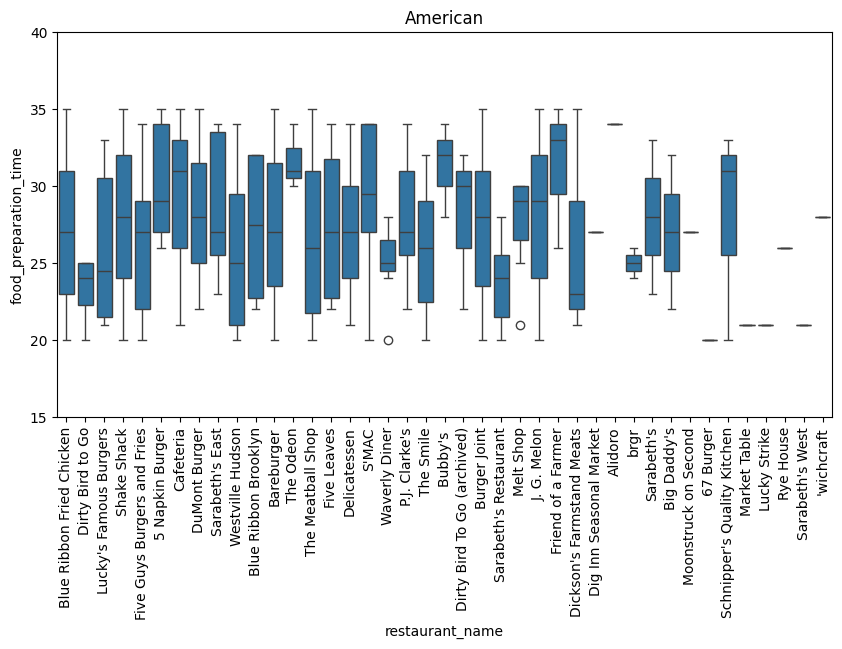

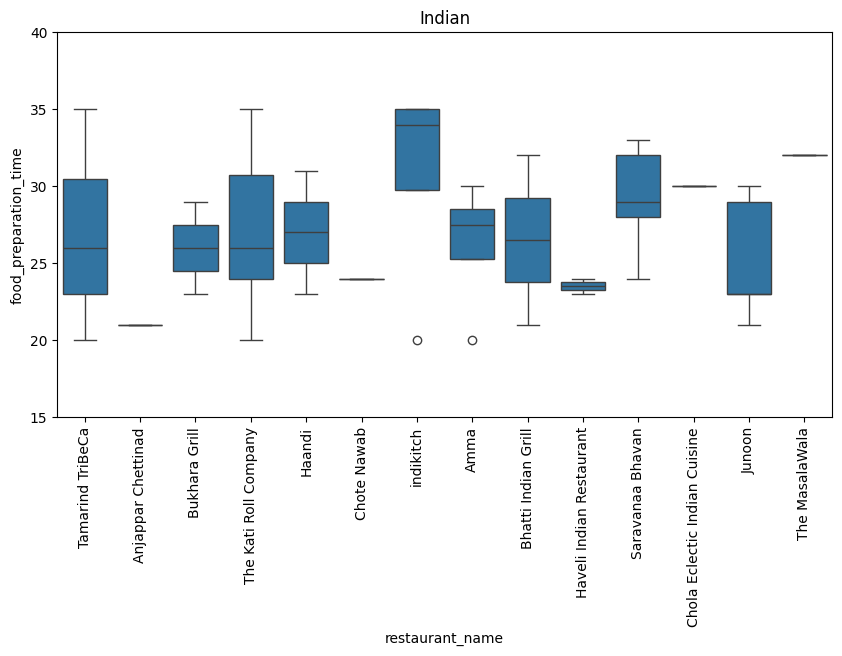

...

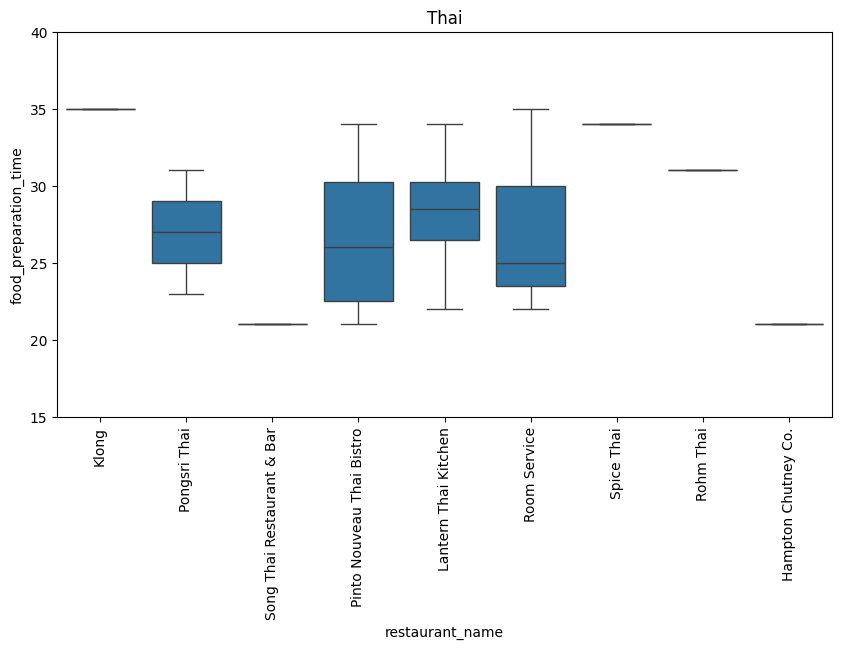

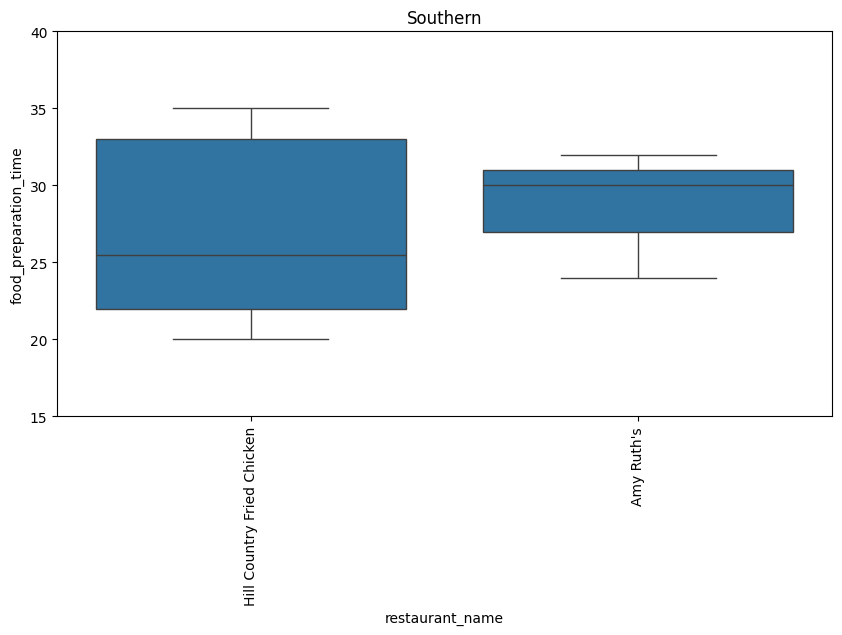

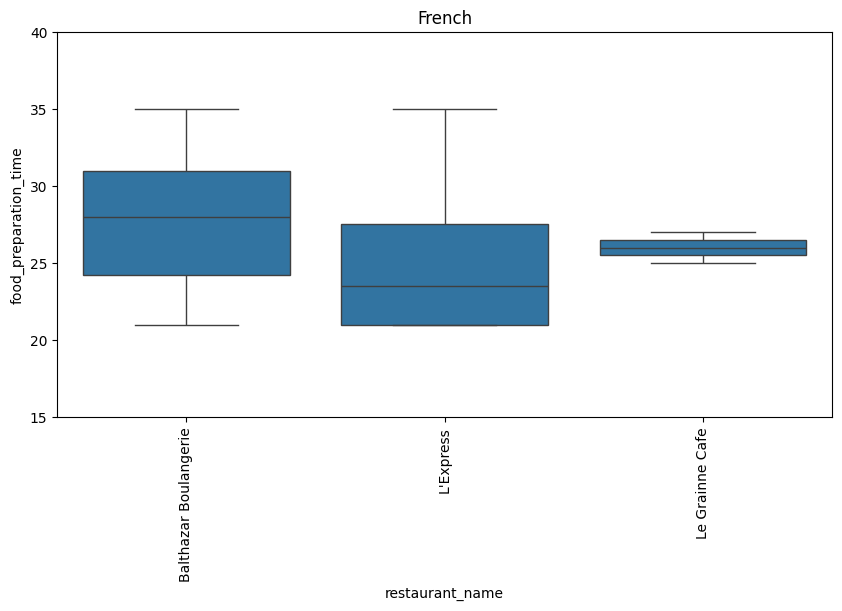

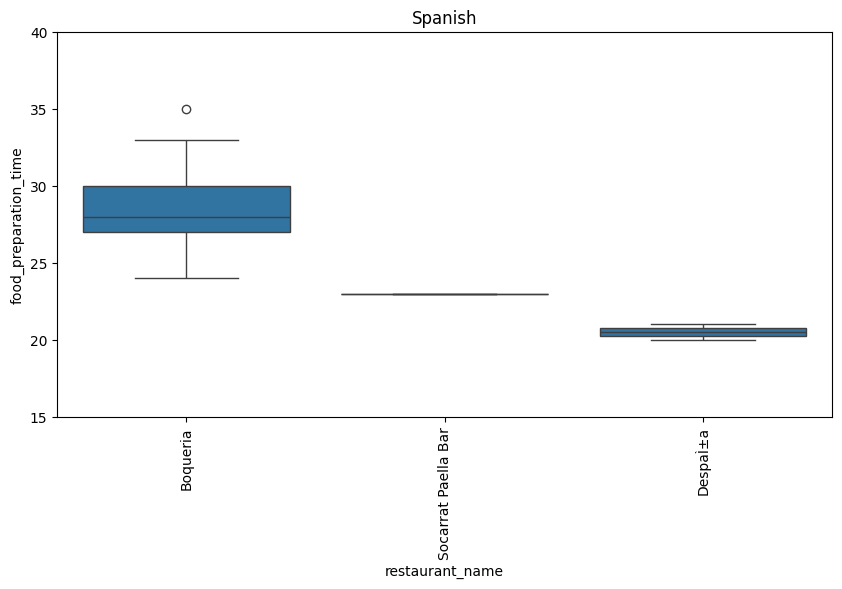

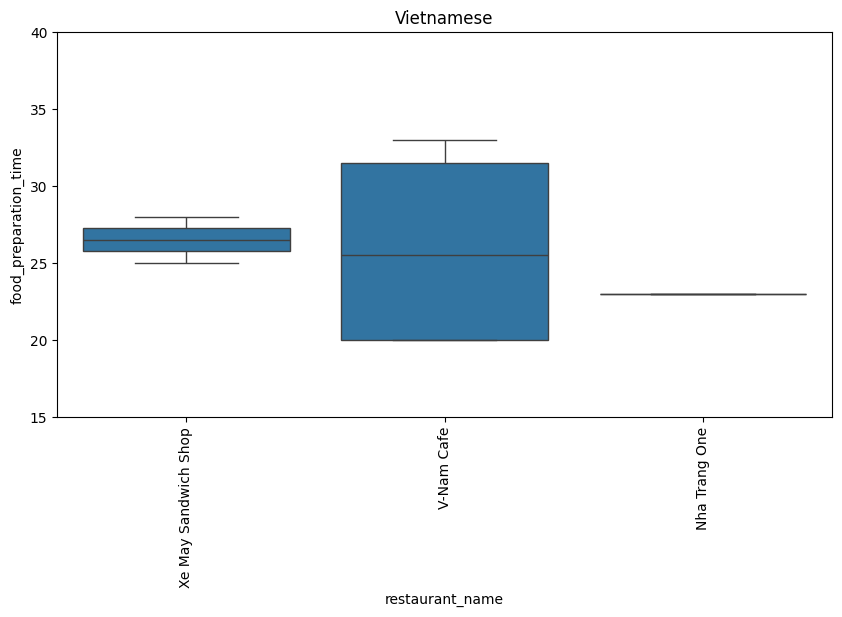

In [204]:
for cuisine in foodhub_df['cuisine_type'].unique():
    plt.figure(figsize=(10,5))
    plt.title(cuisine)
    plt.ylim(15,40)
    sns.boxplot(data=foodhub_df[foodhub_df['cuisine_type']==cuisine],x='restaurant_name',y='food_preparation_time')
    plt.xticks(rotation=90)
    plt.show()

#### Observations:
- Food preparation time is similar across multiple restaurants by cuisine types if we compare the min(around 20 minutes) and max values(around 35 minutes)

#### Delivery time across  cuisine type

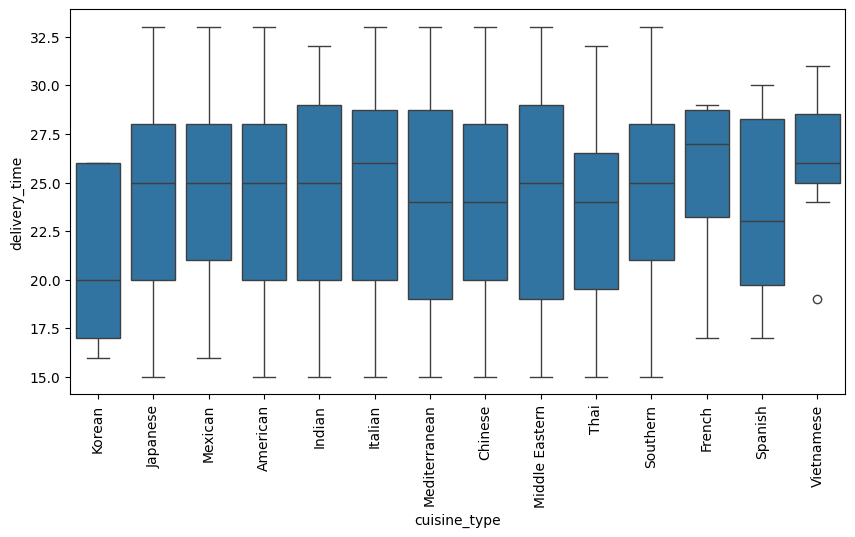

In [205]:
    plt.figure(figsize=(10,5))
    sns.boxplot(data=foodhub_df,x='cuisine_type',y='delivery_time')
    plt.xticks(rotation=90)
    plt.show()

#### Observations :
- Japanese,American,Indian,Italian,Mediterranean,Chinese,Middle Eastern,Thai and Southern cuisine type has the least delivery time of around 15 minutes.
- Japanese,Mexican,American,Italian,Mediterranean,chinese,Middle Eastern and Southern cuisine type has the highest delivery time of around 33 minutes.
- Most of the cuisine types have delivery time between 15 to 33 minutes.
- Min delivery time for Vietnamese cuisine type is 23 minutes.

#### Delivery time across restaurants by cuisine type

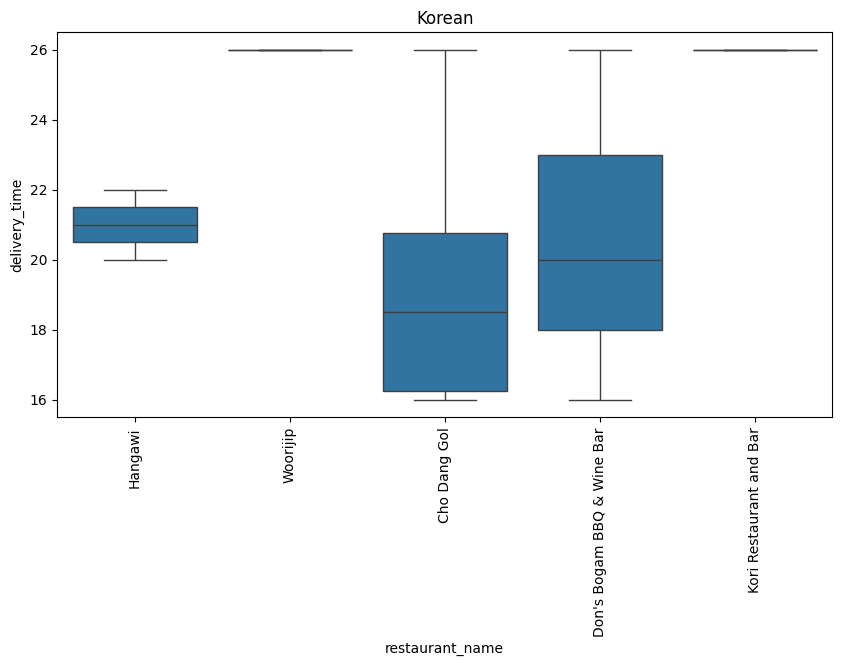

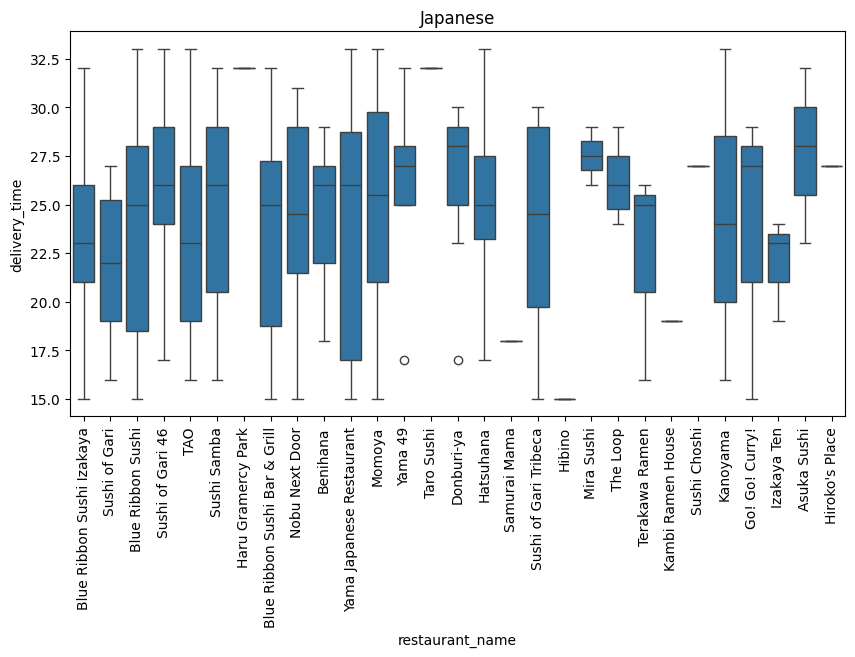

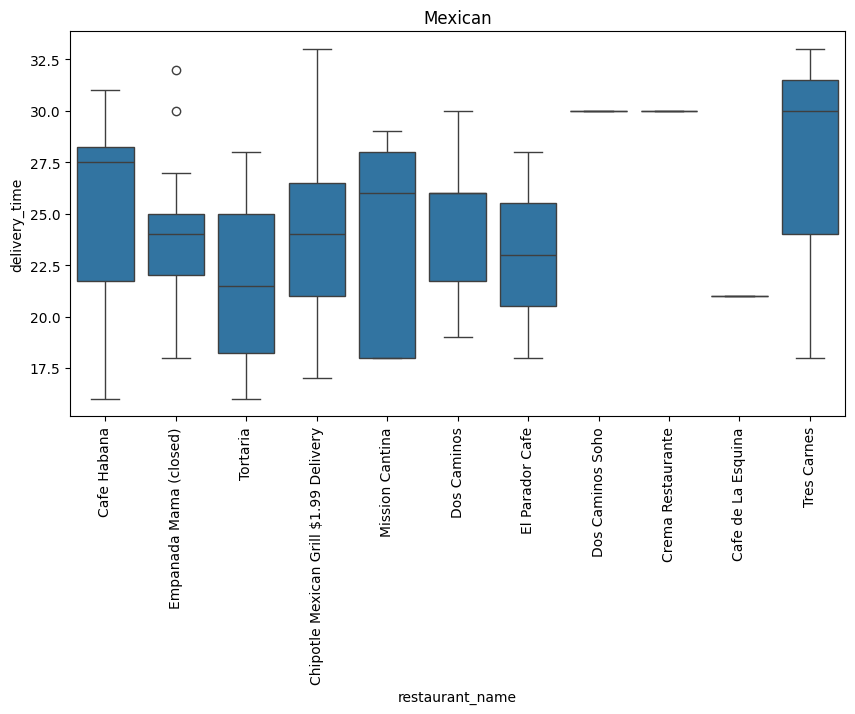

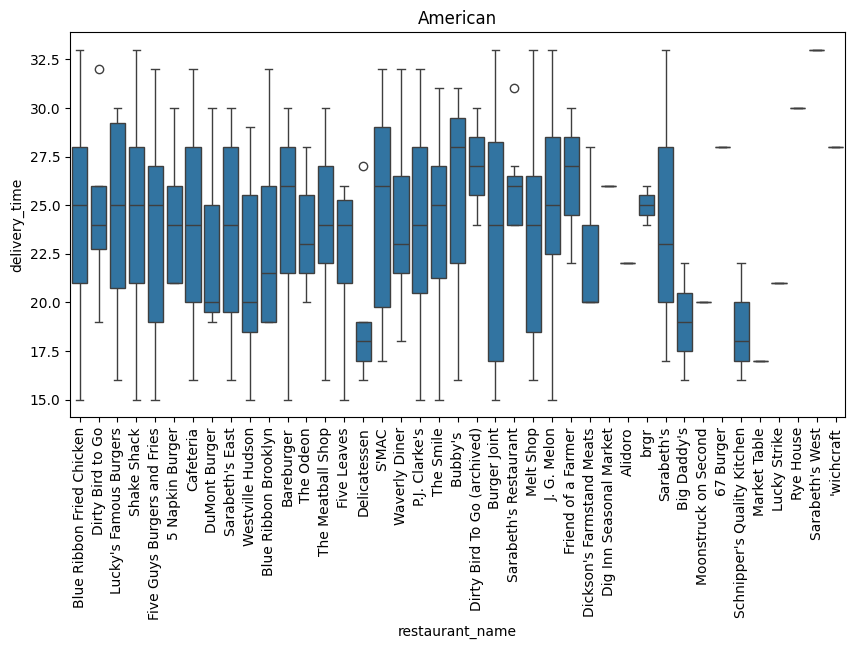

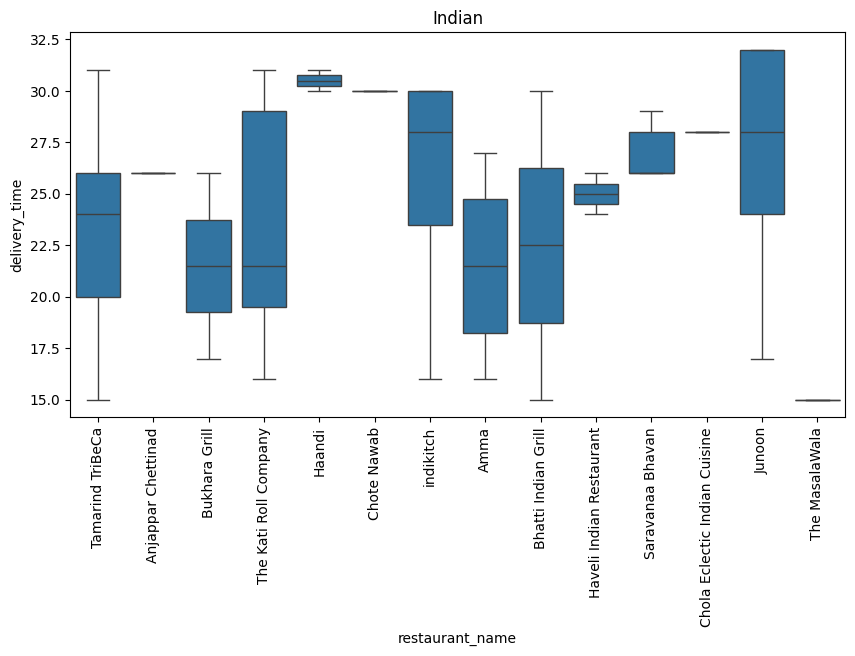

...

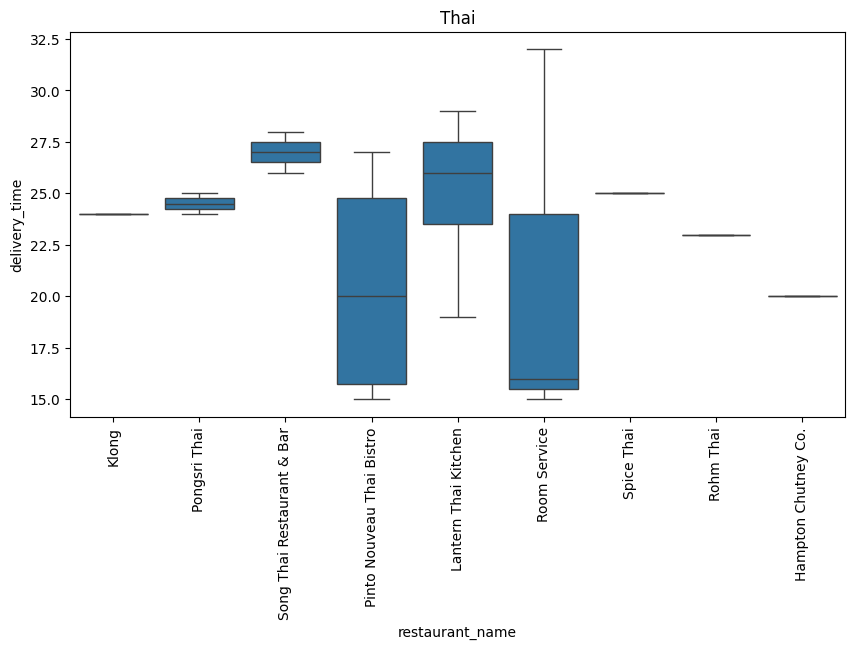

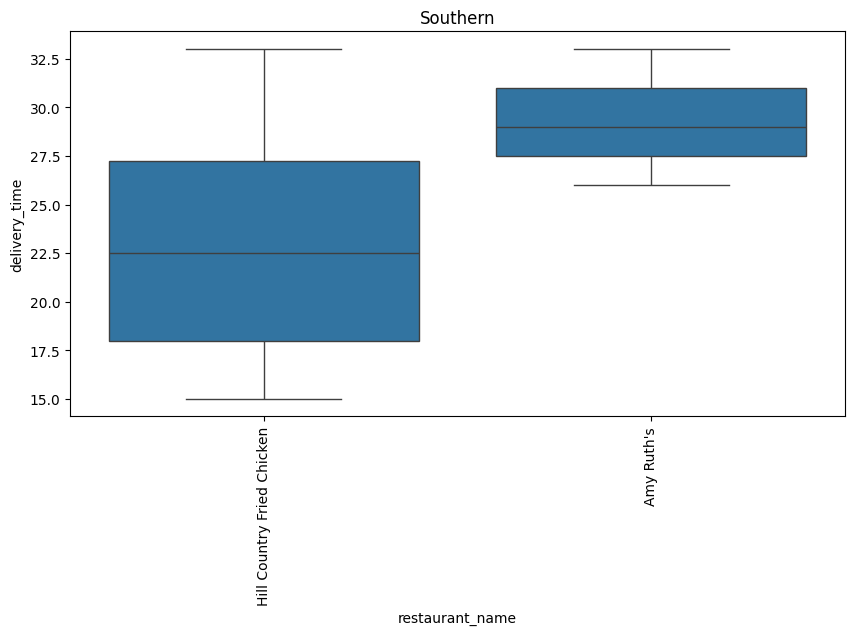

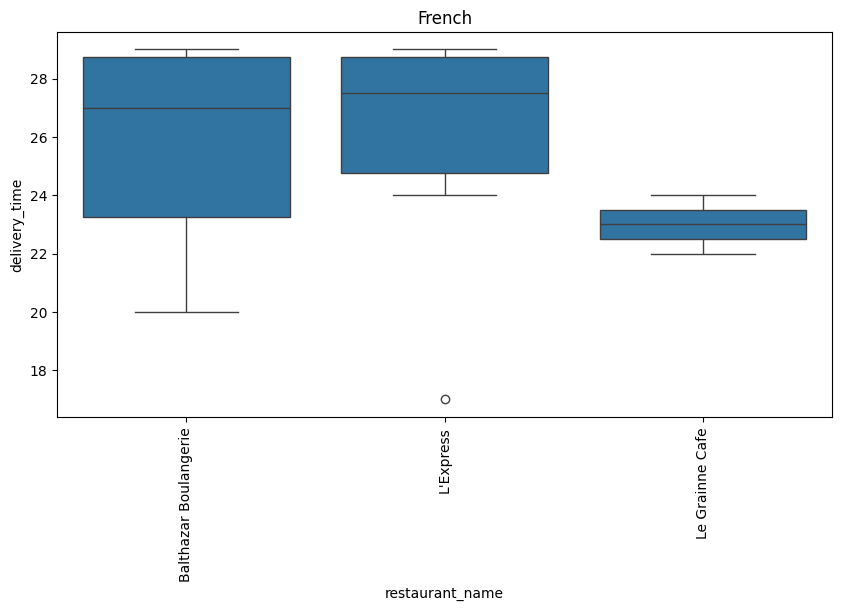

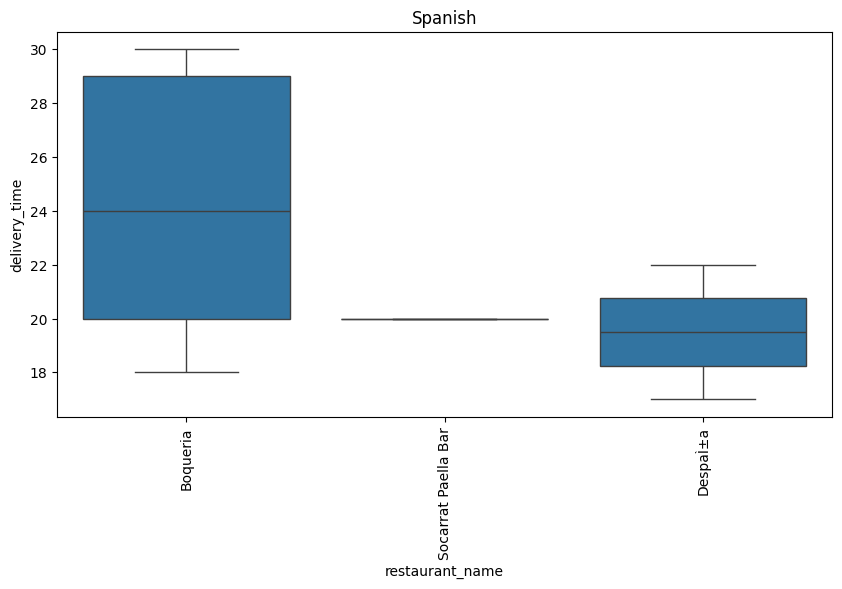

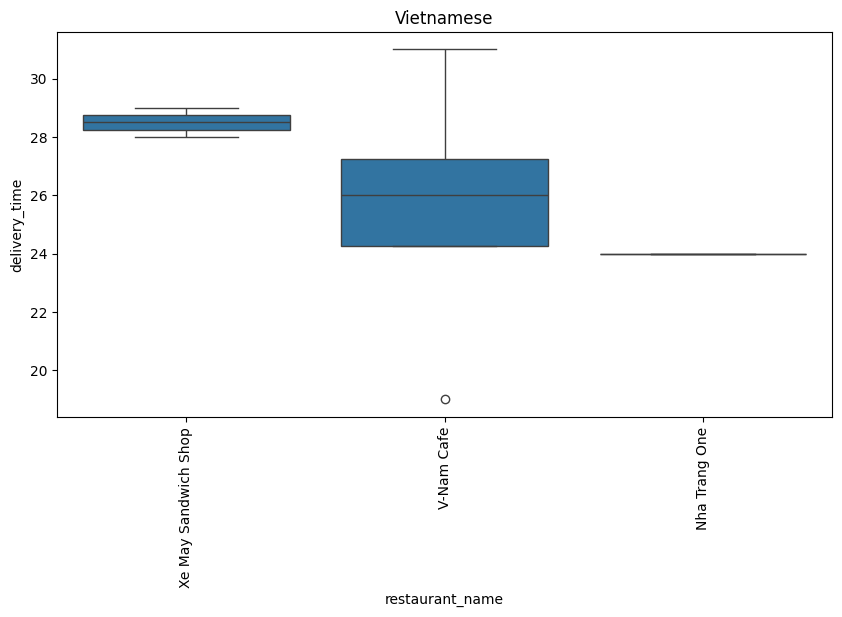

In [206]:
for cuisine in foodhub_df['cuisine_type'].unique():
    plt.figure(figsize=(10,5))
    plt.title(cuisine)
    sns.boxplot(data=foodhub_df[foodhub_df['cuisine_type']==cuisine],x='restaurant_name',y='delivery_time')
    plt.xticks(rotation=90)
    plt.show()

#### Observations:
- Most of the cuisine type, the min delivery time is 15 minutes
- Max time is between 30 minutes and 33 minutes across cuisine types and restaurants.


#### Total time across  cuisine type

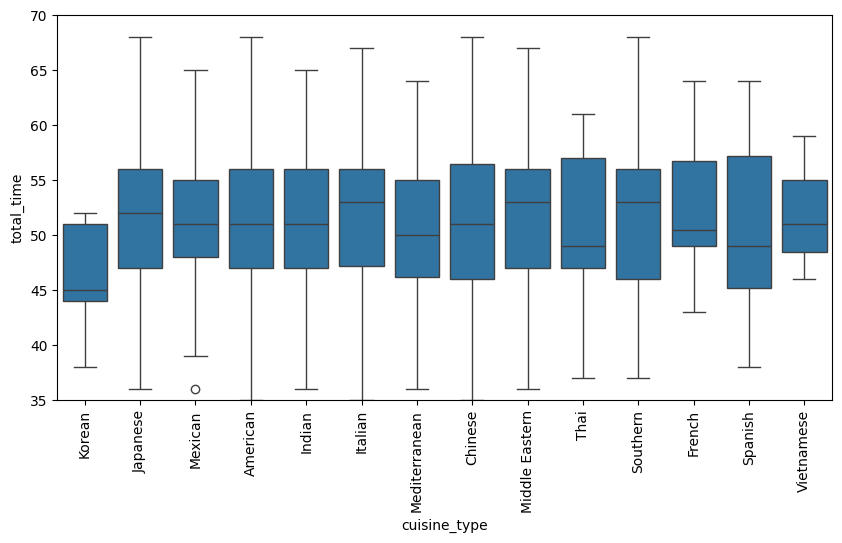

In [207]:
    plt.figure(figsize=(10,5))
    plt.ylim(35,70)
    sns.boxplot(data=foodhub_df,x='cuisine_type',y='total_time')
    plt.xticks(rotation=90)
    plt.show()

#### Observations:
- American, Italian,Chinese has the least total time of around 35 minutes.
- Japanese, American, Chinese and Southern has the max total time of around 68 minutes
- Median total time for some of the popular cuisines
    - American - around 51 minutes
    - Japanese - around 52 minutes
    - Italian - around 53 minutes
    - Chinese - around 51 minutes

#### Total time across restaurants by cuisine type

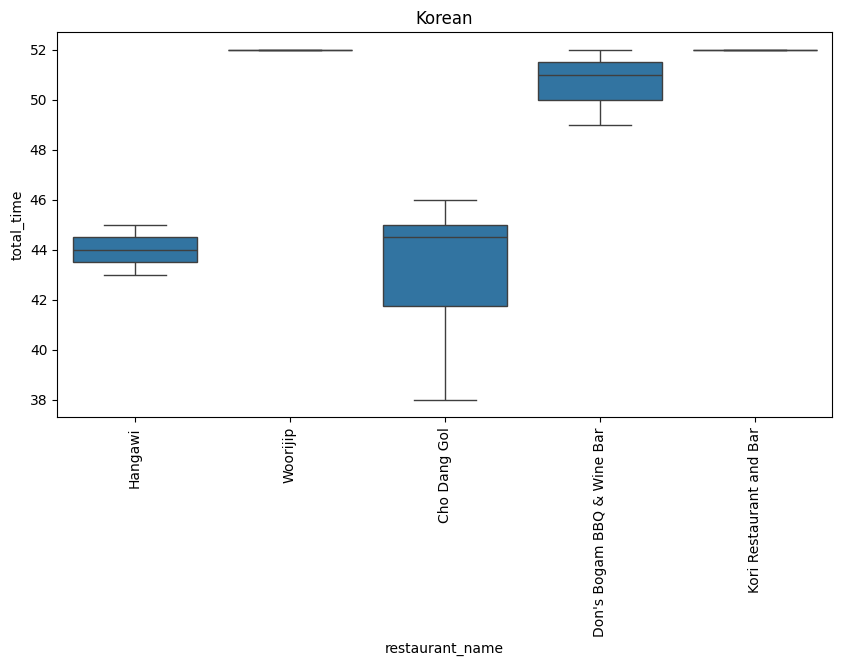

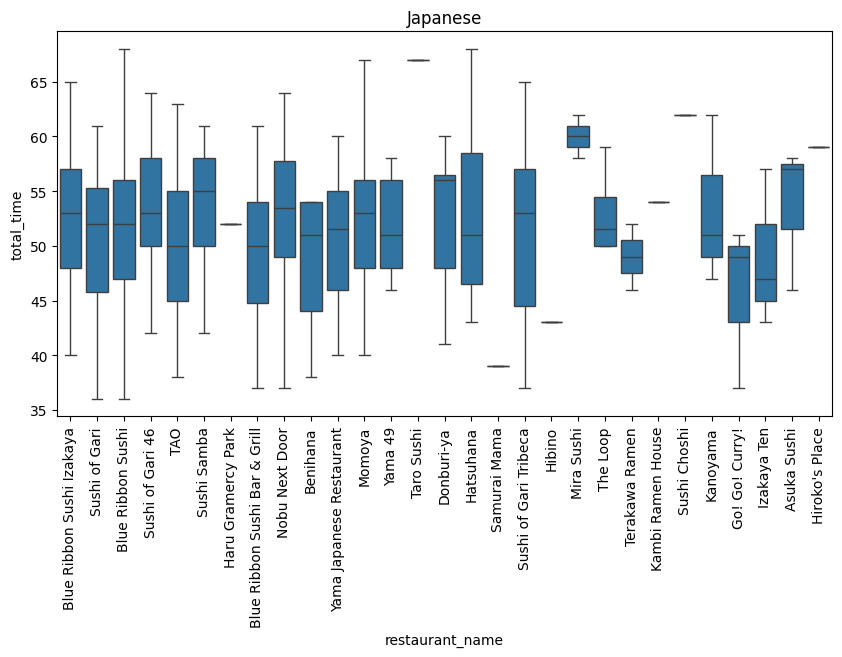

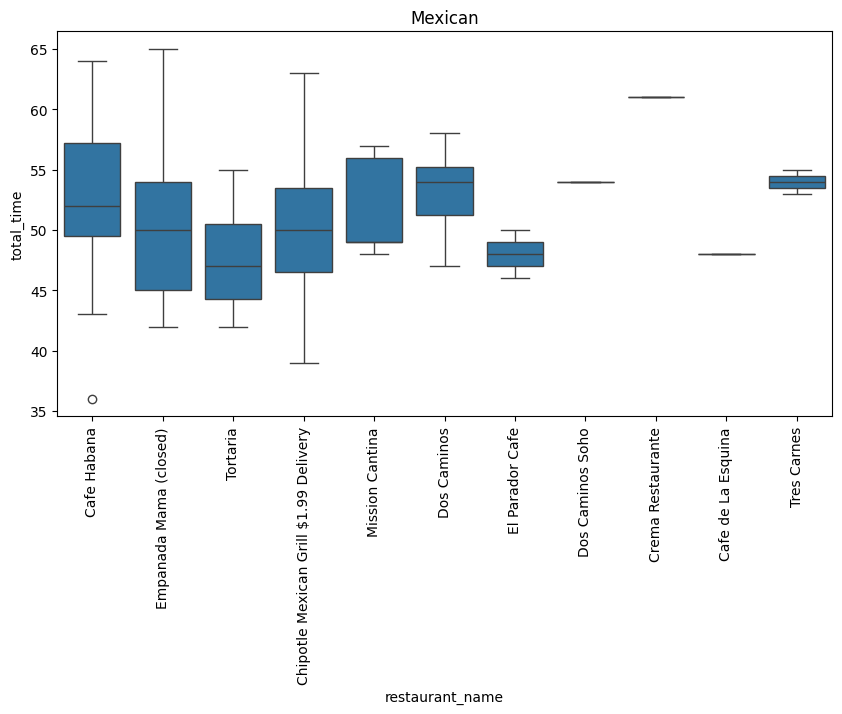

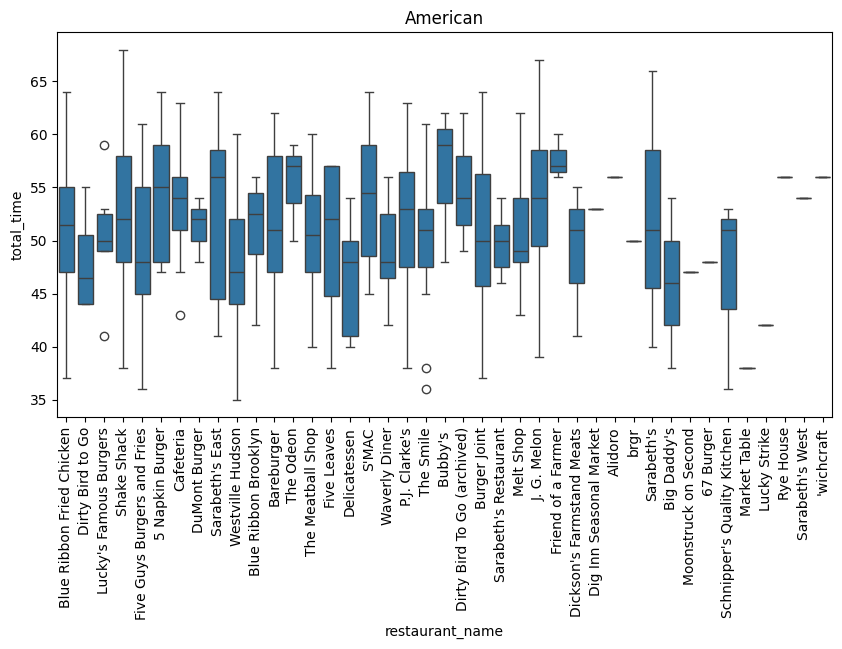

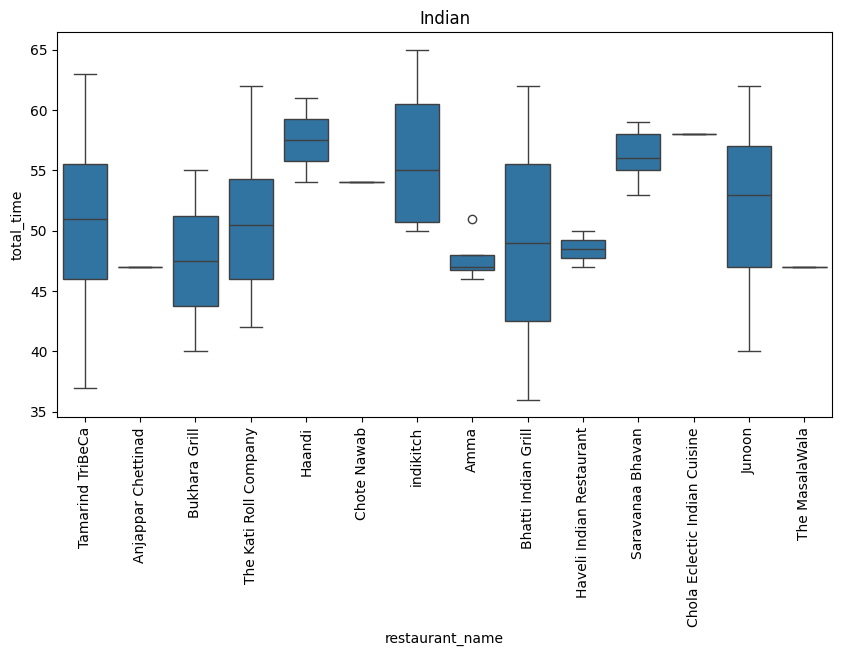

...

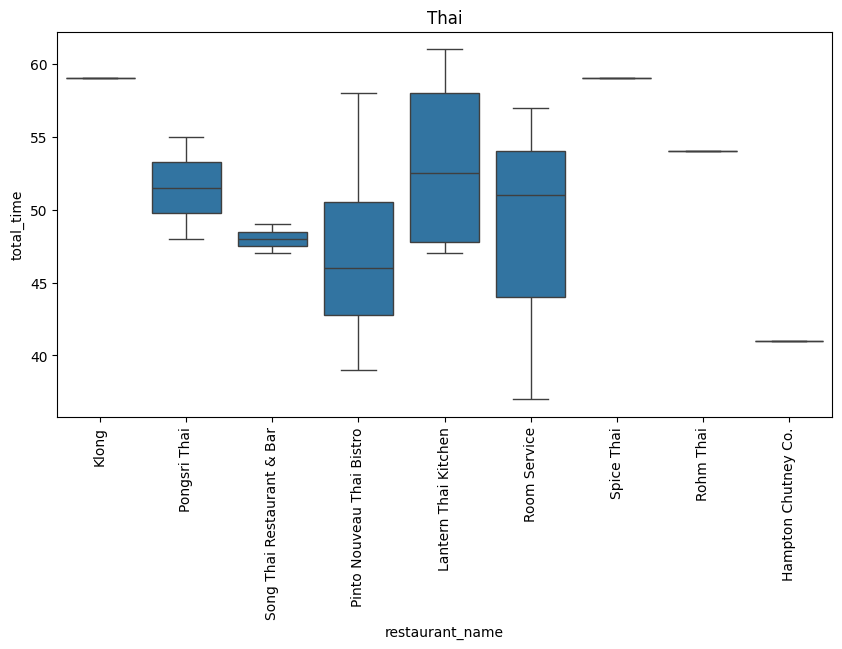

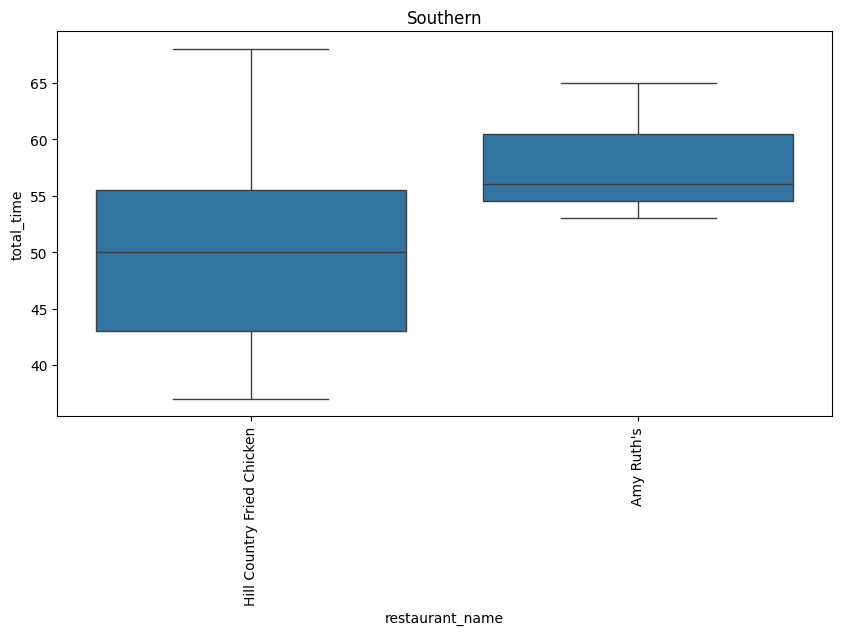

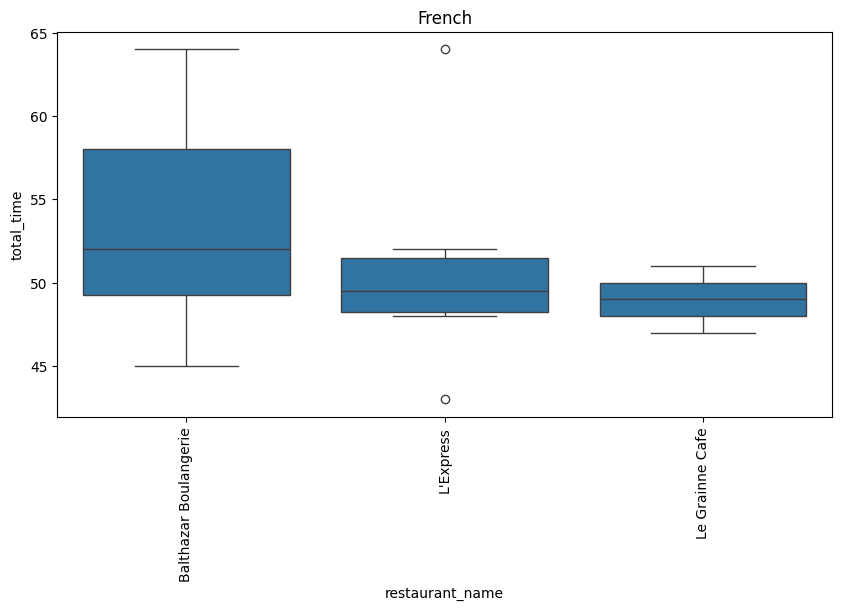

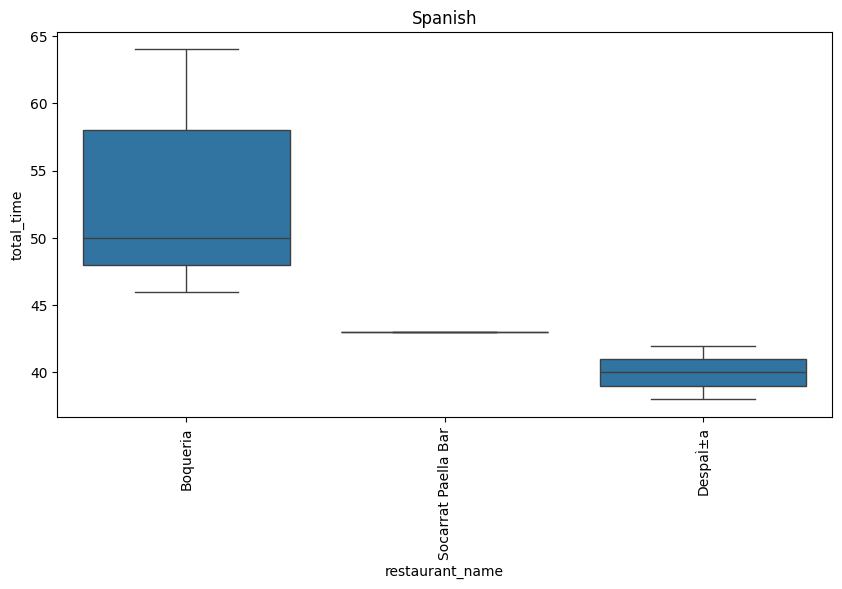

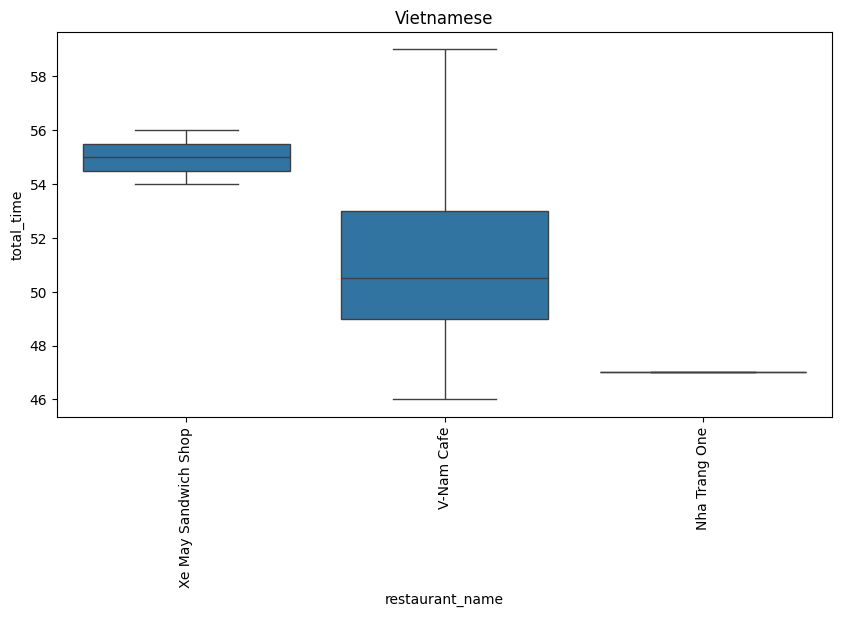

In [208]:
for cuisine in foodhub_df['cuisine_type'].unique():
    plt.figure(figsize=(10,5))
    plt.title(cuisine)
    sns.boxplot(data=foodhub_df[foodhub_df['cuisine_type']==cuisine],x='restaurant_name',y='total_time')
    plt.xticks(rotation=90)
    plt.show()

#### Observations:
- Median total time of some of the popular restaurants
    - Shake Shack - around 51.5 minutes
    - The Meatball Shop - around 51 minutes
    - Blue Ribbon Sushi - around 52 minutes
    - Blue Ribbon Fried Chicken - around 51 minutes
    - Parm - around 54.5 minutes



#### Rating across  cuisine type

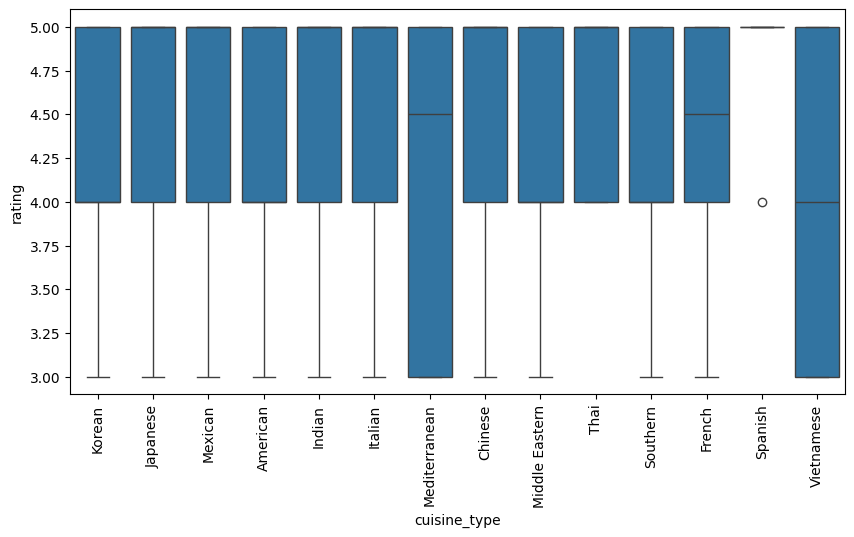

In [209]:
    plt.figure(figsize=(10,5))
    sns.boxplot(data=foodhub_df,x='cuisine_type',y='rating')
    plt.xticks(rotation=90)
    plt.show()

#### Observations:
- Q1 is 4.00 for most of the cuisine types other than Mediterranean, Spanish and Vietnamese. This means 75% of the ratings has value greater than 4.00 for all cuisine type other than the exceptions mentioned


#### Rating across restaurants by cuisine type

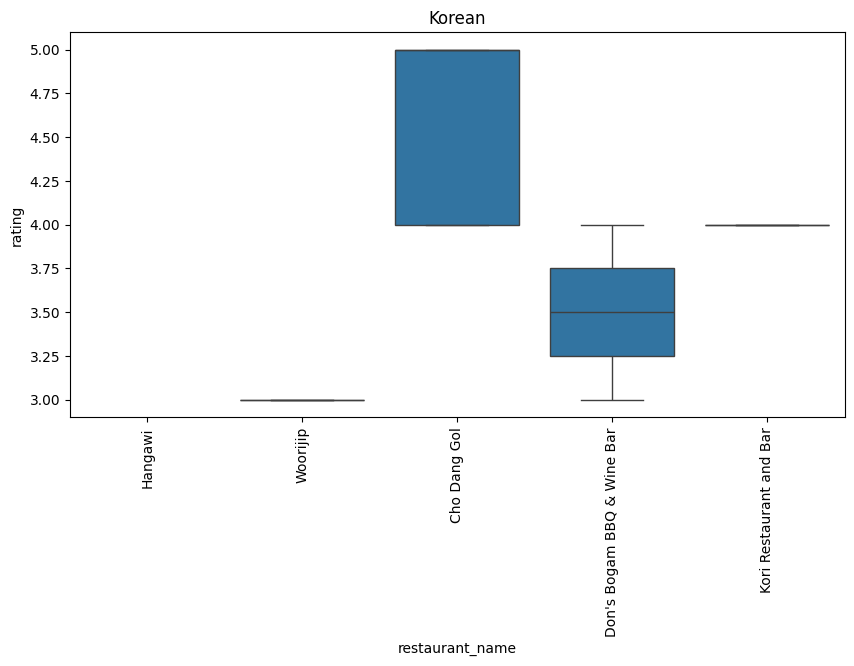

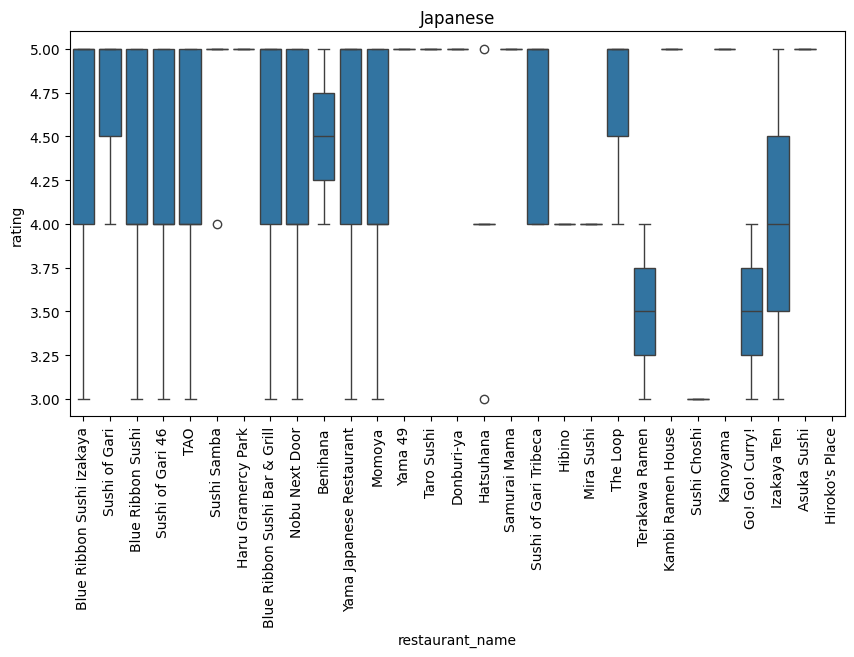

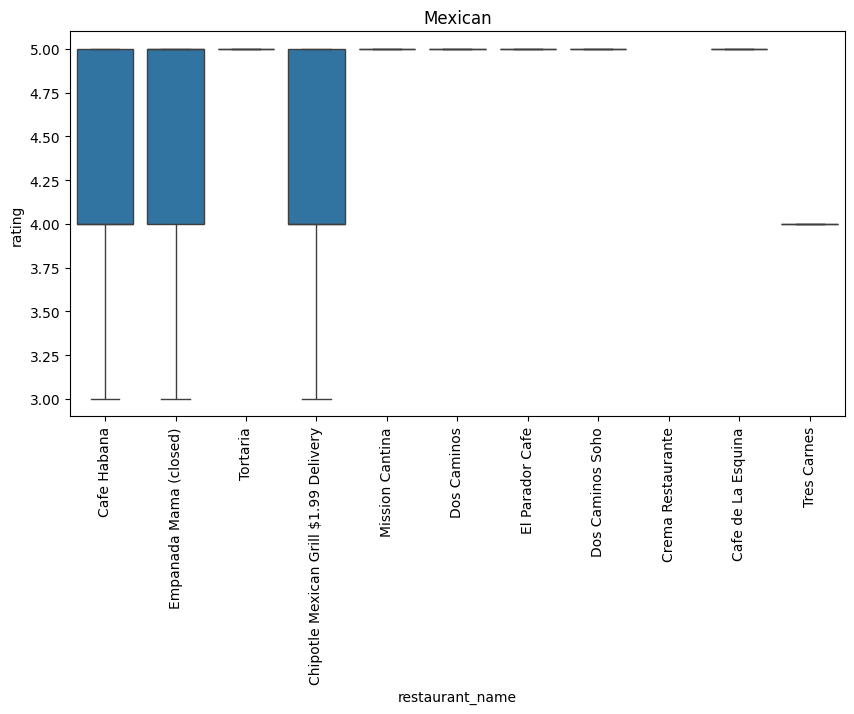

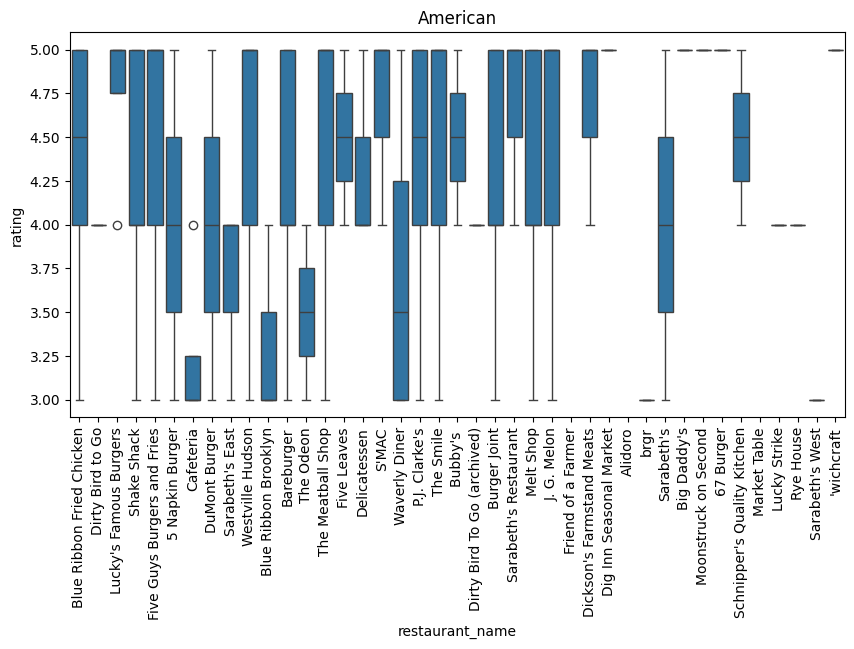

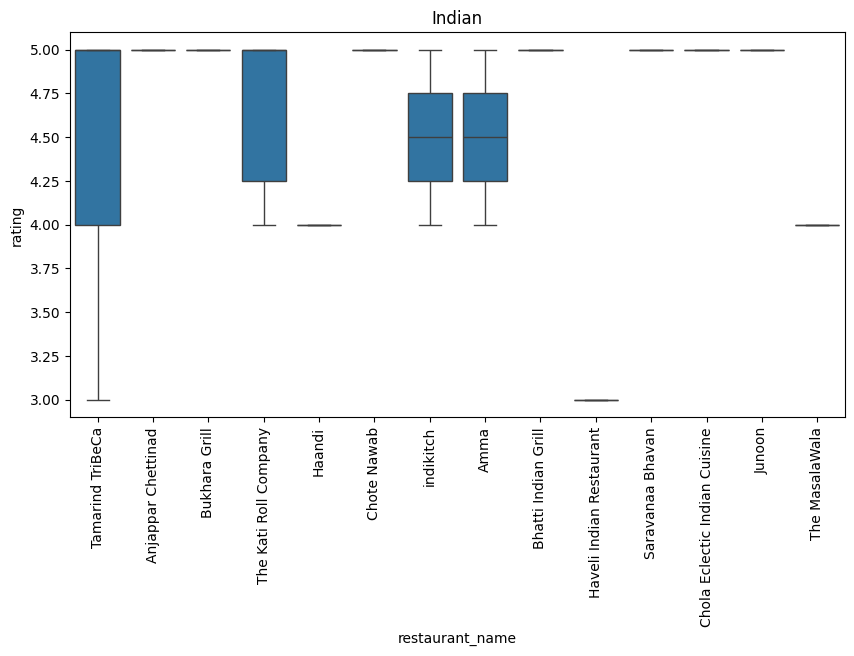

...

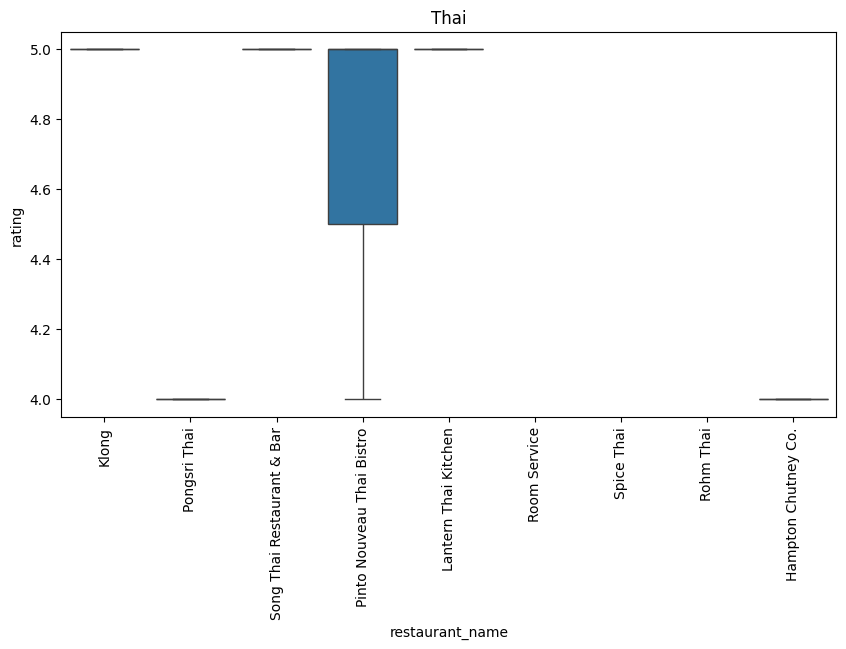

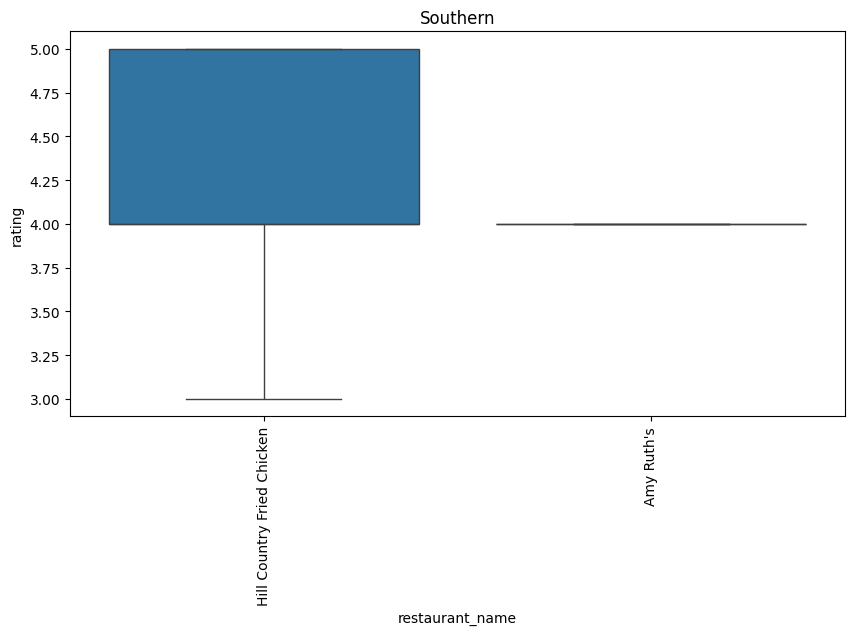

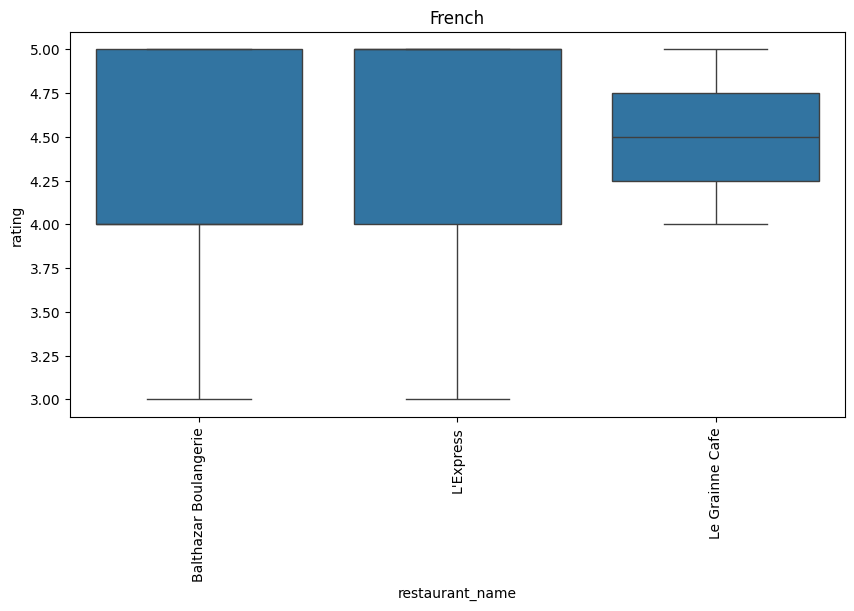

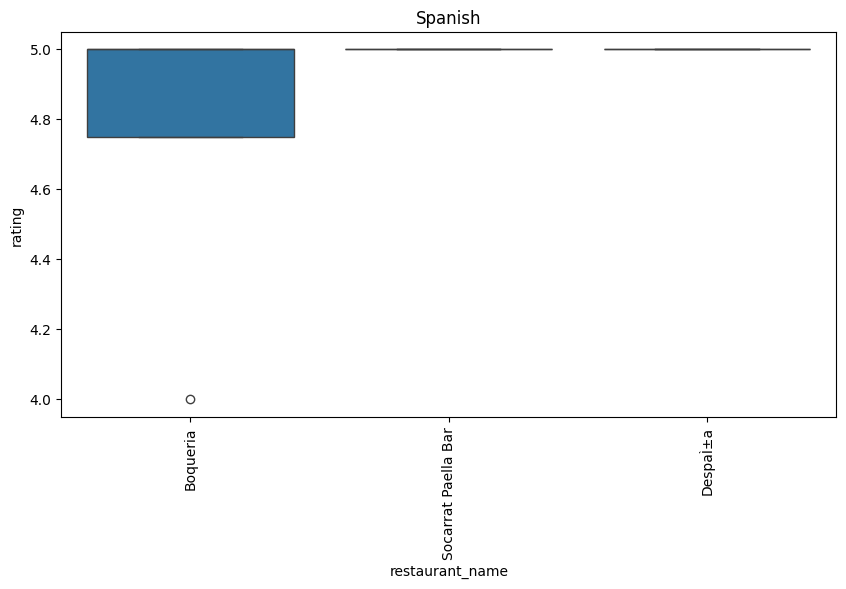

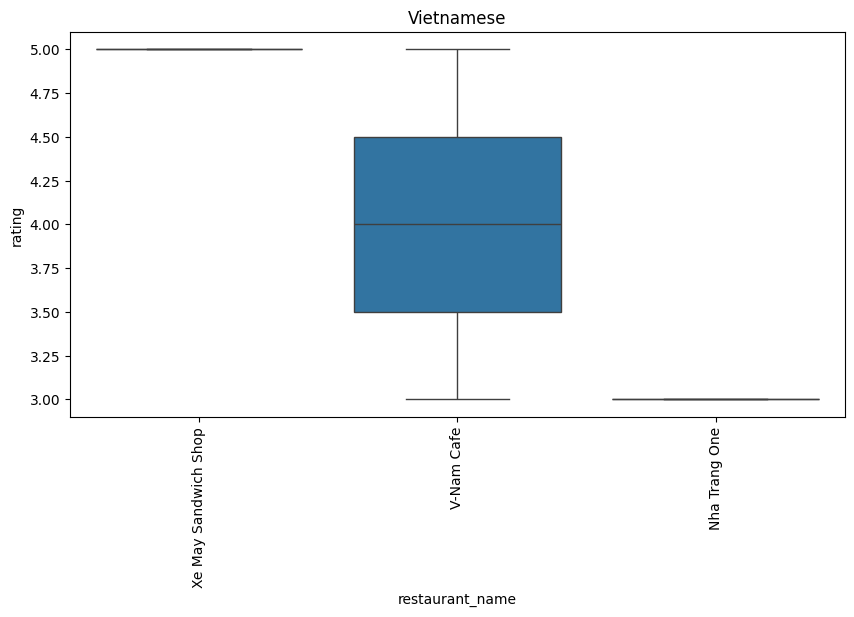

In [210]:
for cuisine in foodhub_df['cuisine_type'].unique():
    plt.figure(figsize=(10,5))
    plt.title(cuisine)
    sns.boxplot(data=foodhub_df[foodhub_df['cuisine_type']==cuisine],x='restaurant_name',y='rating')
    plt.xticks(rotation=90)
    plt.show()

#### Observations:
- Min, Max and  Median ratings of some of the popular restaurants
    - Shake Shack - Median line is not visible. Min rating is 3.0 and max rating is 5.0
    - The Meatball Shop - Median line is not visible. Min rating is 3.0 and max rating is 5.0
    - Blue Ribbon Sushi - Median line is not visible. Min rating is 3.0 and max rating is 5.0
    - Blue Ribbon Fried Chicken - Median rating is 4.5. Min rating is 3.0 and max is 5.0
    - Parm - Median line is not visible. Min rating is 3.0 and max rating is 5.0


**Lets get the stats**

In [211]:
#get the Median rating of Shake Shack
foodhub_df[foodhub_df['restaurant_name']=='Shake Shack']['rating'].median()

4.0

In [212]:
#get the Median rating of The Meatball Shop
foodhub_df[foodhub_df['restaurant_name']=='The Meatball Shop']['rating'].median()

5.0

In [213]:
#get the Median rating of Blue Ribbon Sushi
foodhub_df[foodhub_df['restaurant_name']=='Blue Ribbon Sushi']['rating'].median()

4.0

In [214]:
#get the Median rating of Blue Ribbon Fried Chicken
foodhub_df[foodhub_df['restaurant_name']=='Blue Ribbon Fried Chicken']['rating'].median()

4.5

In [215]:
#get the Median rating of Parm
foodhub_df[foodhub_df['restaurant_name']=='Parm']['rating'].median()

4.0

#### Observations
- The Meatball Shop is highly rated. Its Median rating is 5.0
- All the top 5 restaurants has Median rating of 4.0 or greater

**Lets explore the dispersion of cost of the order in each cuisine type**

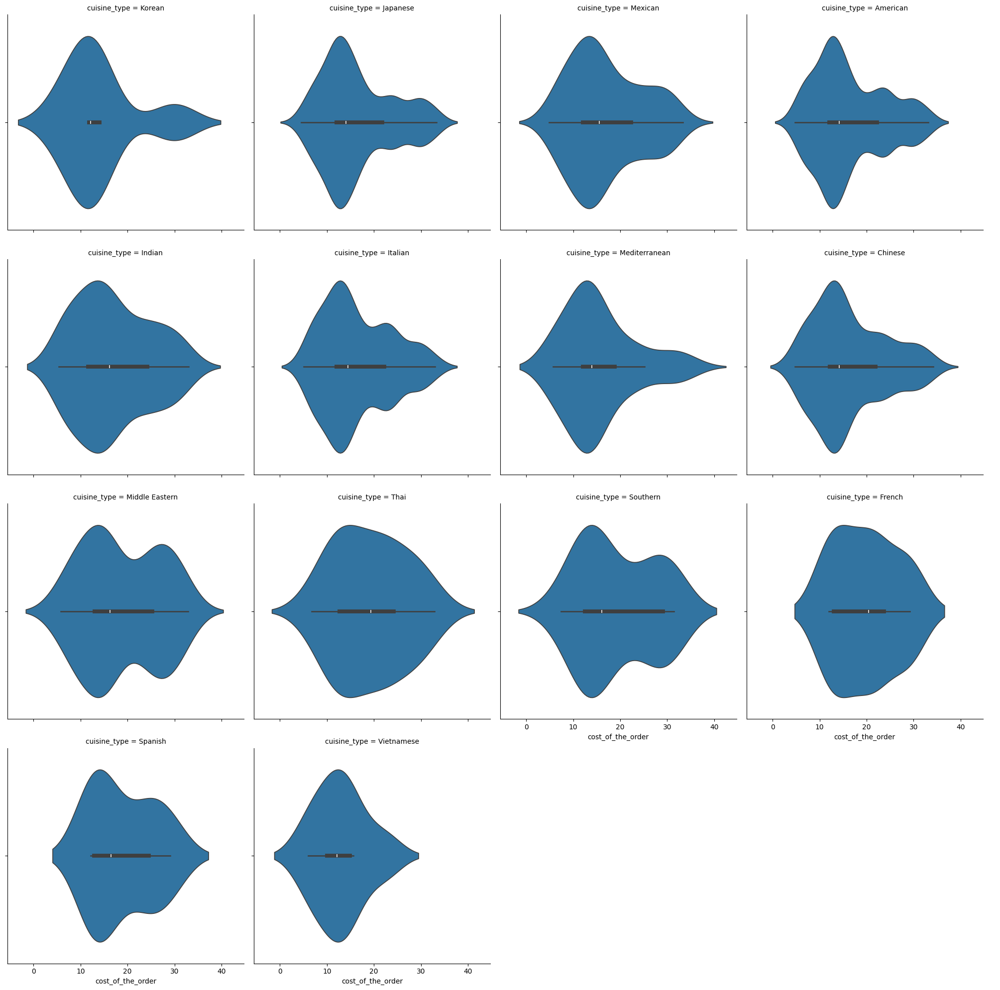

In [216]:
# Dispersion of cost of the order in each cuisine type
sns.catplot(x='cost_of_the_order',
            col='cuisine_type',
            data=foodhub_df,
            col_wrap=4,
            kind="violin")
plt.show()

#### Observations:
- Dispersion of the cost of the order looks similar in Japanese,American , Italian	 and Chinese	 cuisine type.
- Dispersion of the cost of the order looks similar in Mexican and Indian cuisine type.
- Dispersion of the cost of the order looks similar in Middle Eastern, Spanish and Southern cuisine type

**Lets explore the dispersion of food preparation time in each cuisine type**

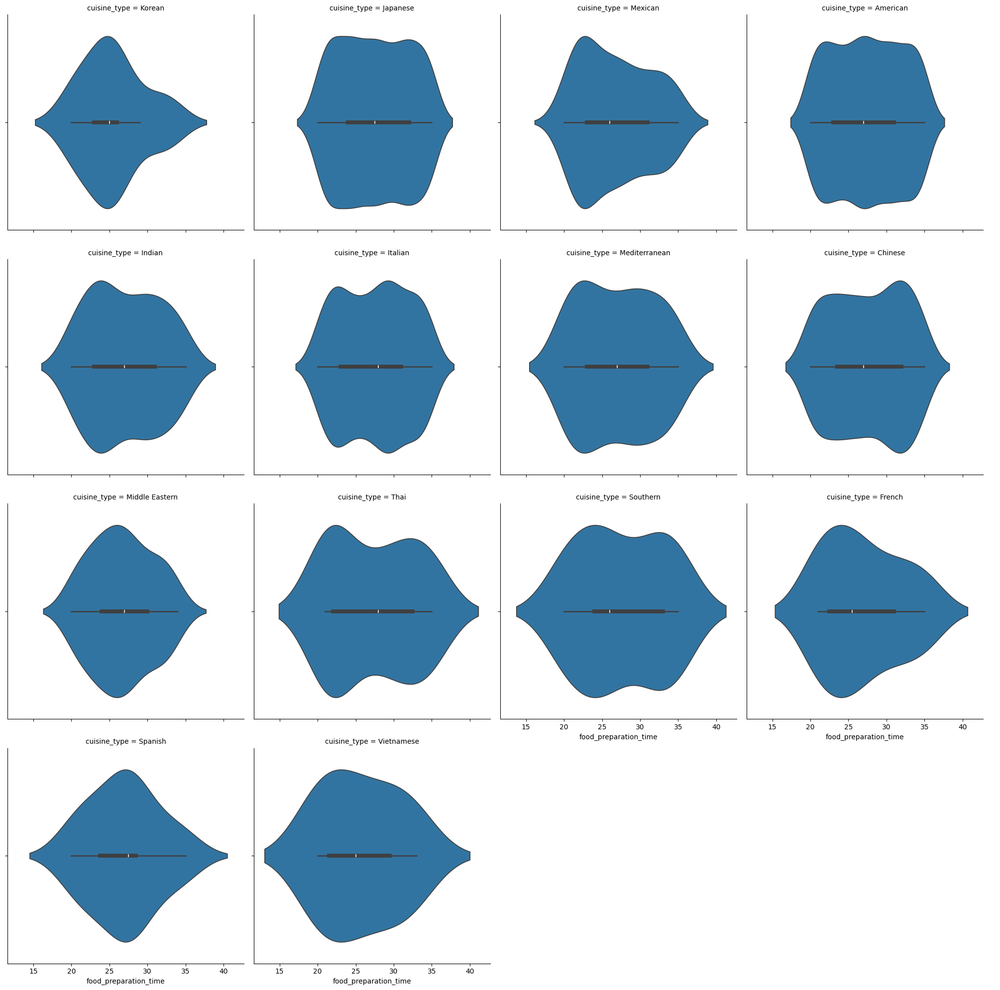

In [217]:
# Dispersion of food preparation time in each cuisine type
sns.catplot(x='food_preparation_time',
            col='cuisine_type',
            data=foodhub_df,
            col_wrap=4,
            kind="violin")
plt.show()

#### Observations:
- Dispersion of the food preparation time looks similar in Japanese, American and Italian cuisine type
- Dispersion of the food preparation time looks similar in Indian Mediterranean , Southern cuisine type
- Dispersion of the food preparation time looks similar in Mexican French,  and Vietnamese cuisine type
- Dispersion of the food preparation time looks similar in Middle Eastern and Spanish cuisine type

**Lets explore the dispersion of delivery time in each cuisine type**

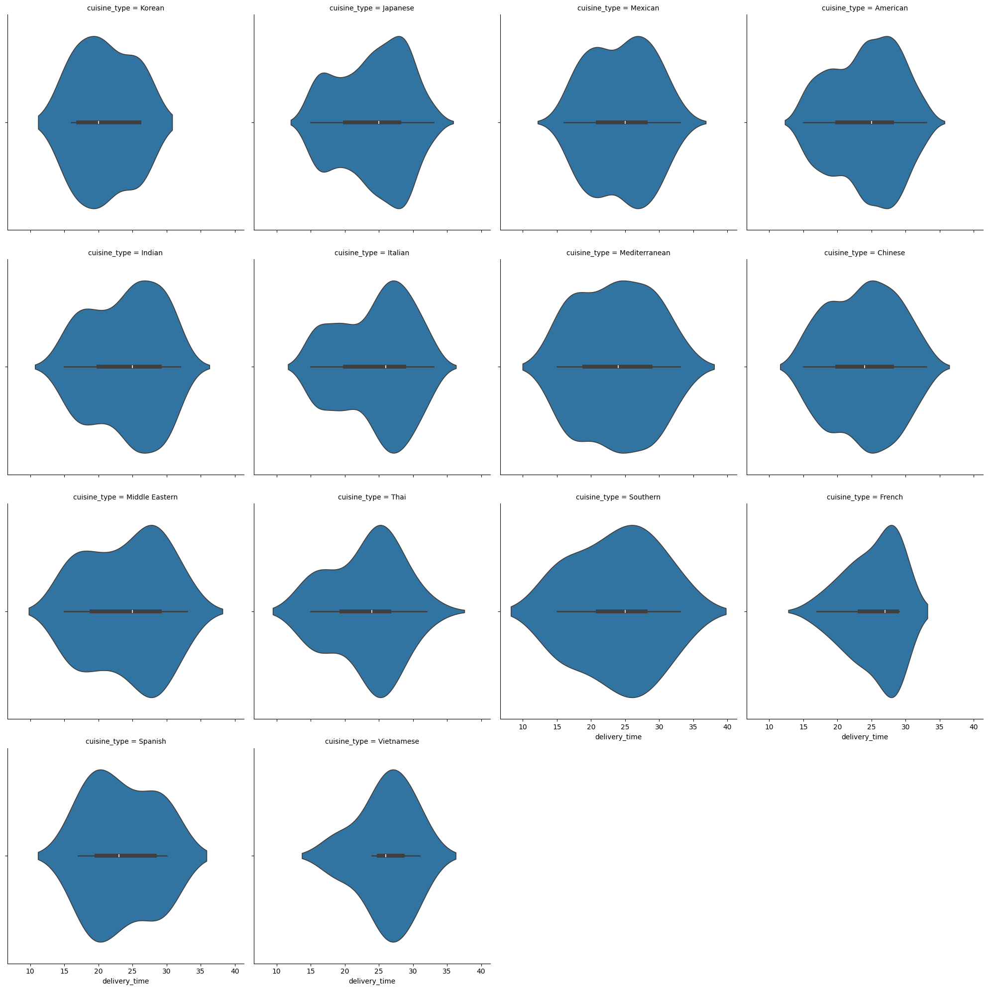

In [218]:
# Dispersion of delivery time in each cuisine type
sns.catplot(x='delivery_time',
            col='cuisine_type',
            data=foodhub_df,
            col_wrap=4,
            kind="violin")
plt.show()

#### Observations:
- Dispersion of the food preparation time looks similar in  Indian, Middle eastern , Japanese, American cuisine type.

**Lets explore the dispersion of total time in each cuisine type**

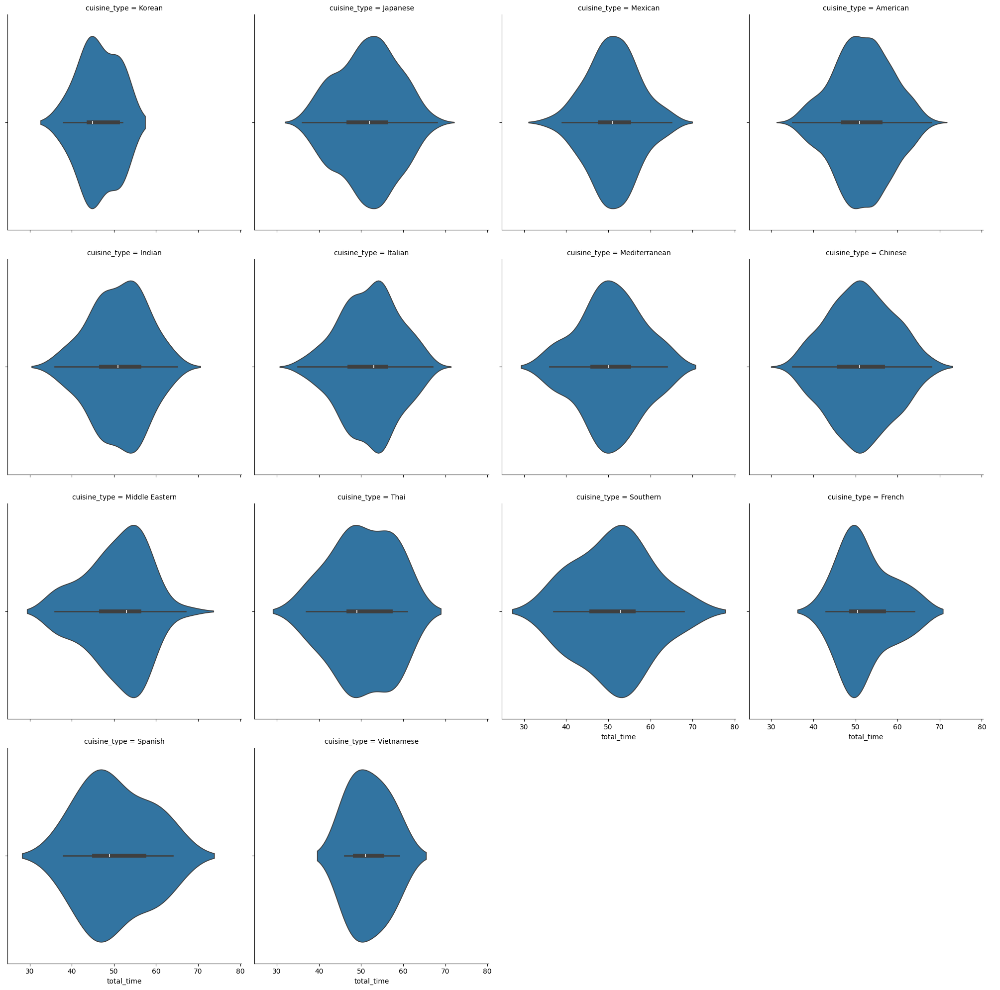

In [219]:
# Dispersion of total time in each cuisine type
sns.catplot(x='total_time',
            col='cuisine_type',
            data=foodhub_df,
            col_wrap=4,
            kind="violin")
plt.show()

#### Observations:
- Dispersion of the total  time looks similar in  Mexican, American,Chinese and Mediterranean cuisine type
- Dispersion of the total  time looks similar in Indian ,Italian  cuisine type

**Lets explore the dispersion of rating in each cuisine type**

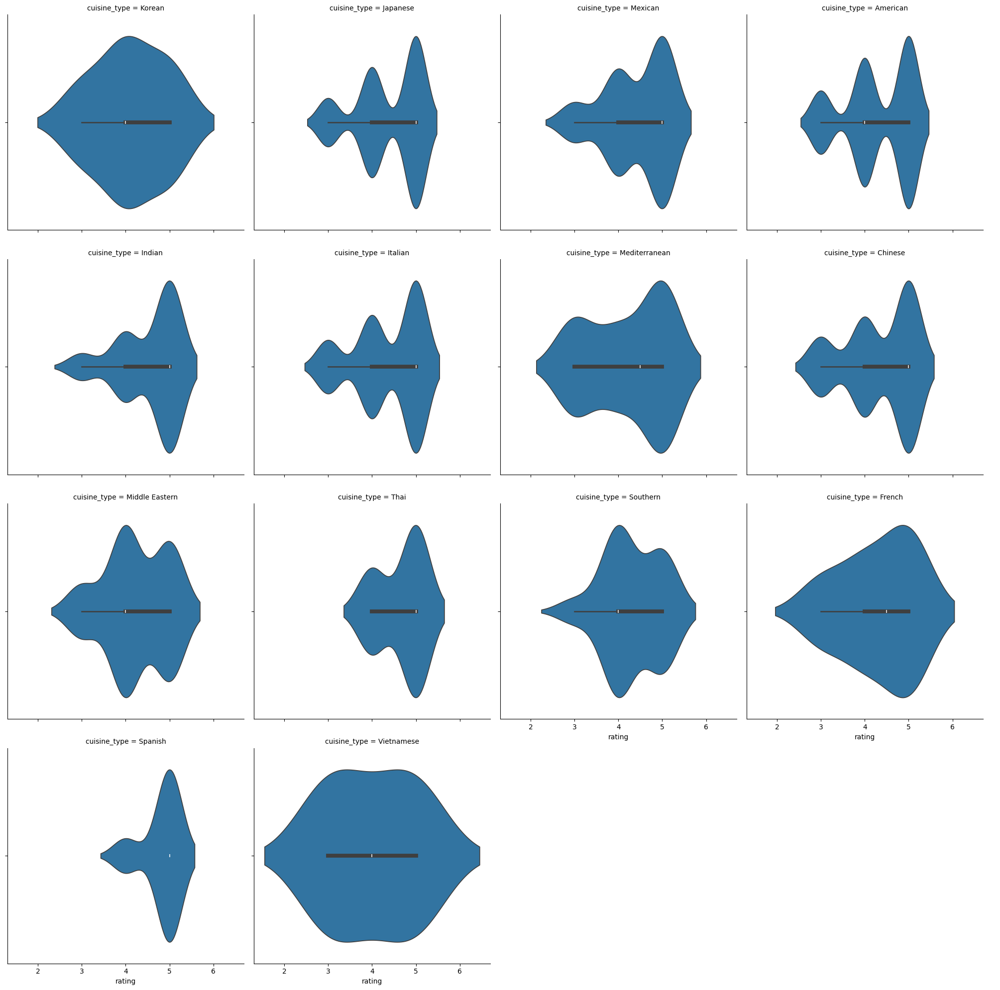

In [220]:
# Dispersion of rating in each cuisine type
sns.catplot(x='rating',
            col='cuisine_type',
            data=foodhub_df,
            col_wrap=4,
            kind="violin")
plt.show()

#### Observations:
- Dispersion of rating looks similar in Japanese, American, Italian and Chinese cuisine type.

**Total time across cuisine type on weekdays and weekends**

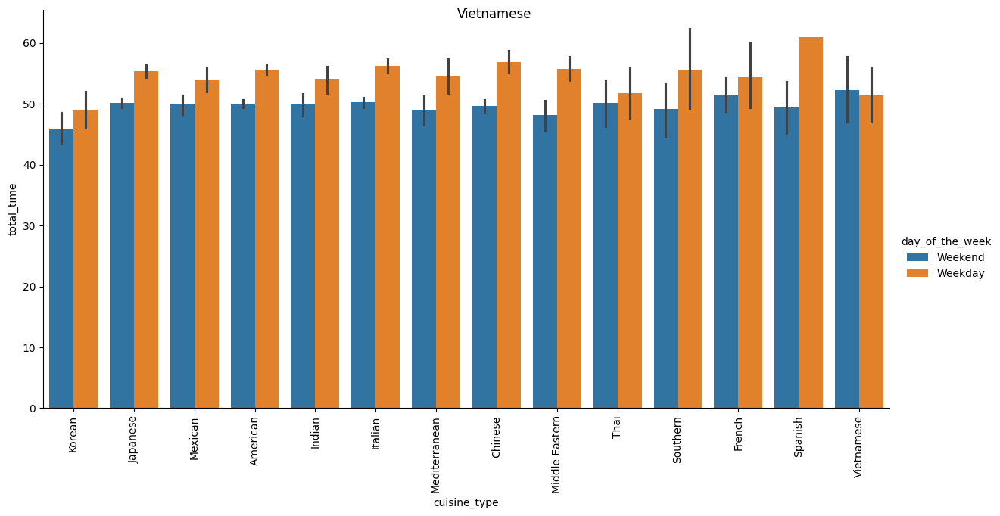

In [221]:
# catplot with kind=bar represents the mean or the average value of total time across different cuisine on weekdays and weekends
g= sns.catplot(y='total_time', x='cuisine_type', data=foodhub_df,kind="bar",hue='day_of_the_week',height=6,aspect=2)
g.fig.suptitle(cuisine)
g.set_xticklabels(rotation=90)
plt.show()

#### Observations:
- The average total time on weekend is lower than Weekday across all cuisine type other than Vietnamese cuisine type.
- The lowest weekend average time is around 49 minutes in Korean cuisine
- The lowest weekday average time is around 50 minutes in Korean cuisine
- The highest weekend average time is around 50 minutes in Vietnamese cuisine
- The highest weekday average time is around 60 minutes in Spanish cuisine

**Total time across restaurants by cuisine type on weekdays and weekends**

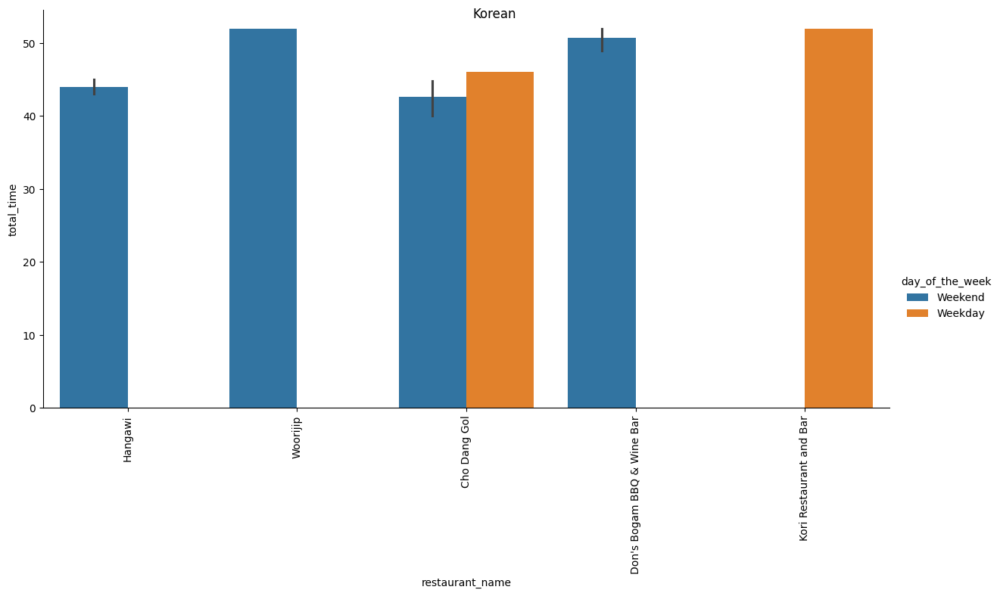

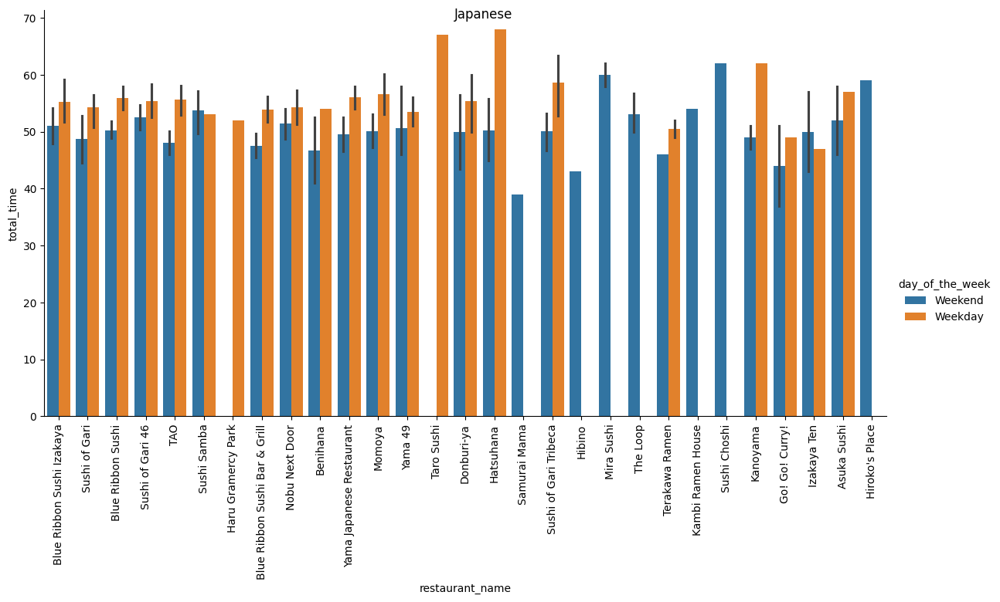

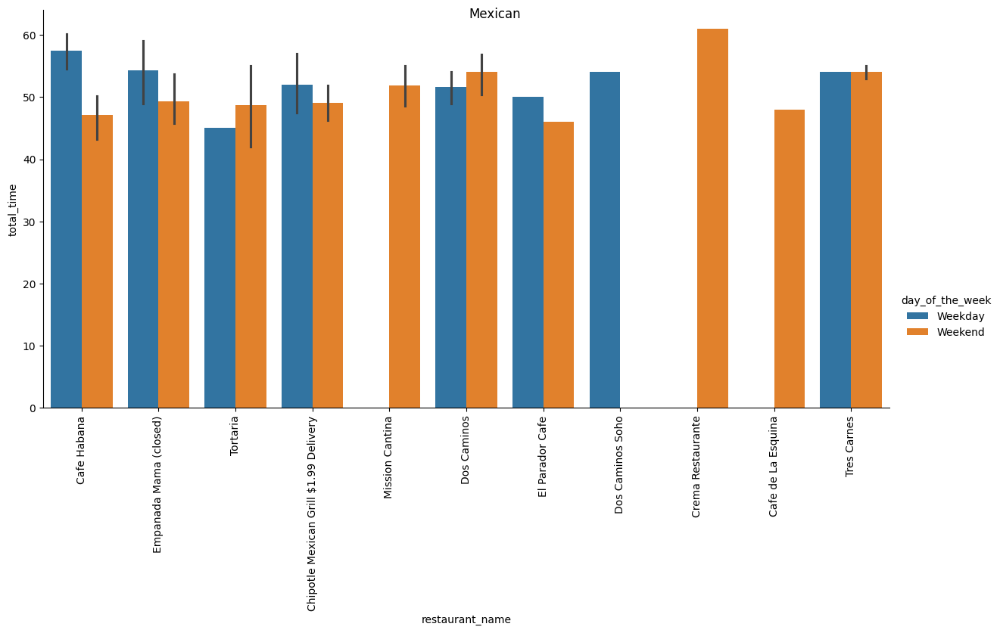

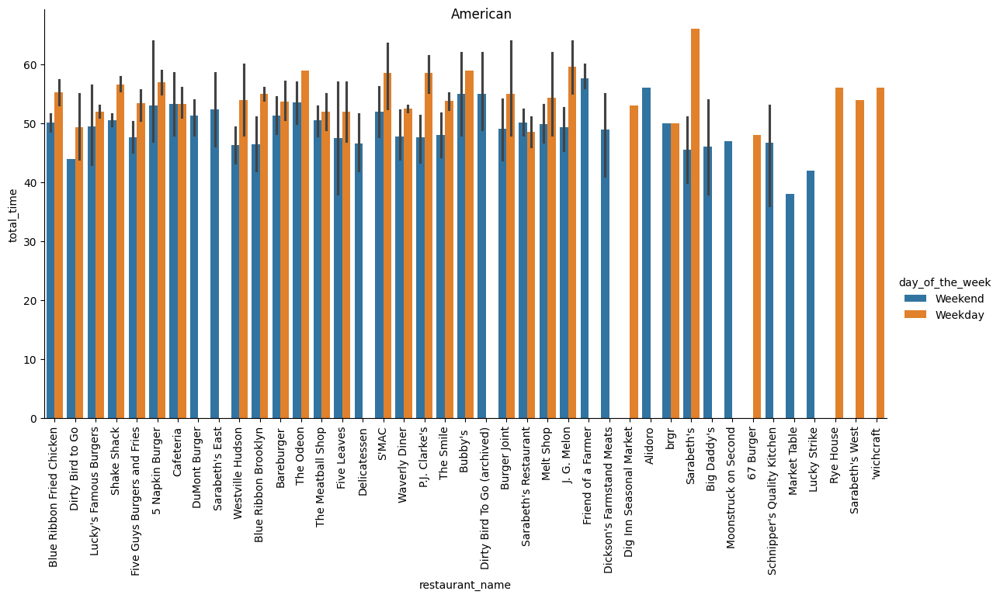

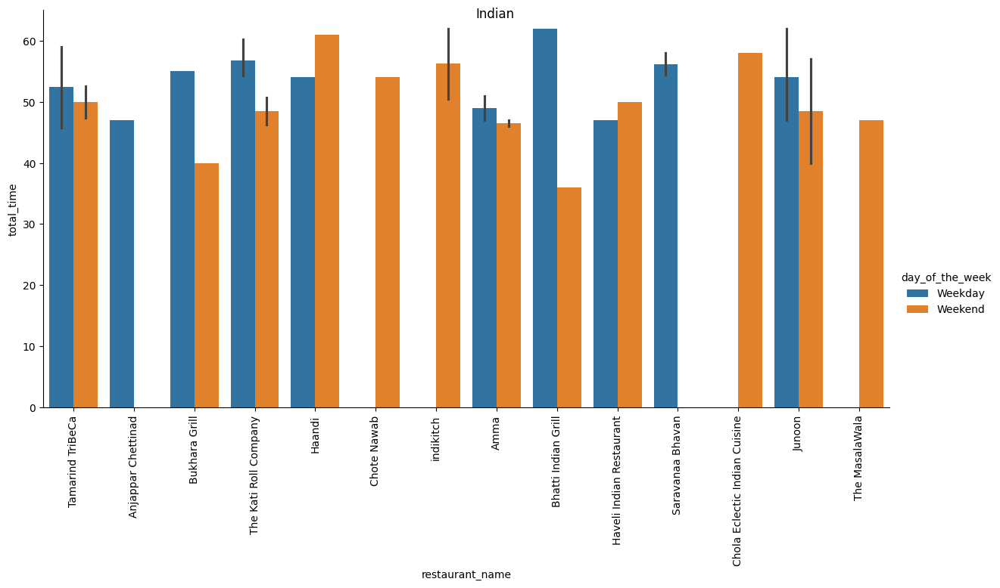

...

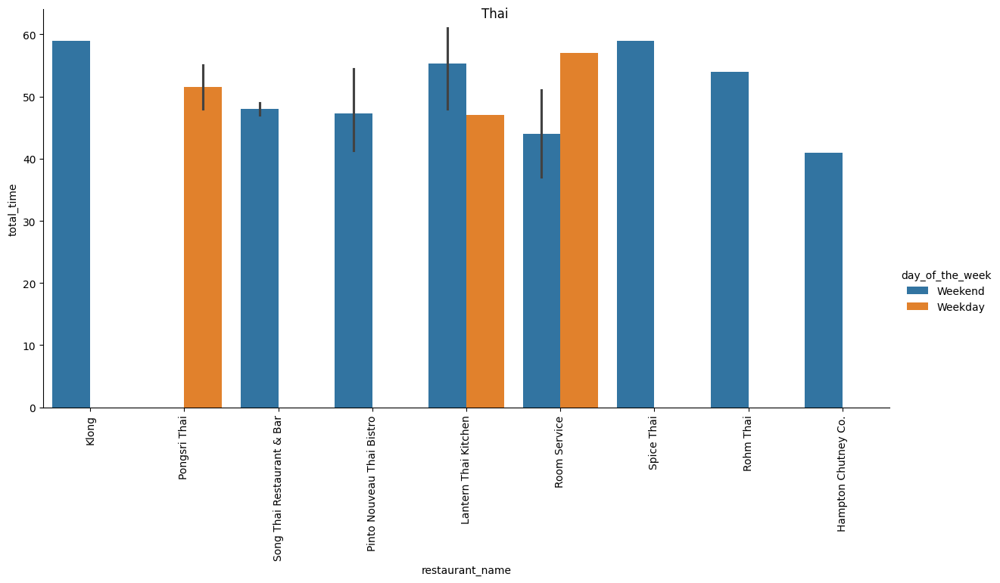

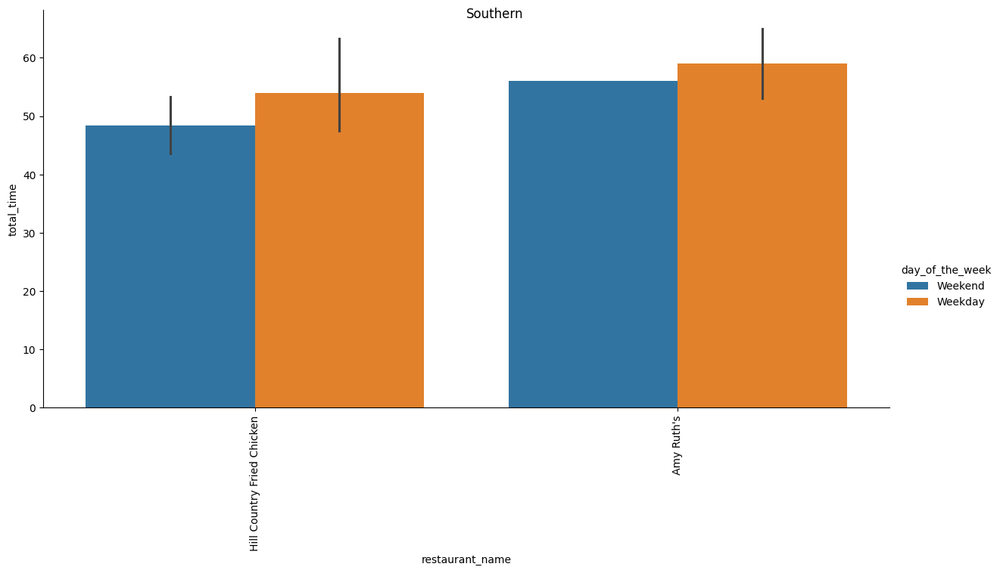

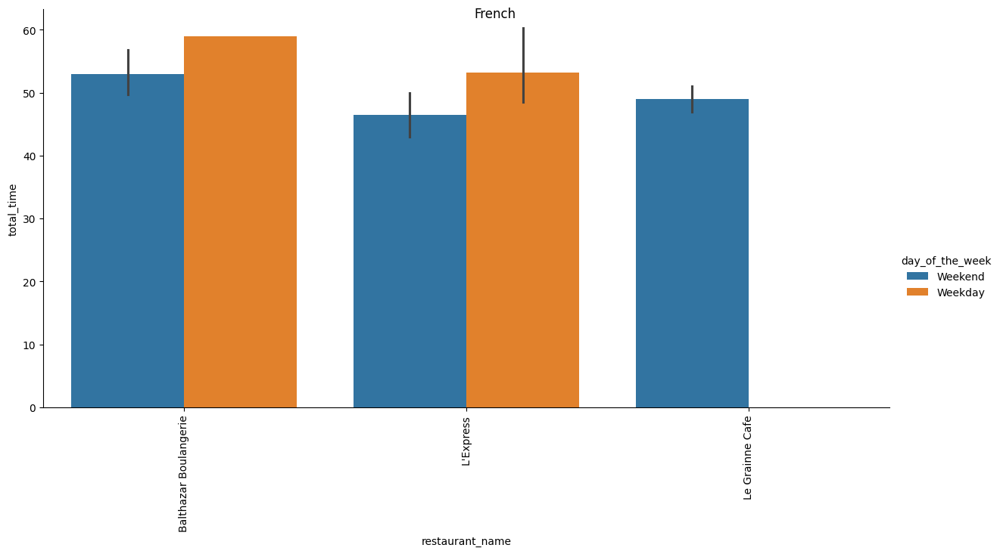

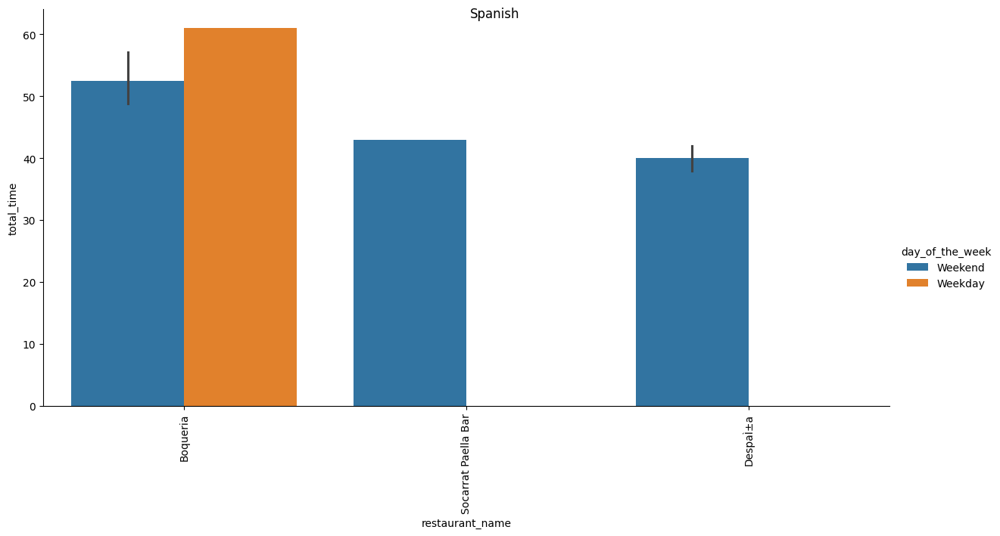

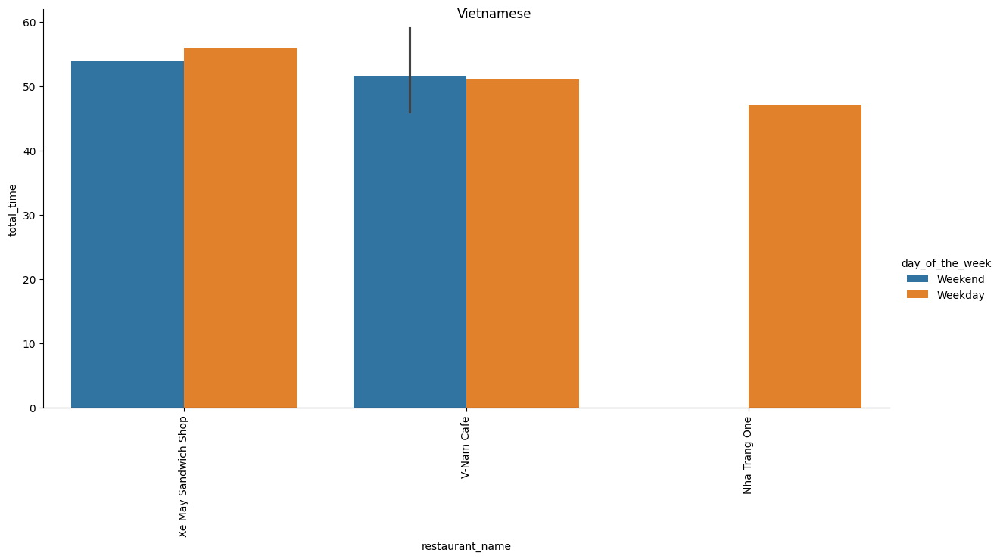

In [222]:
for cuisine in foodhub_df['cuisine_type'].unique():
    g = sns.catplot(data=foodhub_df[foodhub_df['cuisine_type']==cuisine],x='restaurant_name',y='total_time',kind='bar',hue='day_of_the_week', height = 6,aspect=2)
    g.fig.suptitle(cuisine)
    g.set_xticklabels(rotation=90)
    plt.show()

#### Observations:
- Shake Shack -  weekend average total time is around 50 minutes and weekday average total time is around 56 minutes
- The Meatball Shop - weekend average total time is around 50 minutes and weekday average total time is around 55 minutes
- Blue Ribbon Sushi - weekend average total time is around 50 minutes and weekday average total time is around 55 minutes
- Blue Ribbon Fried Chicken - weekend average total time is around 50 minutes and weekday average total time is around 55 minutes
- Parm -  weekend average total time is around 50 minutes and weekday average total time is around 56 minutes

**Food preparation time across cuisine type on weekdays and weekends**

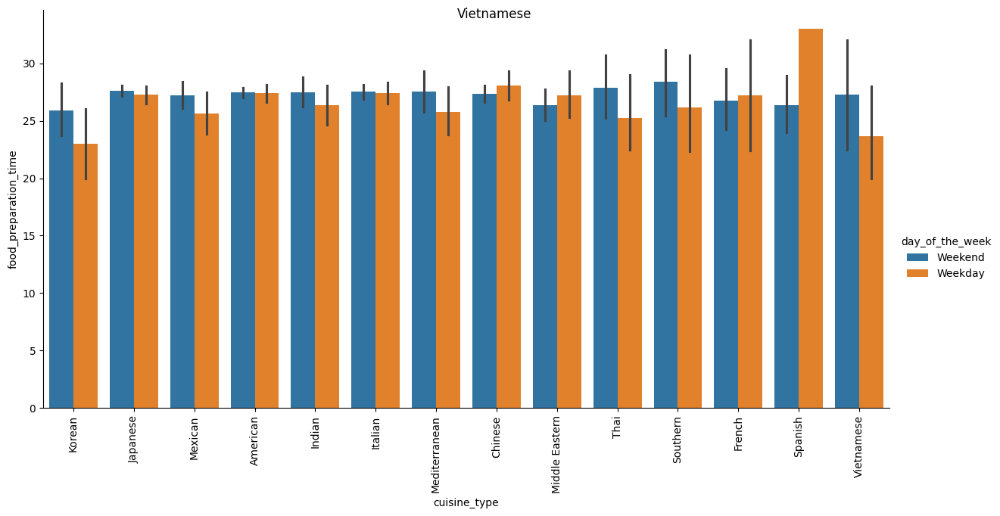

In [223]:

g= sns.catplot(y='food_preparation_time', x='cuisine_type', data=foodhub_df,kind="bar",hue='day_of_the_week',height=6,aspect=2)
g.fig.suptitle(cuisine)
g.set_xticklabels(rotation=90)
plt.show()

#### Observations:
- The lowest weekend average food preparation time is around  25 minutes in Korean cuisine
- The lowest weekday average food preparation time is around 24 minutes in Korean cuisine
- The highest weekend average food preparation time is around  28 minutes in  Southern cuisine
- The highest weekday average food preparation time is around 33 minutes in  Spanish cuisine

**Food preparation time across restaurants by cuisine type on weekdays and weekends**

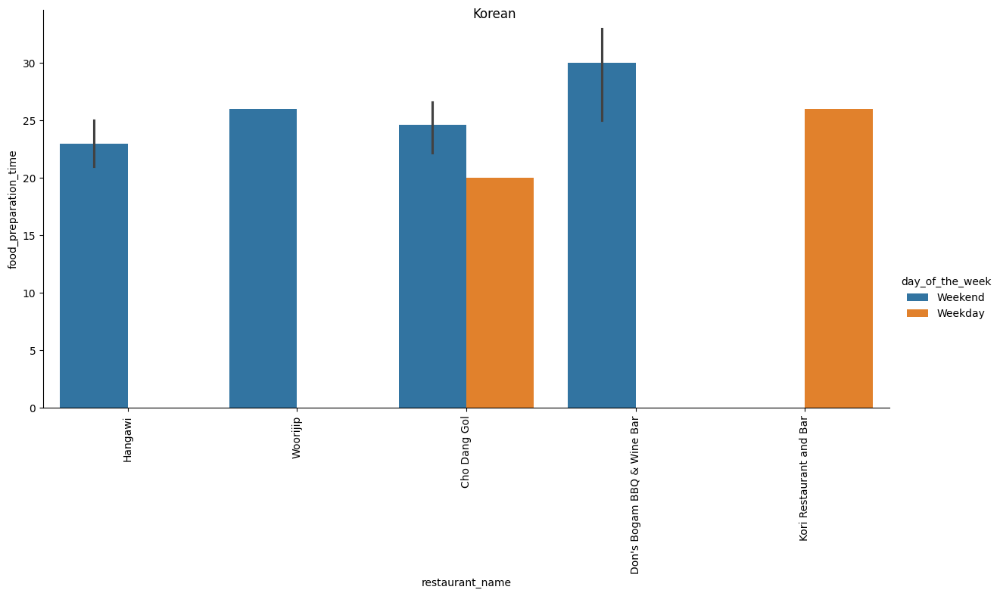

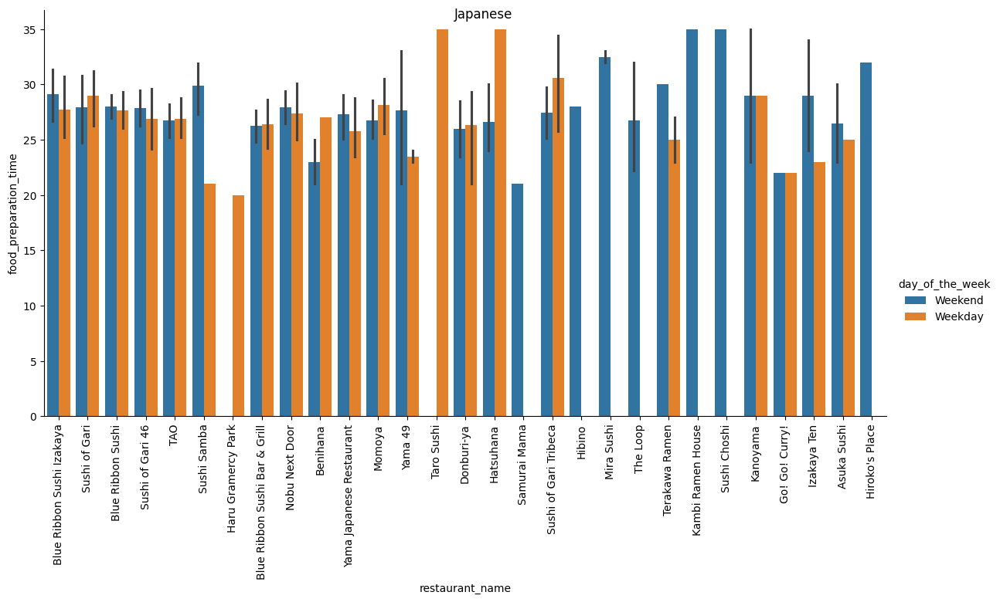

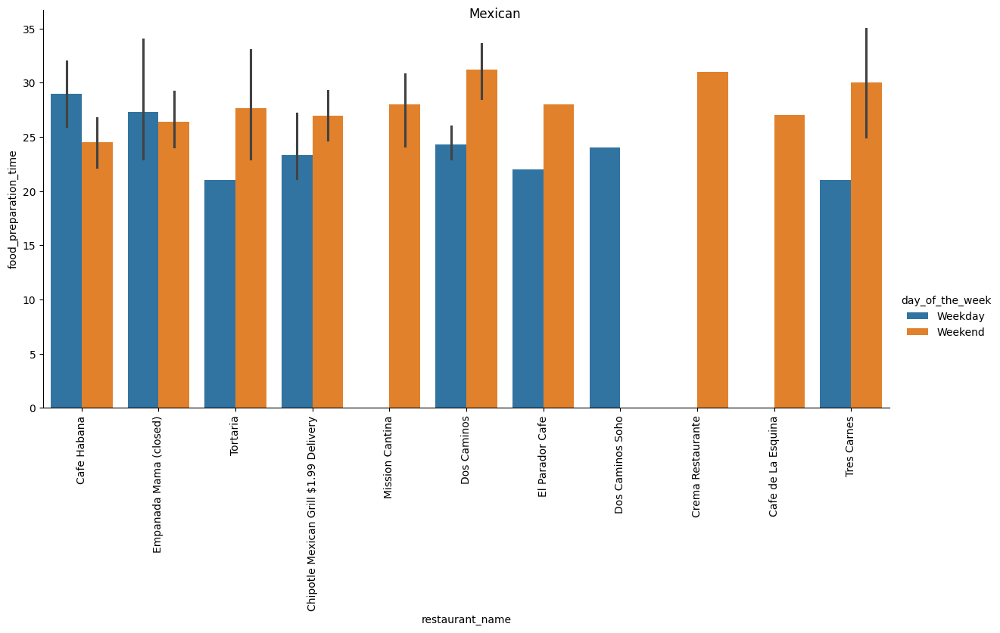

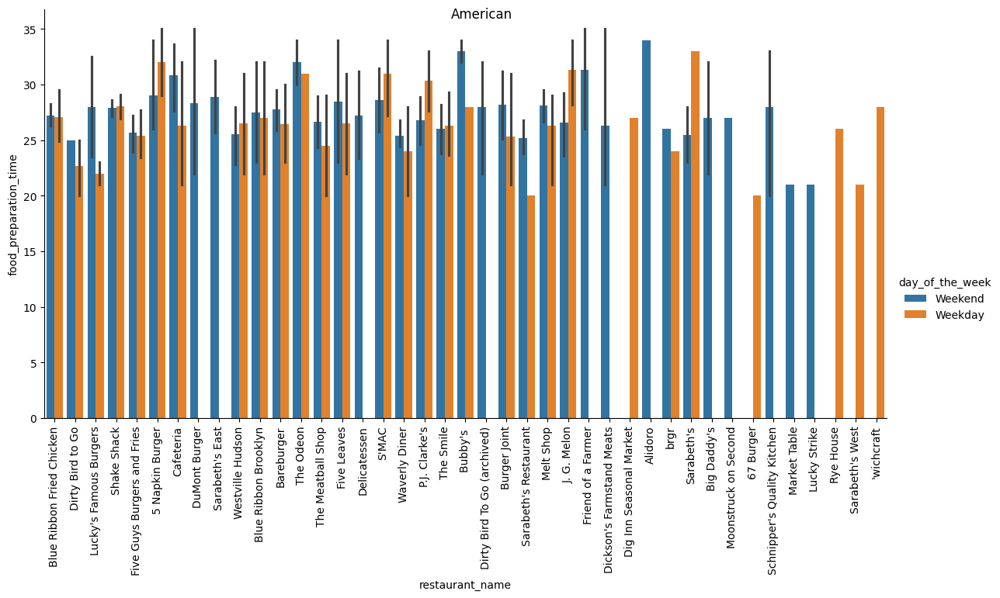

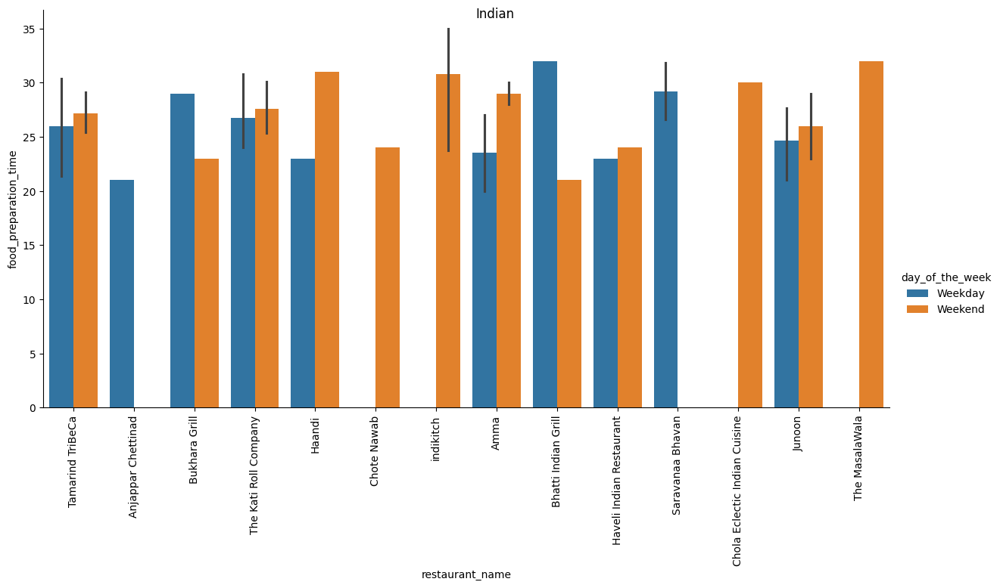

...

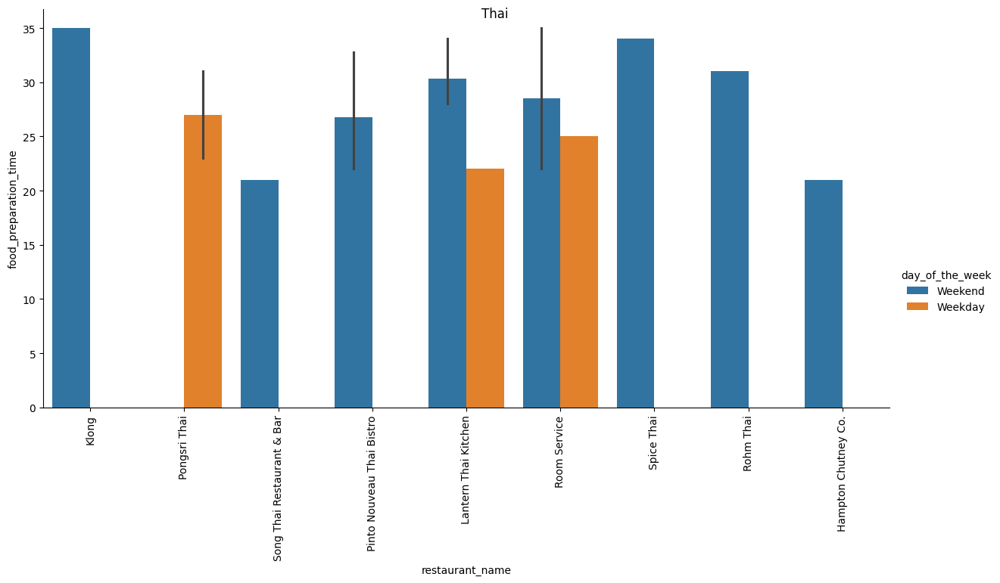

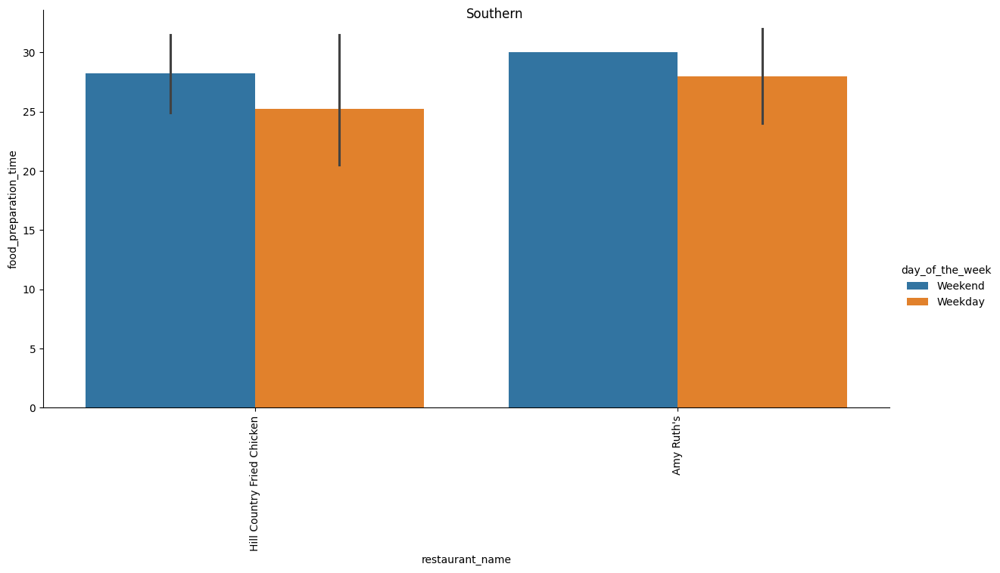

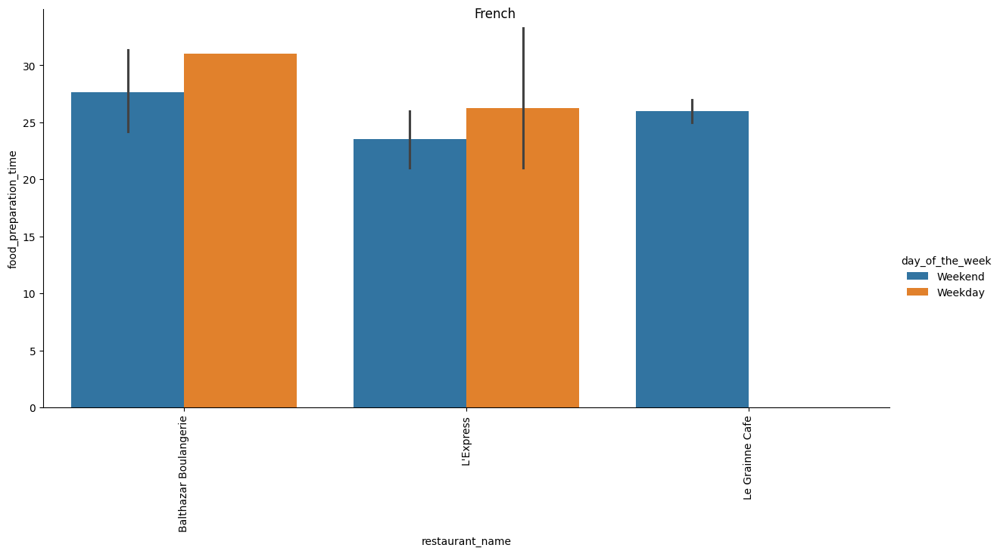

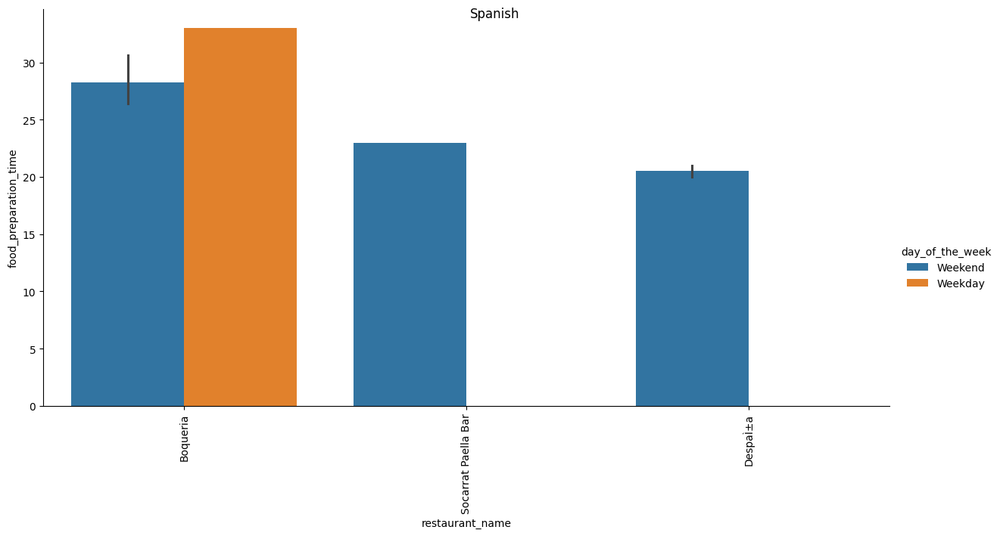

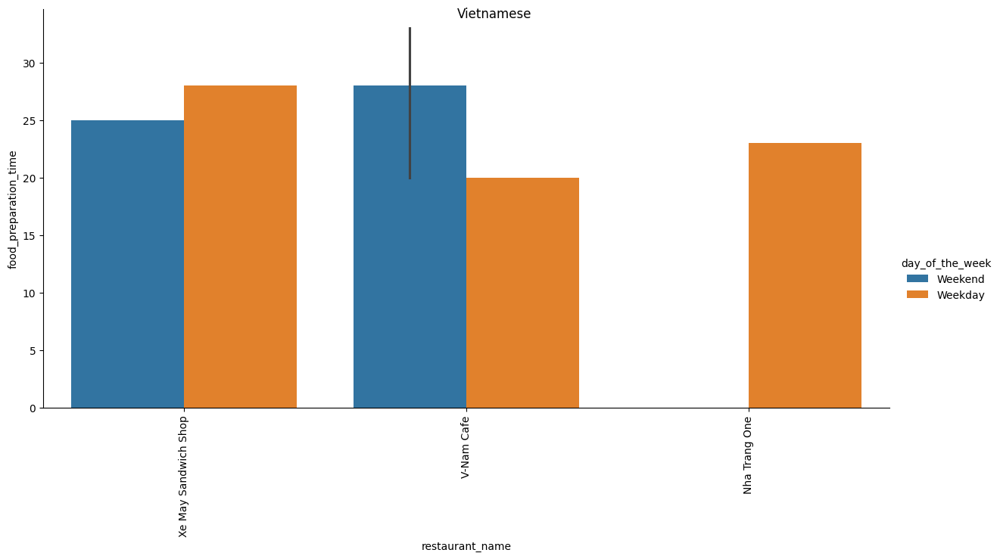

In [224]:
for cuisine in foodhub_df['cuisine_type'].unique():
    g = sns.catplot(data=foodhub_df[foodhub_df['cuisine_type']==cuisine],x='restaurant_name',y='food_preparation_time',kind='bar',hue='day_of_the_week', height = 6,aspect=2)
    g.fig.suptitle(cuisine)
    g.set_xticklabels(rotation=90)
    plt.show()

#### Observations on top 5 popular restaurants :
- Shake Shack -  weekend average food preparation  time is around 28 minutes and weekday average food preparation time is around 28 minutes
- The Meatball Shop - weekend average food preparation time is around 27 minutes and weekday average food preparation time is around 25 minutes
- Blue Ribbon Sushi - weekend average food preparation time is around  28 minutes and weekday average food preparation time is around 28 minutes
- Blue Ribbon Fried Chicken - weekend average food preparation time is around 27 minutes and weekday average food preparation time is 27 around minutes
- Parm -  weekend average food preparation time is around 27 minutes and weekday average food preparation time is around 27 minutes

**delivery time across cuisine
type on weekdays and weekends**

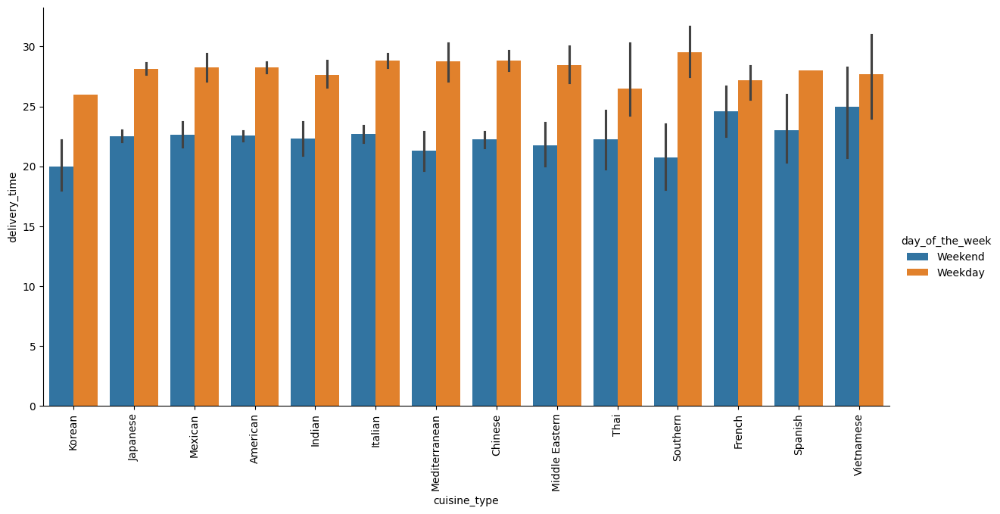

In [225]:
g= sns.catplot(y='delivery_time', x='cuisine_type', data=foodhub_df,kind="bar",hue='day_of_the_week',height=6,aspect=2)
g.set_xticklabels(rotation=90)
plt.show()

#### Observations:
- The weekend delivery time is lower than weekday delivery time across all cuisines.
- The lowest weekend average delivery time is around  20 minutes in Korean cuisine
- The lowest weekday average delivery time is around 26 minutes in Korean cuisine
- The highest weekend average delivery time is around  24 minutes in  Vietnamese cuisine
- The highest weekday average delivery time is around 29 minutes in  southern cuisine

**delivery time across restaurants by cuisine
type on weekdays and weekends**

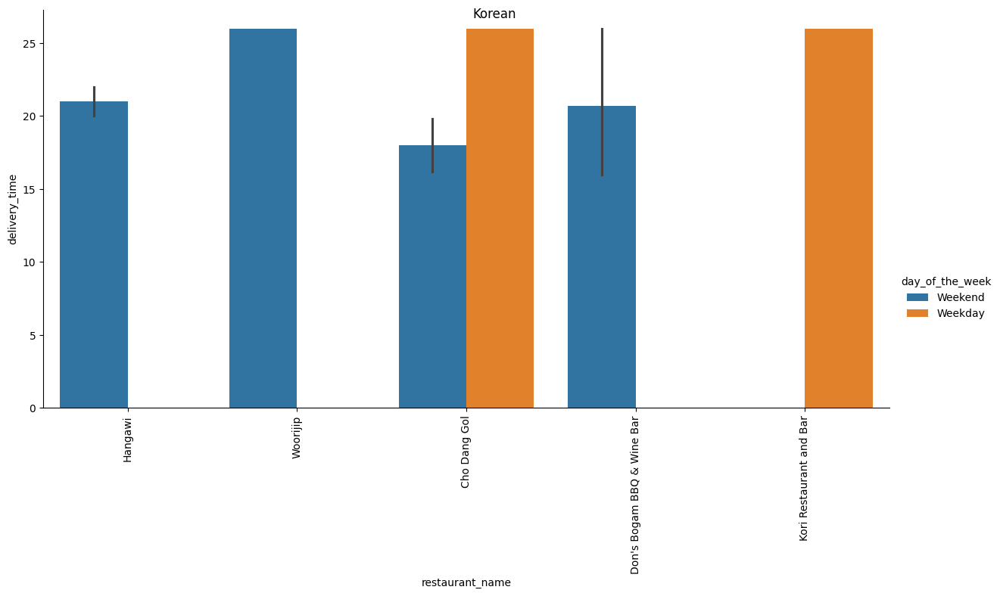

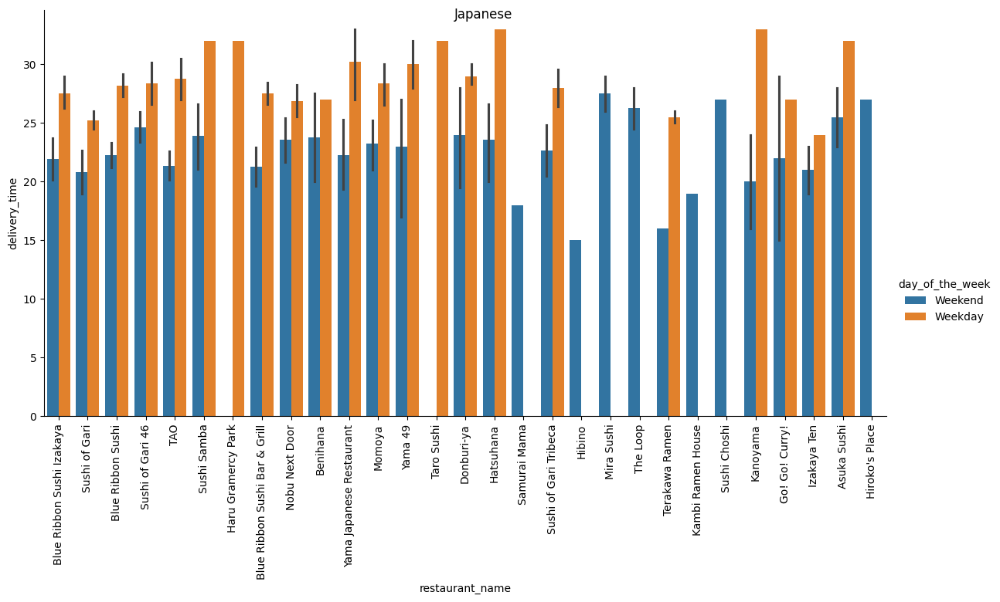

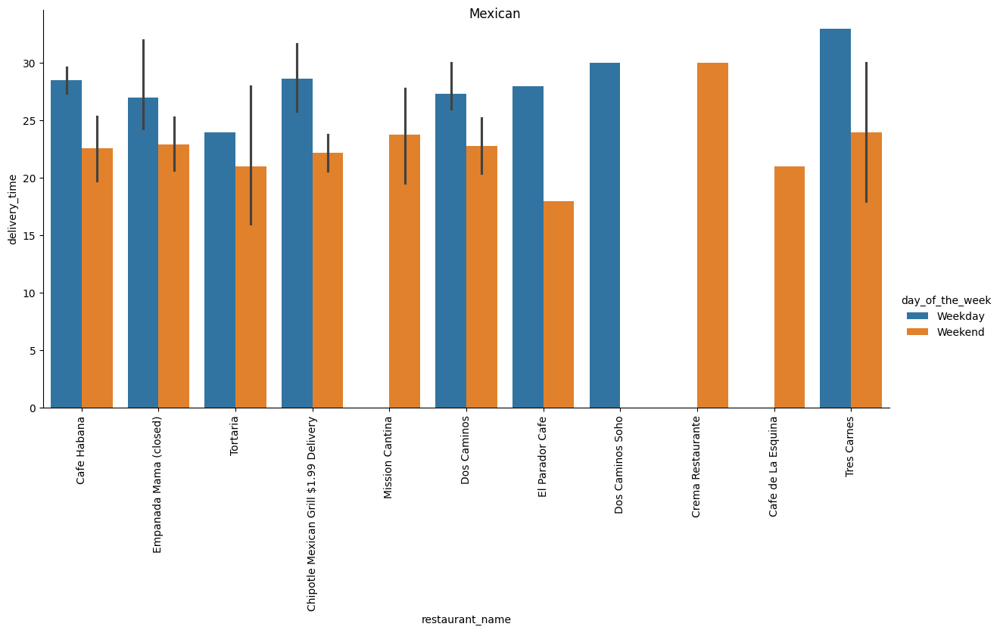

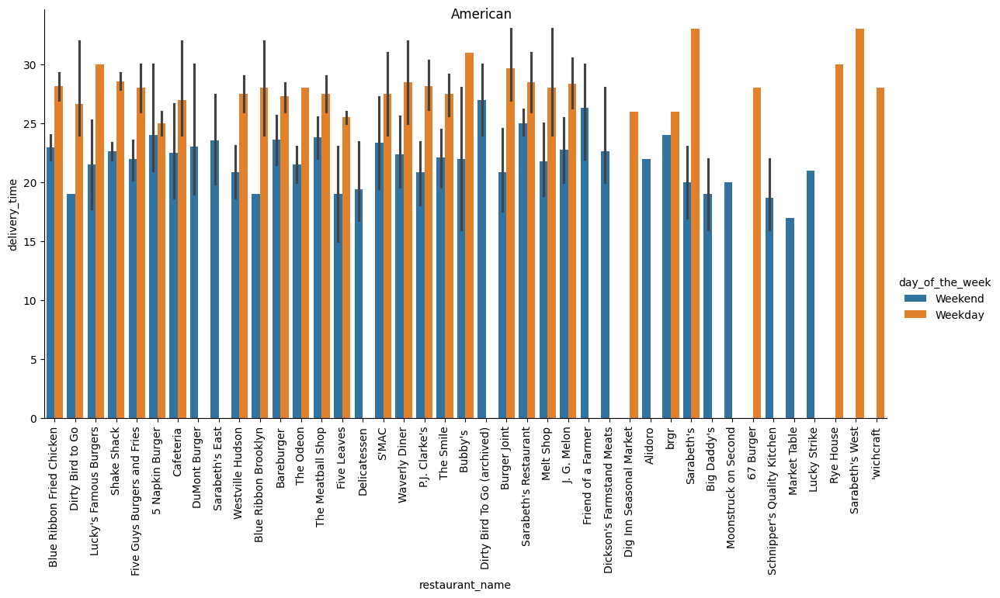

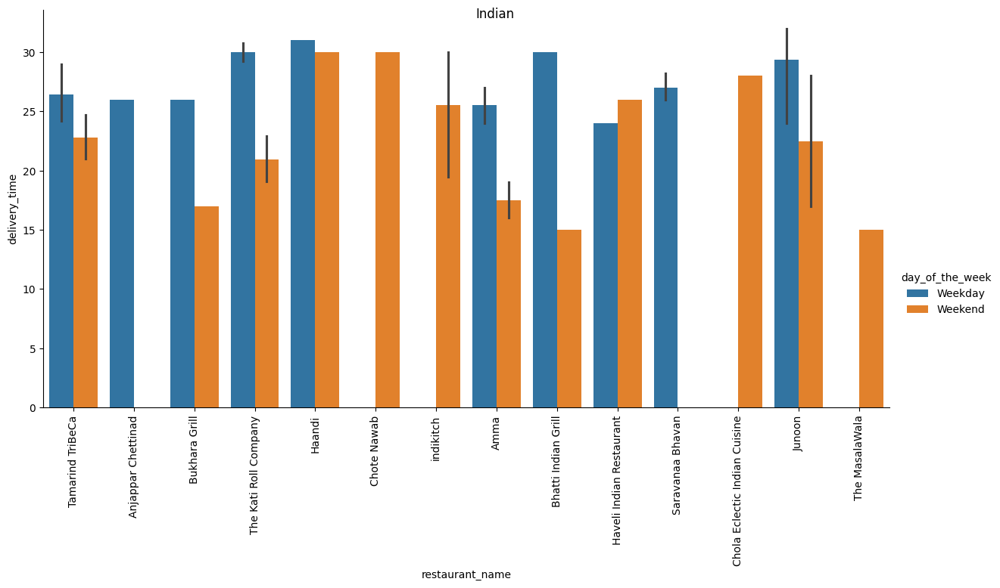

...

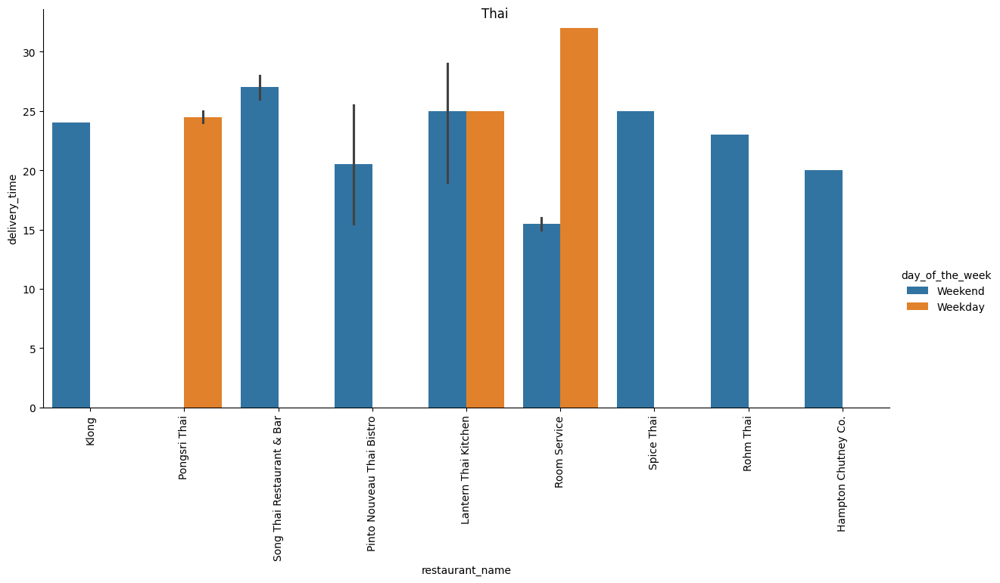

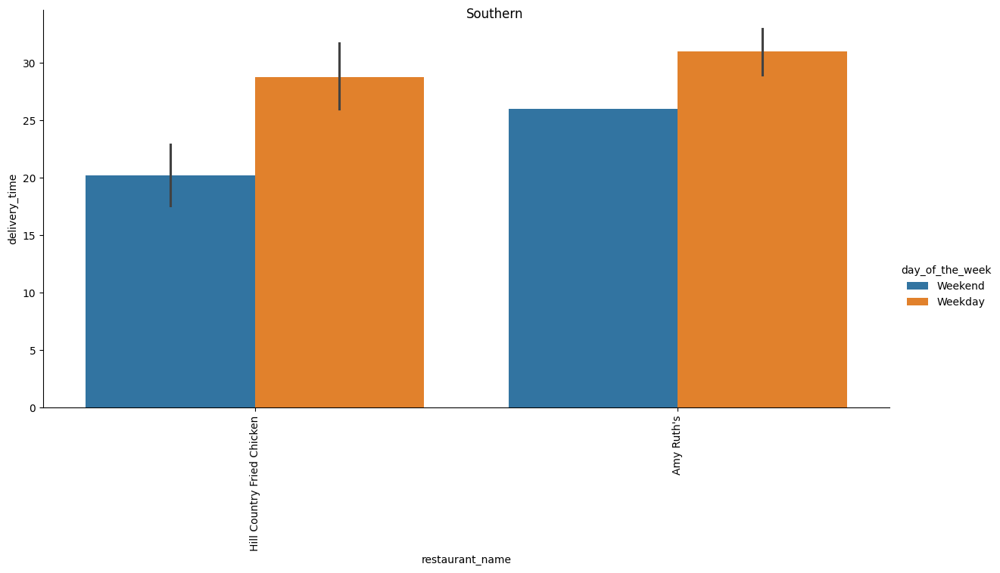

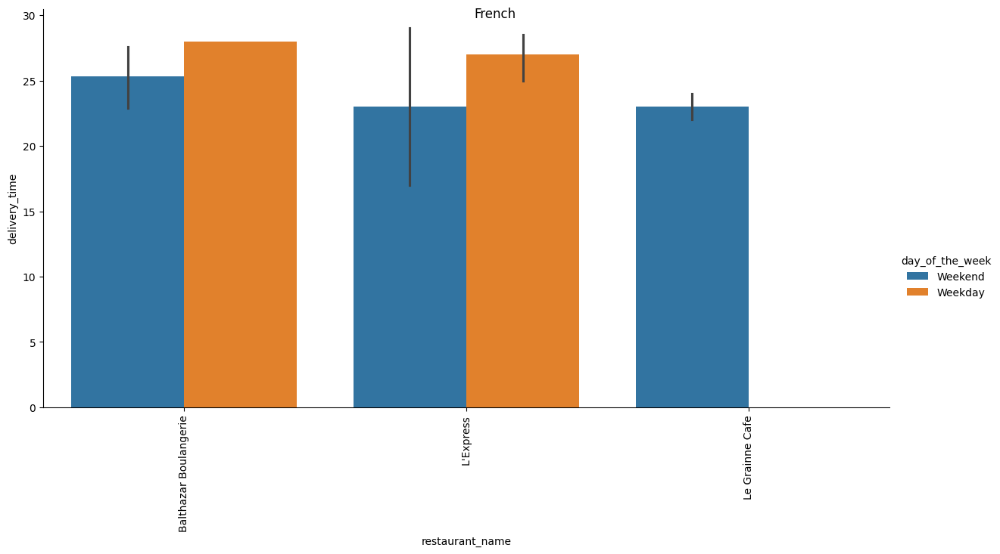

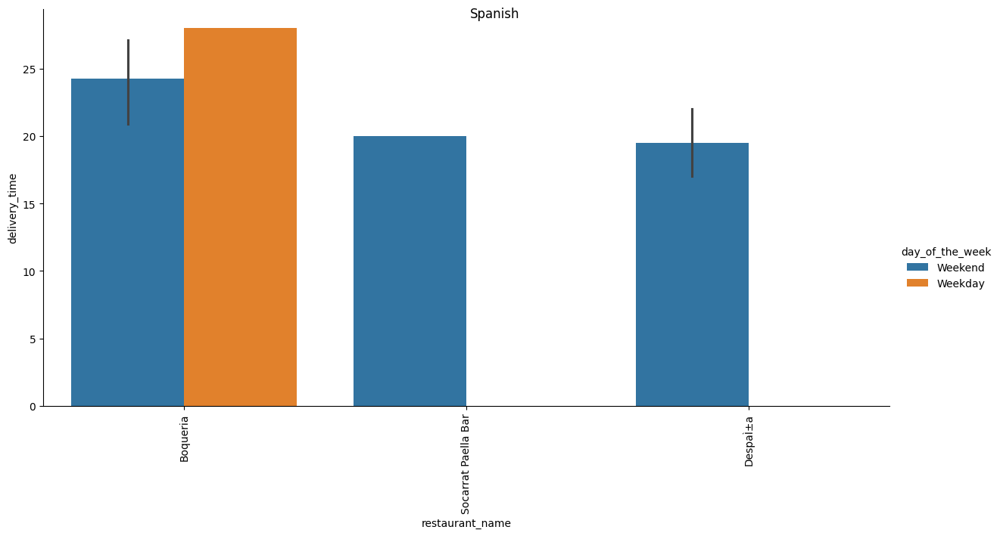

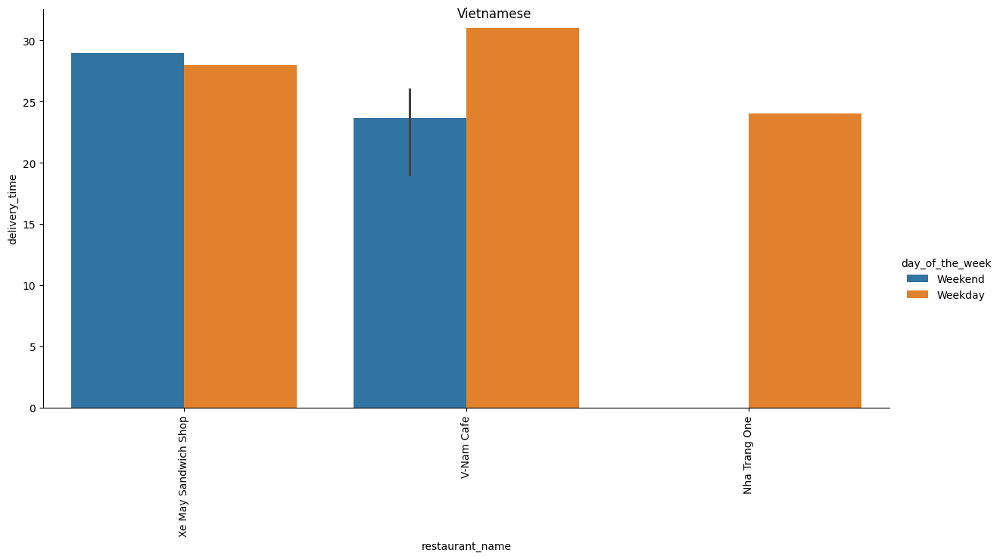

In [226]:
for cuisine in foodhub_df['cuisine_type'].unique():
    g = sns.catplot(data=foodhub_df[foodhub_df['cuisine_type']==cuisine],x='restaurant_name',y='delivery_time',kind='bar',hue='day_of_the_week', height = 6,aspect=2)
    g.fig.suptitle(cuisine)
    g.set_xticklabels(rotation=90)
    plt.show()

#### Observations on top 5 popular restaurants :
- Shake Shack -  weekend average delivery time is around 23.5 minutes and weekday average delivery time is around 30 minutes
- The Meatball Shop - weekend average delivery time is around 24 minutes and weekday average delivery time is around 28 minutes
- Blue Ribbon Sushi - weekend average delivery time is around  22.5 minutes and weekday average delivery time is around 28 minutes
- Blue Ribbon Fried Chicken - weekend average delivery time is around 23.5 minutes and weekday average delivery time is around 28.5 minutes
- Parm -  weekend average delivery time is around 24 minutes and weekday average delivery time is around 29 minutes


**Cost of the order across cuisine type**




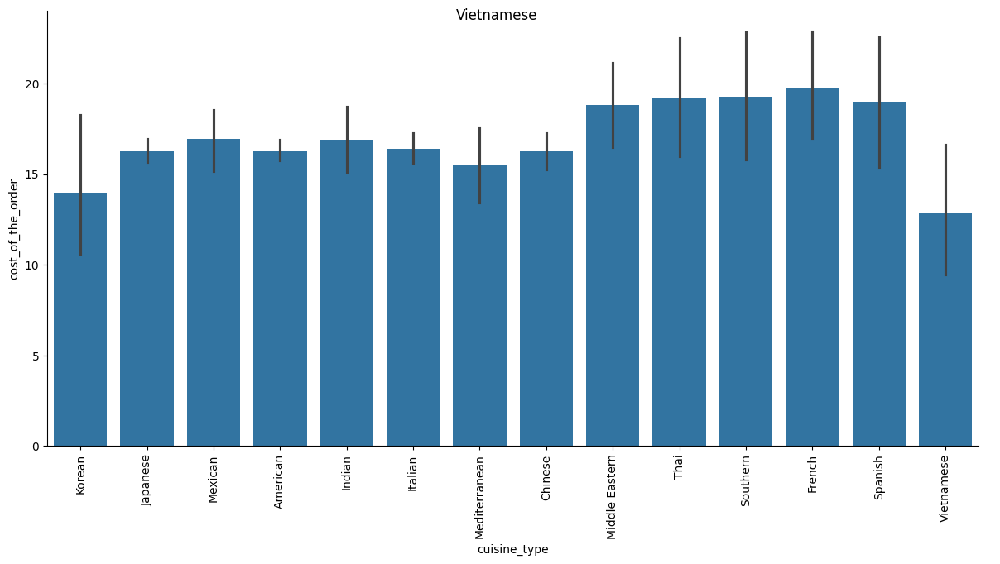

In [227]:

g= sns.catplot(y='cost_of_the_order', x='cuisine_type', data=foodhub_df,kind="bar",height=6,aspect=2)
g.fig.suptitle(cuisine)
g.set_xticklabels(rotation=90)
plt.show()

#### Observations:
- The least average cost of the order is around 12.5 dollars in Vietnamese cuisine
- The highest average cost of the order is around 19 dollars in French cuisine

Popular Cuisines :
  - American  - 17 dollars average order cost
  - Japanese - 17 dollars average order cost
  - Italian - 17 dollars average order cost
  - Chinese  - 17 dollars average order cost

**Cost of the order across restaurants by cuisine type**

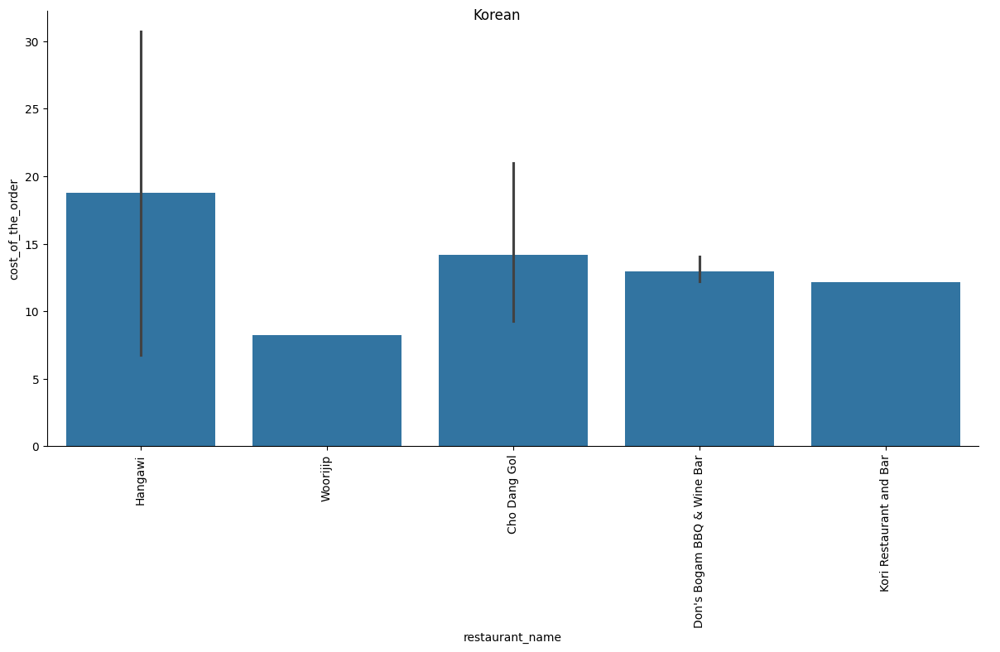

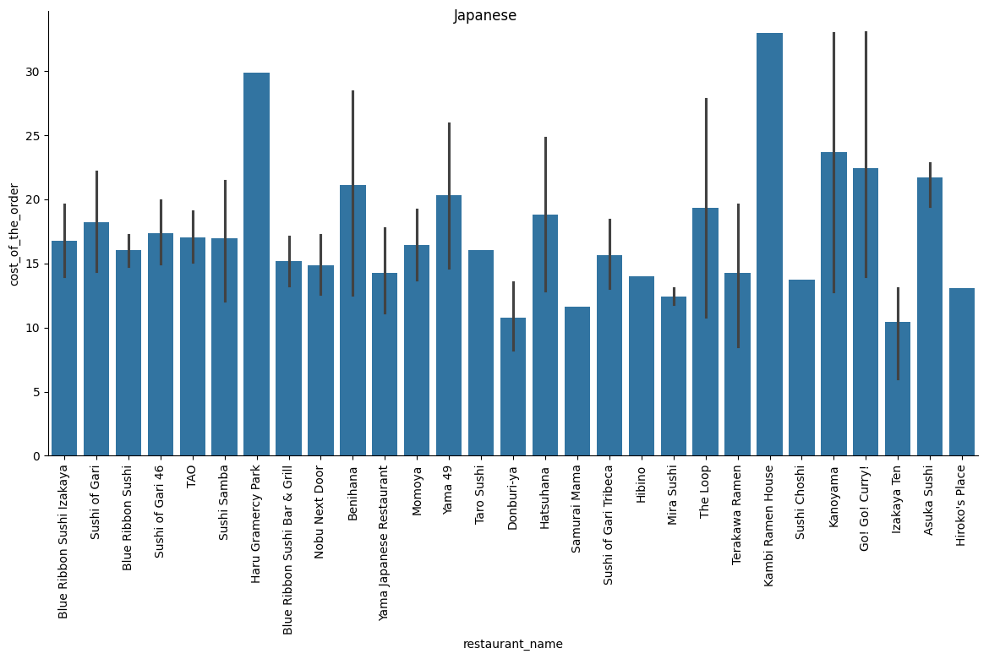

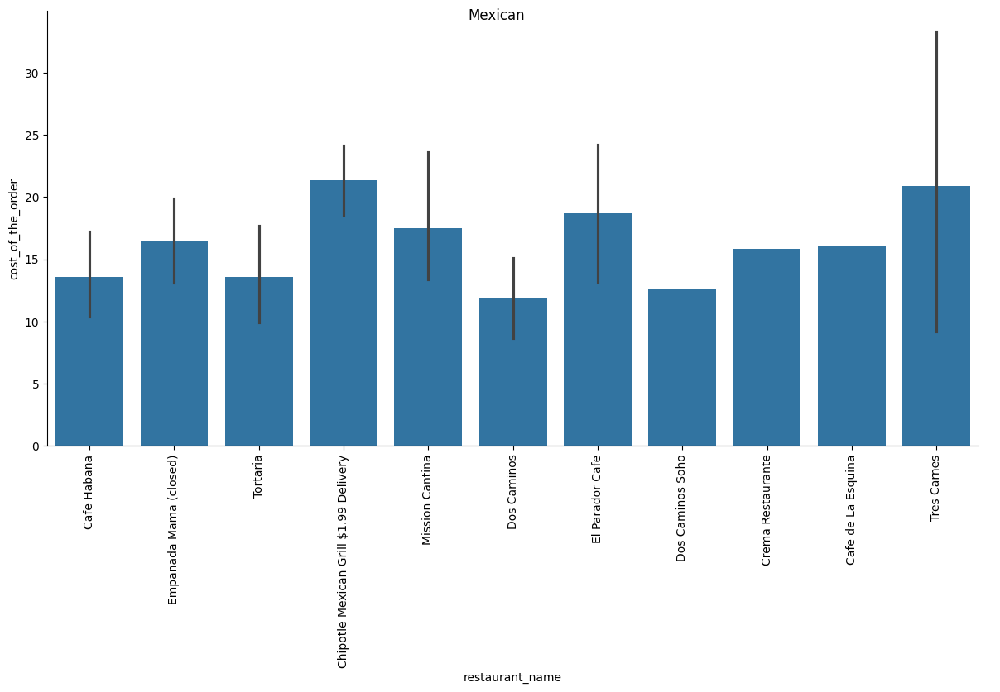

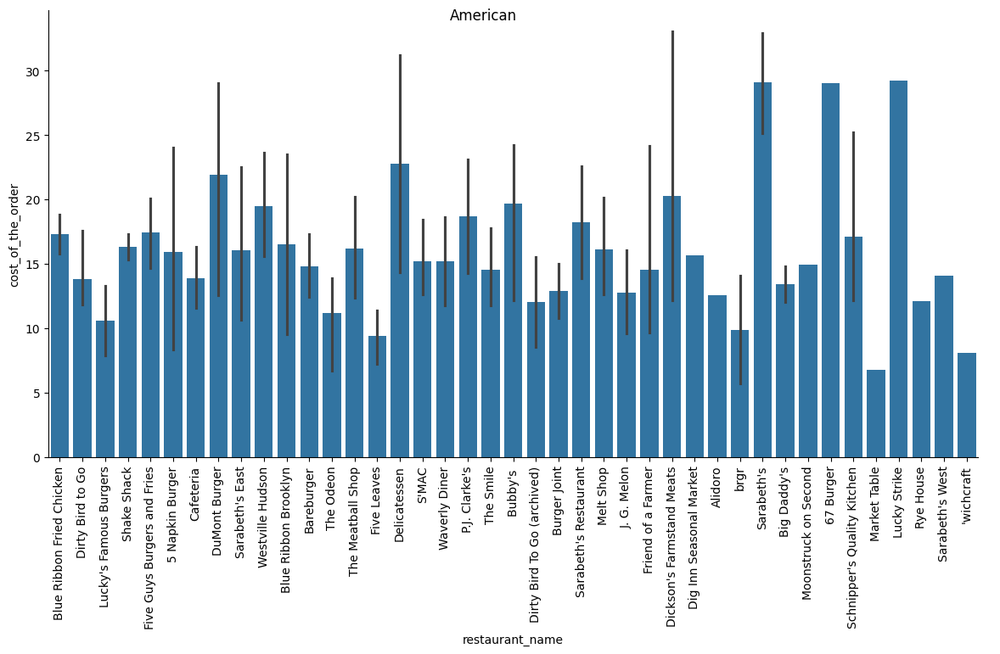

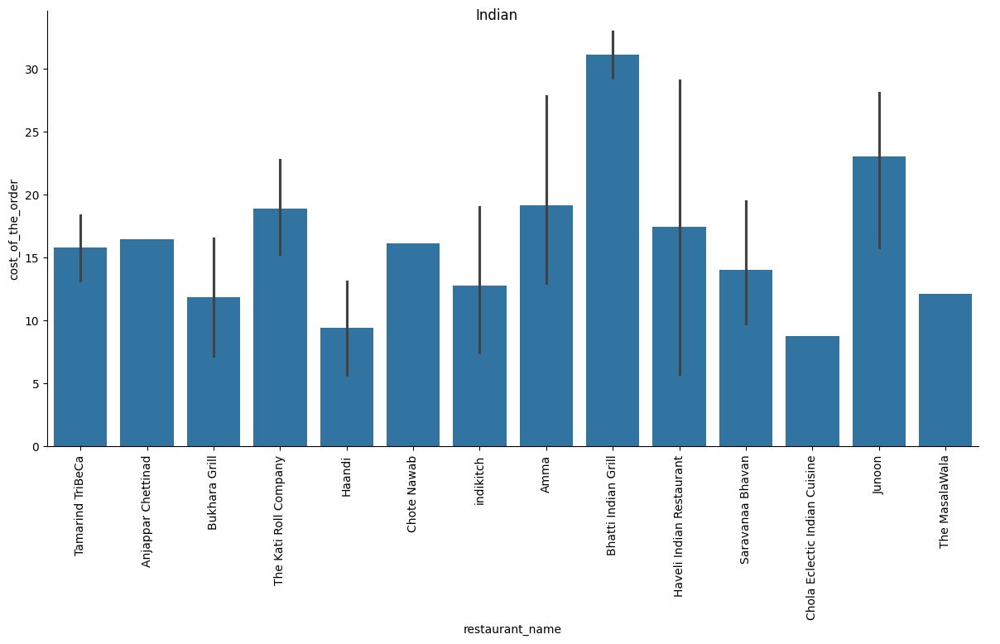

...

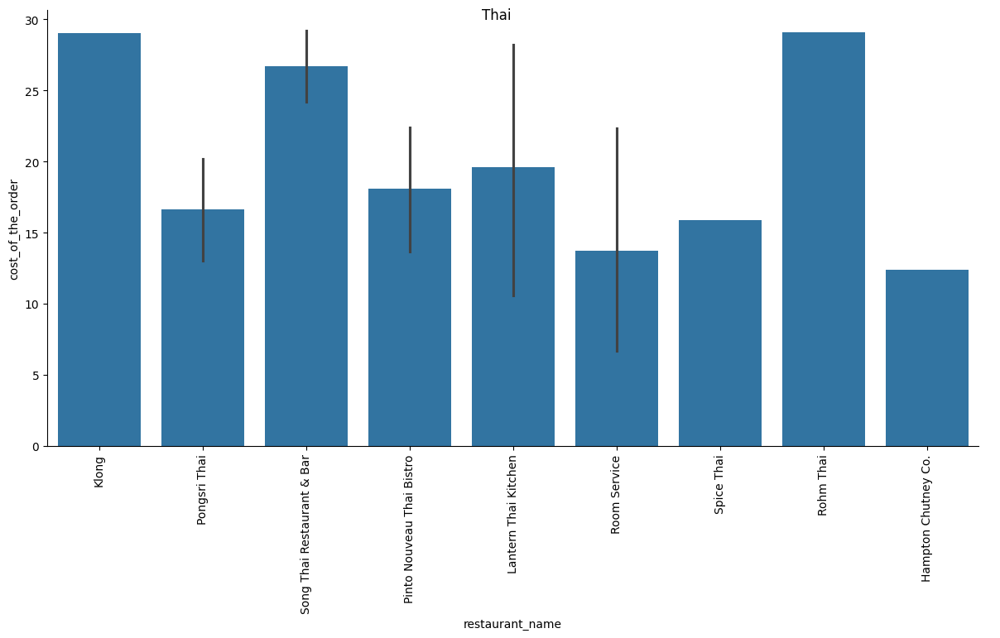

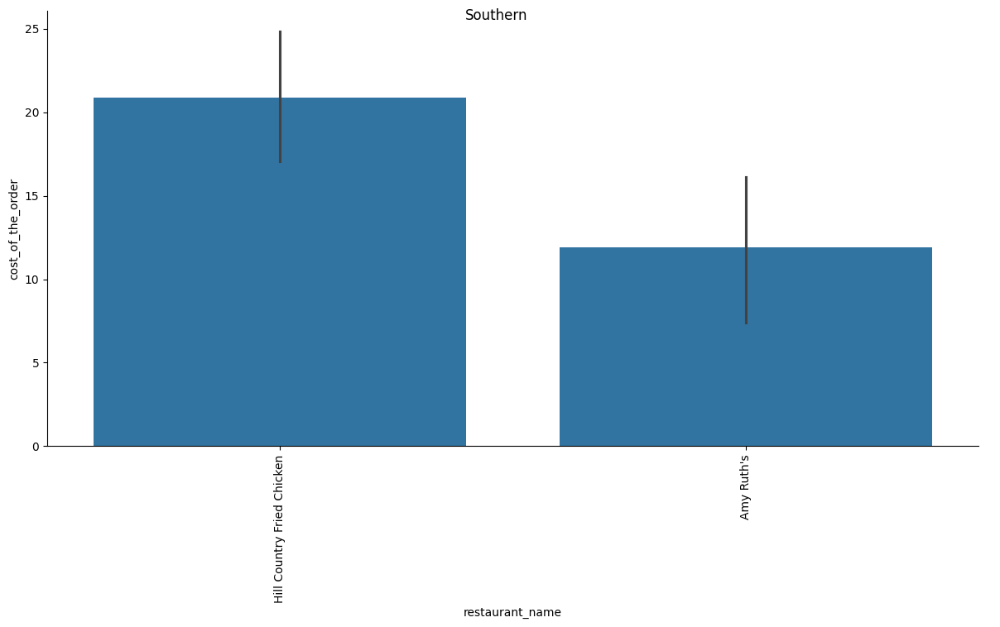

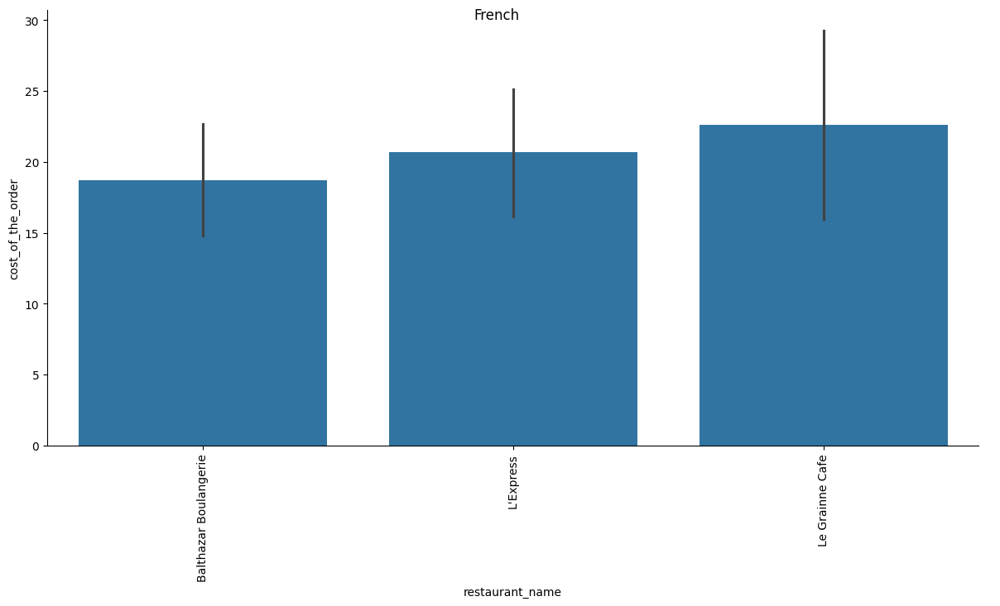

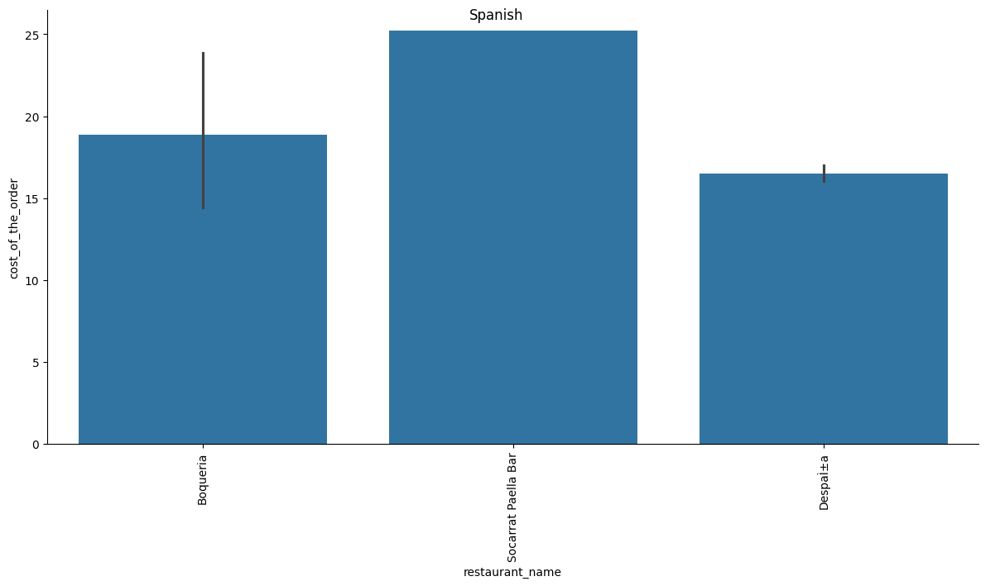

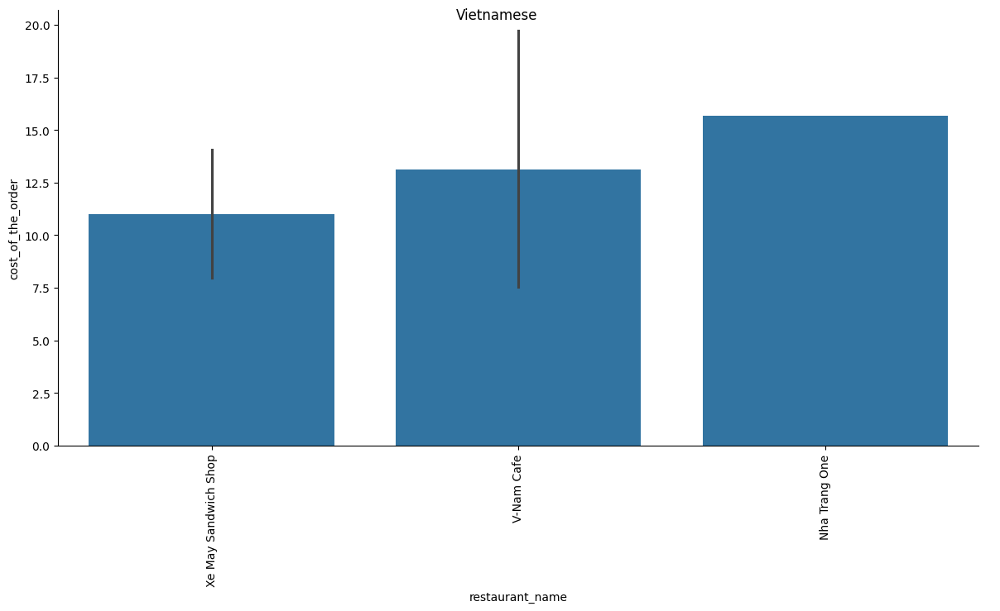

In [228]:
for cuisine in foodhub_df['cuisine_type'].unique():
    g = sns.catplot(data=foodhub_df[foodhub_df['cuisine_type']==cuisine],x='restaurant_name',y='cost_of_the_order',kind='bar', height = 6,aspect=2)
    g.fig.suptitle(cuisine)
    g.set_xticklabels(rotation=90)
    plt.show()

#### Observations on top 5 popular restaurants :
- Shake Shack -  average cost of the order  is around 16.5 dollars
- The Meatball Shop - average cost of the order  is around 16.5 dollars
- Blue Ribbon Sushi - average cost of the order  is around 16 dollars
- Blue Ribbon Fried Chicken - average cost of the order  is around 17 dollars
- Parm -  average cost of the order  is around 16 dollars

**ratings across cuisine type**

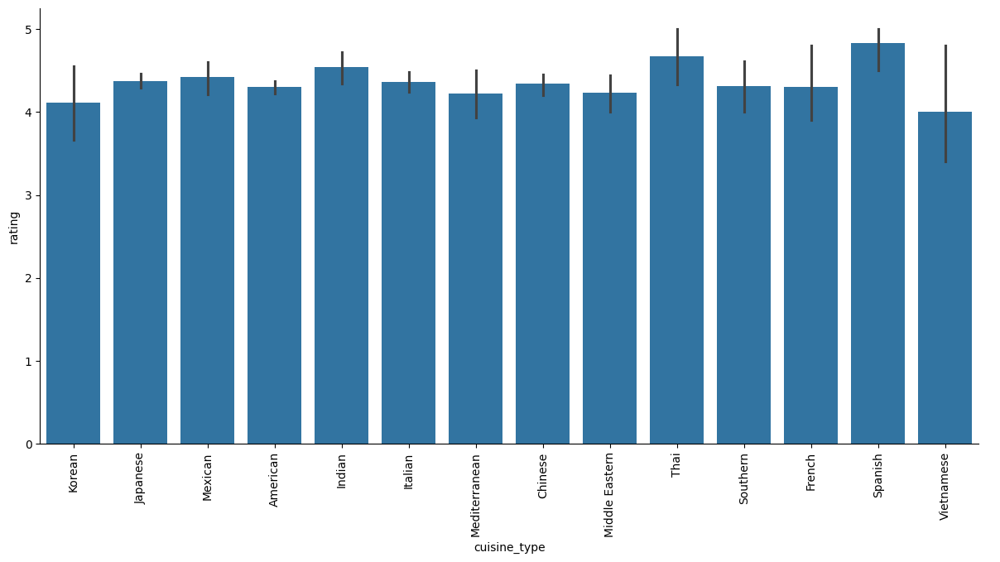

In [229]:

g= sns.catplot(y='rating', x='cuisine_type', data=foodhub_df,kind="bar",height=6,aspect=2)
g.set_xticklabels(rotation=90)
plt.show()

#### Observations:
- The least average rating is around 4  in Vietnamese cuisine
- The highest average rating  is  around 4.5 in Spanish cuisine

Popular Cuisines :
  - American  -  average rating is around 4.4
  - Japanese - average rating is around 4.4
  - Italian - average rating is around 4.5
  - Chinese  -average rating is around 4.5

**Lets get the stats**

In [230]:
#get the rating count across cuisine types
foodhub_df.groupby('cuisine_type')['rating'].sum()

,rating
cuisine_type,
American,1582.0
Chinese,577.0
French,43.0
Indian,227.0
Italian,750.0
Japanese,1194.0
Korean,37.0
Mediterranean,135.0
Mexican,212.0


#### Observations:
- Highest rating count is American cuisine followed by Japanese,Italian and Chinese.

**ratings across restaurants by cuisine type**

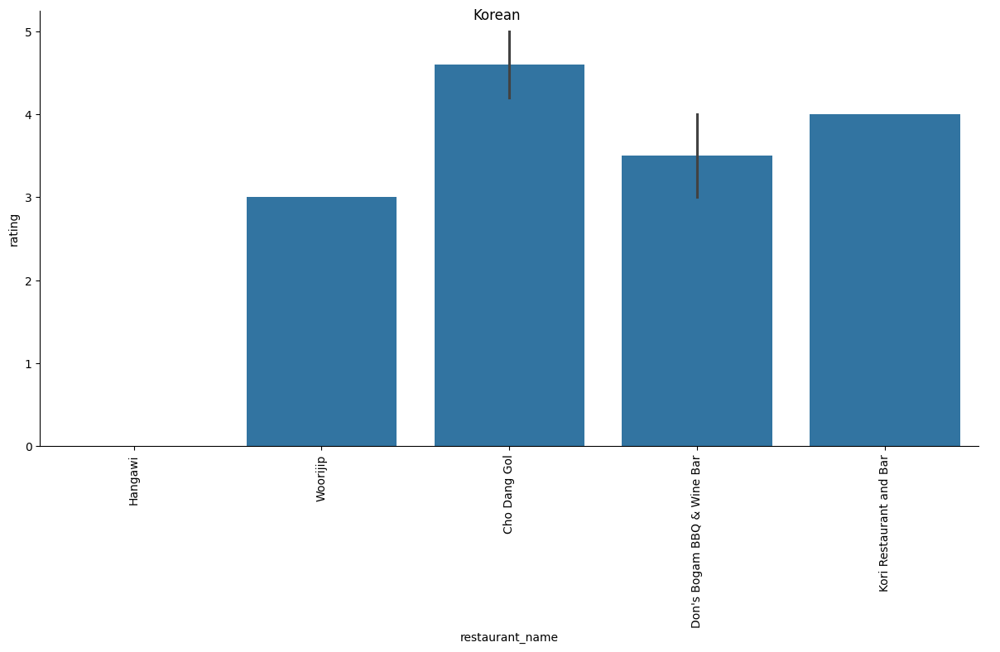

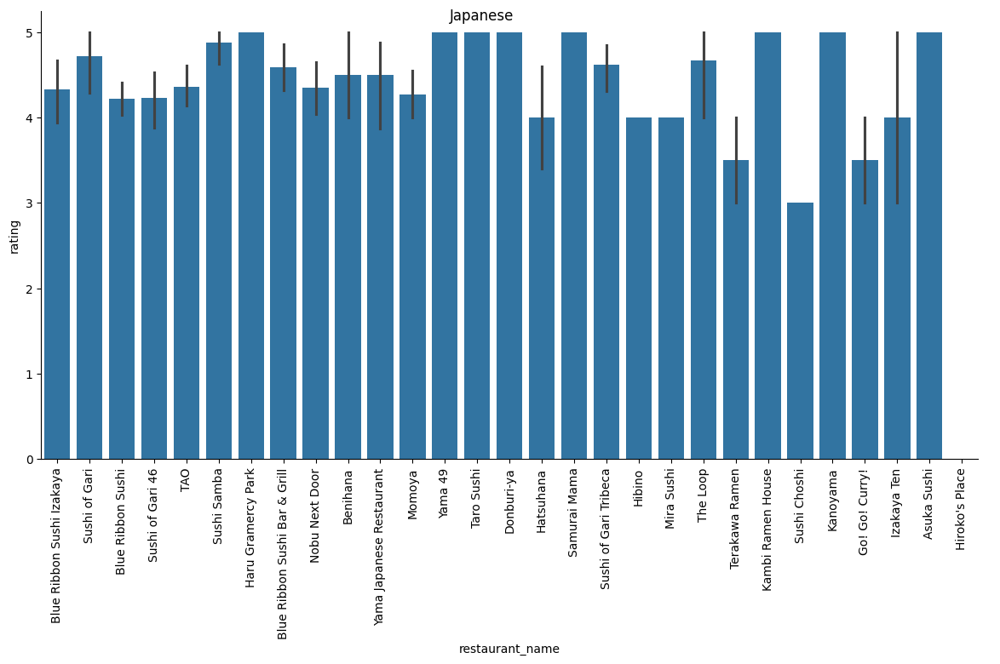

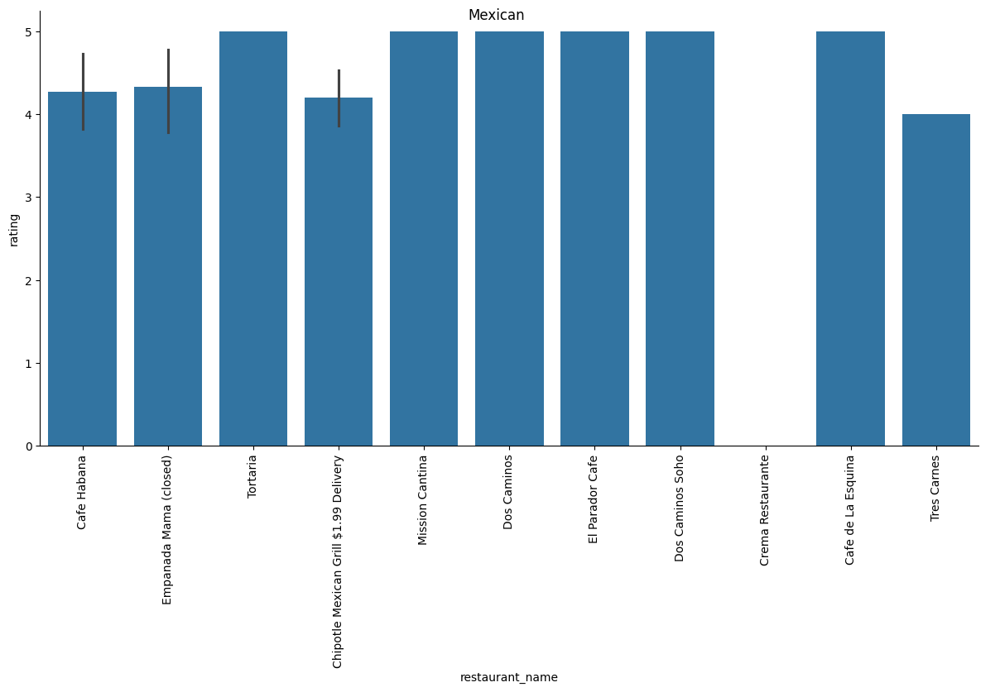

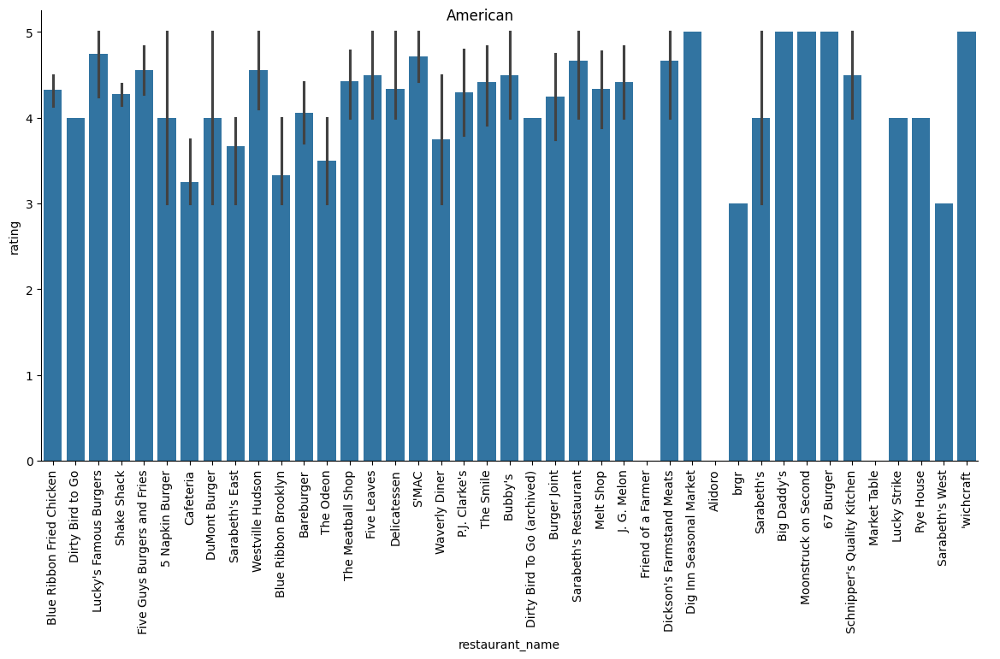

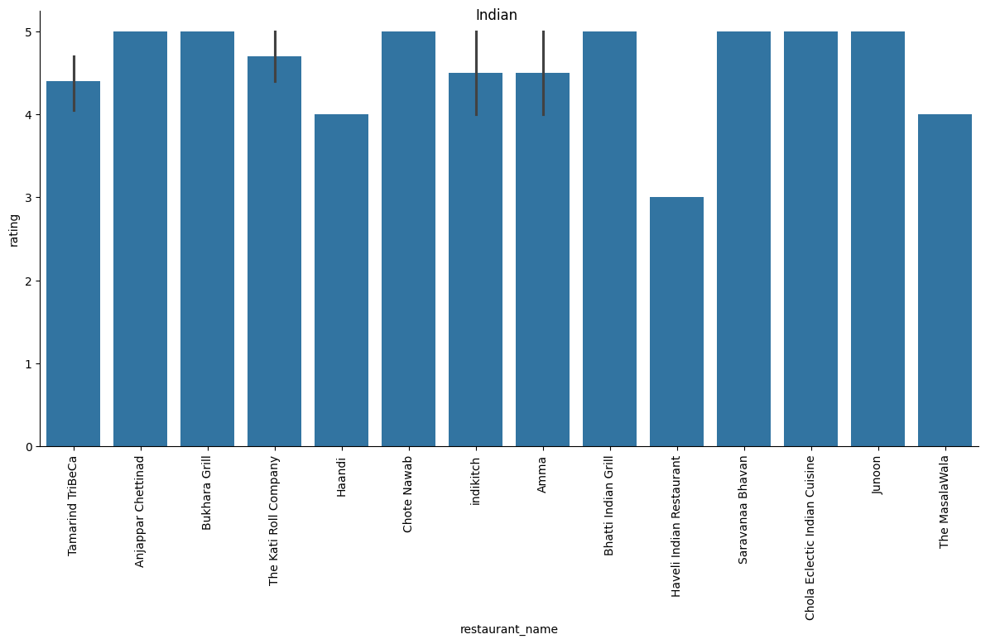

...

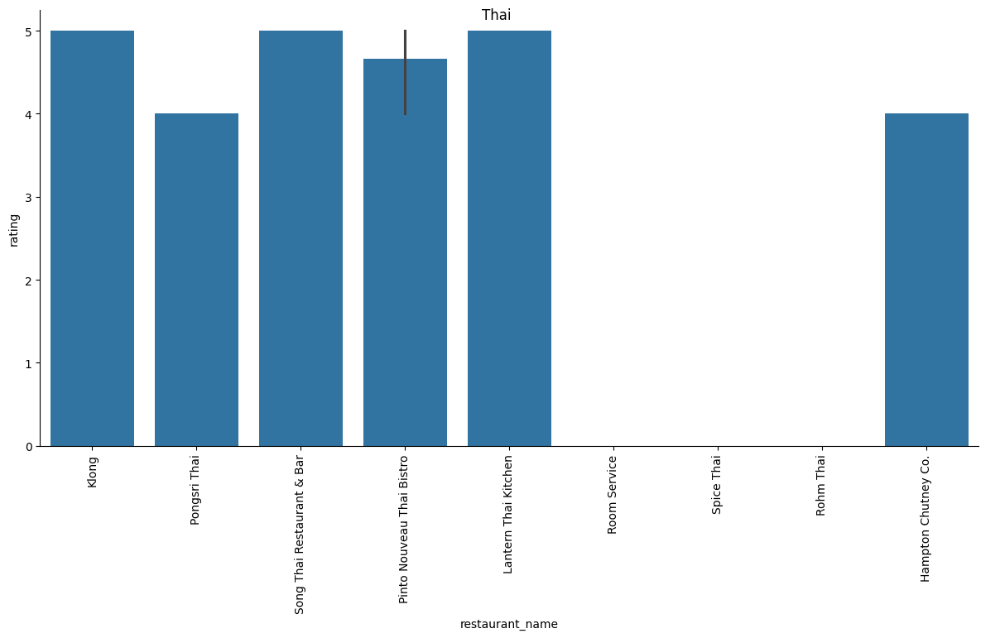

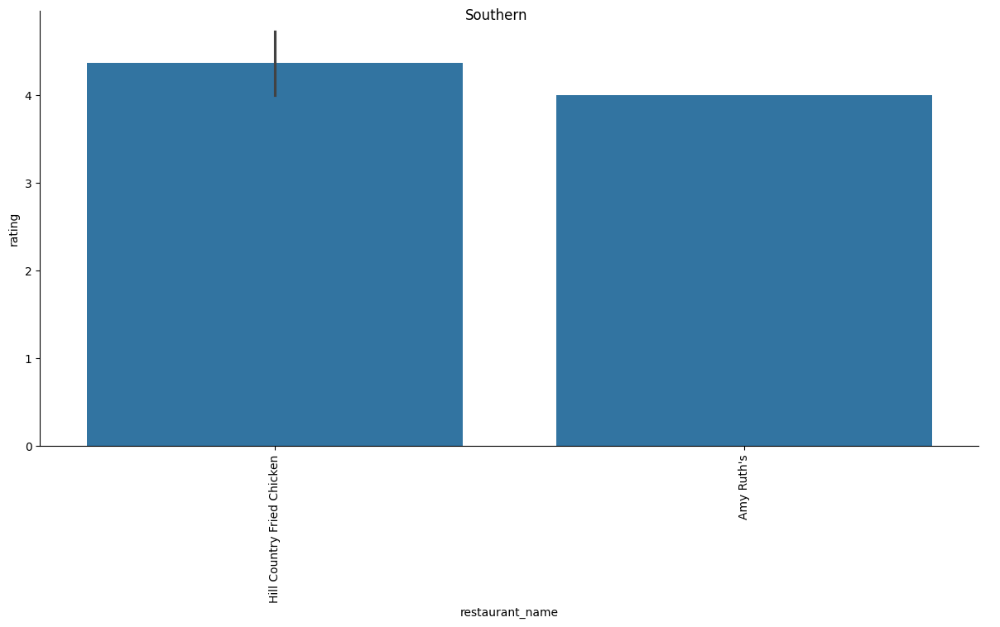

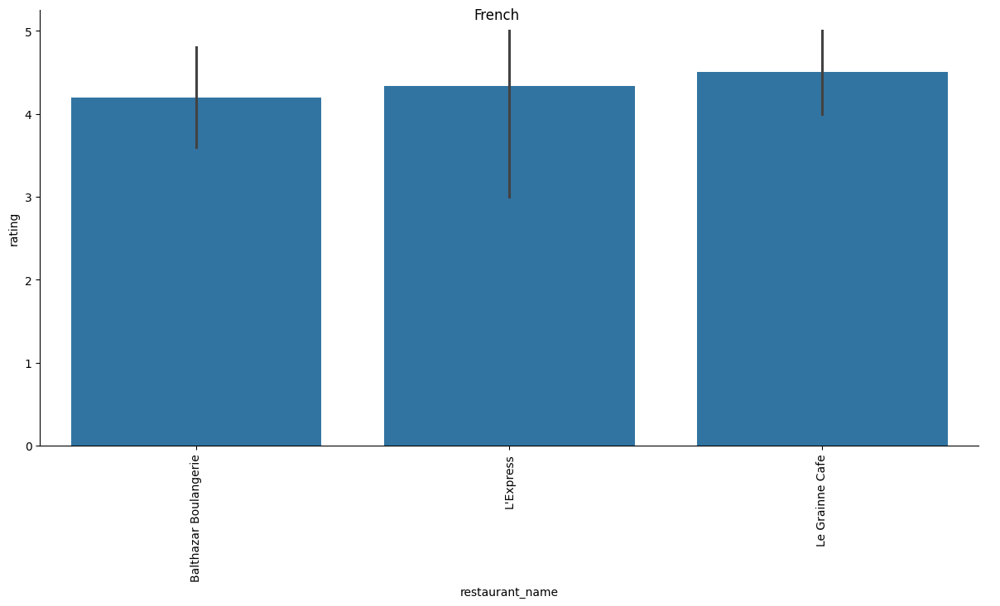

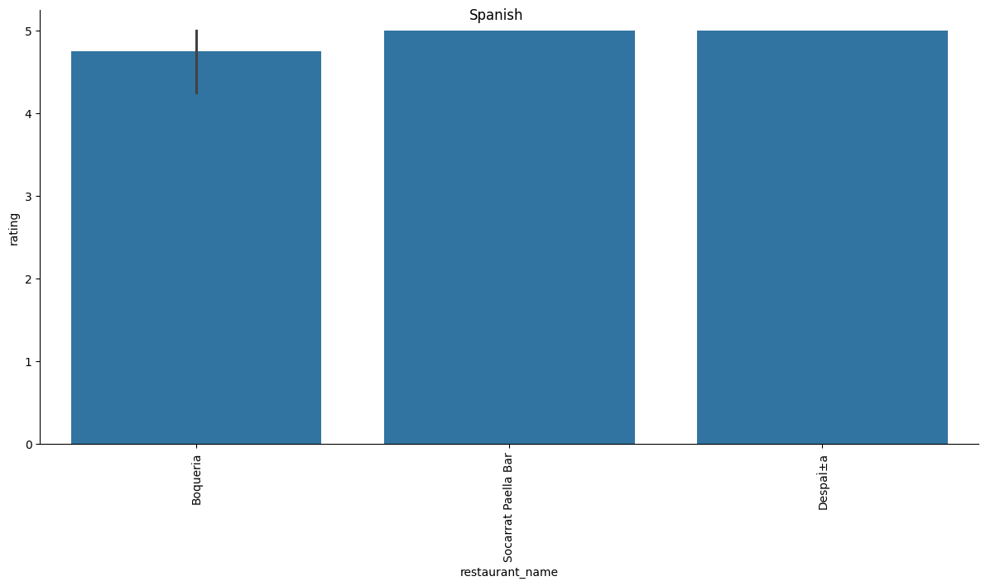

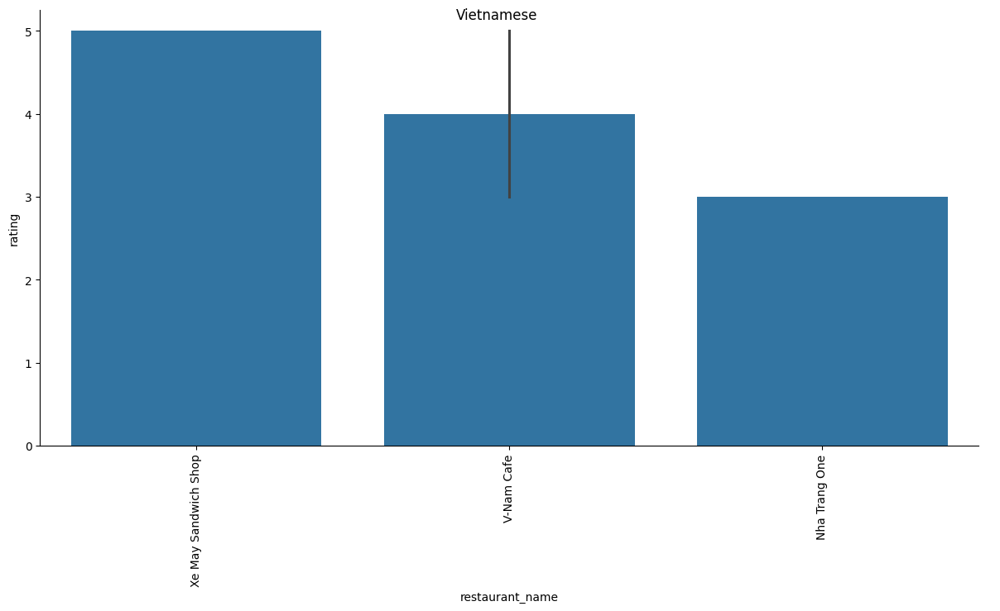

In [231]:
for cuisine in foodhub_df['cuisine_type'].unique():
    g = sns.catplot(data=foodhub_df[foodhub_df['cuisine_type']==cuisine],x='restaurant_name',y='rating',kind='bar', height = 6,aspect=2)
    g.fig.suptitle(cuisine)
    g.set_xticklabels(rotation=90)
    plt.show()

#### Observations on top 5 popular restaurants :
- Shake Shack -  average rating  is around 4.8
- The Meatball Shop - average rating  is around 4.5
- Blue Ribbon Sushi - average rating  is  around 4.2
- Blue Ribbon Fried Chicken - average rating  is  around 4.2
- Parm -  average rating  is around 4.1

### **Question 13:** The company wants to provide a promotional offer in the advertisement of the restaurants. The condition to get the offer is that the restaurants must have a rating count of more than 50 and the average rating should be greater than 4. Find the restaurants fulfilling the criteria to get the promotional offer. [3 marks]

In [232]:
# group by restaurant names and add the ratings to check if its more than 50 and check if the average rating is more than 4
# bool series will contain True/False values with restaurant names
bool_series = (foodhub_df.groupby(['restaurant_name'])['rating'].sum()>50) & (foodhub_df.groupby(['restaurant_name'])['rating'].mean()>4)
#we want to extract and print the restaurant names with True values
#Below statements helps access the index of True values
true_indices = bool_series[bool_series].index
print("Restaurants fulfilling the criteria to get the promotional offer:\n")
# print the restaurant names
for index in true_indices:
    print(index)

Restaurants fulfilling the criteria to get the promotional offer:

Bareburger
Blue Ribbon Fried Chicken
Blue Ribbon Sushi
Blue Ribbon Sushi Bar & Grill
Blue Ribbon Sushi Izakaya
Cafe Mogador
Chipotle Mexican Grill $1.99 Delivery
Five Guys Burgers and Fries
Han Dynasty
J. G. Melon
Jack's Wife Freda
Momoya
Nobu Next Door
Parm
RedFarm Broadway
RedFarm Hudson
Rubirosa
Shake Shack
Sushi of Gari 46
Sushi of Gari Tribeca
TAO
Tamarind TriBeCa
The Meatball Shop
The Smile
ilili Restaurant


#### Observations:


### **Question 14:** The company charges the restaurant 25% on the orders having cost greater than 20 dollars and 15% on the orders having cost greater than 5 dollars. Find the net revenue generated by the company across all orders. [3 marks]

In [233]:
#get the sum of the cost of orders greater than 20 dollars
total_cost_greater_than_20 = foodhub_df[foodhub_df['cost_of_the_order']>20]['cost_of_the_order'].sum()
#get the sum of cost of orders greater than 5 dollars
total_cost_greater_than_5 = foodhub_df[((foodhub_df['cost_of_the_order']>5) & (foodhub_df['cost_of_the_order']<=20))]['cost_of_the_order'].sum()
#calculate the net revenue
net_revenue = (total_cost_greater_than_20*0.25) + (total_cost_greater_than_5*0.15)
print("Net revenue generated by the company across all orders is: ",net_revenue)

Net revenue generated by the company across all orders is:  6166.303


#### Observations:


### **Question 15:** The company wants to analyze the total time required to deliver the food. What percentage of orders take more than 60 minutes to get delivered from the time the order is placed? (The food has to be prepared and then delivered.) [2 marks]

In [234]:
#total_time column has the calculated total time(food preparation time + delivery_time)
#filter rows whose total time is greater than 60 and Shape[0] returns the number of rows in the filtered dataframe
# Then divide this number by the number of rows and multiply by 100 to get the percentage
foodhub_df[foodhub_df['total_time']>60].shape[0]/foodhub_df.shape[0]*100

10.537407797681771

#### Observations:


### **Question 16:** The company wants to analyze the delivery time of the orders on weekdays and weekends. How does the mean delivery time vary during weekdays and weekends? [2 marks]

In [235]:
# calculate the mean delivery time on weekdays
weekday_deliverytime_mean = foodhub_df[foodhub_df['day_of_the_week']!='Weekend']['delivery_time'].mean()
print("Mean delivery time on weekdays is: ",weekday_deliverytime_mean)
# calculate the mean delivery time on weekends
weekend_deliverytime_mean = foodhub_df[foodhub_df['day_of_the_week']=='Weekend']['delivery_time'].mean()
print("Mean delivery time on weekends is: ",weekend_deliverytime_mean)
print("Mean delivery time on weekdays is more by",(weekday_deliverytime_mean-weekend_deliverytime_mean),"minutes when compared to weekends")

Mean delivery time on weekdays is:  28.340036563071298
Mean delivery time on weekends is:  22.4700222057735
Mean delivery time on weekdays is more by 5.870014357297798 minutes when compared to weekends


#### Observations:


### Conclusion and Recommendations

### **Question 17:** What are your conclusions from the analysis? What recommendations would you like to share to help improve the business? (You can use cuisine type and feedback ratings to drive your business recommendations.) [6 marks]

### Conclusions:
-  Shake Shack is the most popular restaurant and has the most orders followed by The Meatball Shop, Blue Ribbon Sushi and Blue Ribbon Fried Chicken.
- American cuisine type has the most popular cuisine followed by Japanese, Italian and Chinese cuisine type both on weekdays and weekends
- American cuisine type has the highest number of restaurants followed by Italian and Japanese.
- Around 71% the orders are placed on weekends and 28.8% of the orders are placed on weekdays
- Around 39% of the orders dont have customer ratings
- The average total time in the top 5 popular restaurants is 50 minutes on weekends and around 55 minutes in weekdays
- The average delivery time is more on weekdays by 5.87 minutes when compared to weekends
- The average cost of the order across the popular cuisines(American, Japanese, Italian and Chinese) is 17 dollars.
- The average customer rating across the popular cuisines is 4.4 to 4.5

### Recommendations:
- The cost of the order across cuisine types start as low as 5 dollars and the minimum  total time is 35 minutes. Business should come up with minimum cost of the order that a customer needs to place so that there is more value for time spent.
- The top 5 restaurants has average rating greater than 4.0 and rating count more than 50. We need to find ways to keep the momentum going
- More orders are placed in weekend. Need to make sure the order is delivered in a timely manner
- American is the most popular cuisine with average rating of 4.4 and total rating count of 1582. There are 3 top restaurants in American cuisine type out of top 5 restaurants.We need find ways to do promotional offer to keep the momentum.
- Apart from American cuisine, Japanese, Italian and Chinese Cuisine type are also popular.We need find ways to do promotional offer to keep the momentum.
- 39% of the orders are not rated. Find ways to get customers ratings and feedback.

---